# Suo

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Braun_age.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype(float)
adata.obs["age_categorical"] = adata.obs["age"].astype(str)
d = {i: ind for ind, i in enumerate(sorted(adata.obs["age"].astype(float).unique()))}
adata.obs["age_training"] = [d[float(i)] for i in adata.obs["age"]]
print(adata_file_path, flush=True)
print(adata, flush=True)

/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/processed/dataset_complete_Braun_age.h5ad


AnnData object with n_obs × n_vars = 882450 × 8192
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical', 'age_training'
    uns: 'rank_genes_groups'
    obsm: 'Unintegrated', 'X_pca', 'harmony'


In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|age_categorical",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 0.25,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 512,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "age_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=0.1, 
    limit_val_batches=0.1,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['age_categorical']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "braun_age-continuous_1"
)

vae.save(
    dir_path,
    overwrite=True,
)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: oipl9v89
Name: rich-snowball-596
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/oipl9v89
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240506_223241-oipl9v89/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `training` set. Number of elements in each group: 50192,47556,17695,49448,102479,14105,31006,52430,25201,40546,68478,22706,71020,81993,31105
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `validation` set. Number of elements in each group: 12452,12046,4488,12443,25693,3497,7759,12983,6199,10030,17270,5726,17770,20422,7712
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [02:16<22:45:15, 136.75s/it]

Epoch 1/600:   0%|          | 1/600 [02:16<22:45:15, 136.75s/it, v_num=89_1, total_loss_train=511, kl_local_train=39.5]

Epoch 2/600:   0%|          | 1/600 [02:16<22:45:15, 136.75s/it, v_num=89_1, total_loss_train=511, kl_local_train=39.5]

Epoch 2/600:   0%|          | 2/600 [02:28<10:27:52, 63.00s/it, v_num=89_1, total_loss_train=511, kl_local_train=39.5] 

Epoch 2/600:   0%|          | 2/600 [02:28<10:27:52, 63.00s/it, v_num=89_1, total_loss_train=457, kl_local_train=67.5]

Epoch 3/600:   0%|          | 2/600 [02:28<10:27:52, 63.00s/it, v_num=89_1, total_loss_train=457, kl_local_train=67.5]

Epoch 3/600:   0%|          | 3/600 [02:39<6:32:04, 39.40s/it, v_num=89_1, total_loss_train=457, kl_local_train=67.5] 

Epoch 3/600:   0%|          | 3/600 [02:39<6:32:04, 39.40s/it, v_num=89_1, total_loss_train=441, kl_local_train=76.3]

Epoch 4/600:   0%|          | 3/600 [02:39<6:32:04, 39.40s/it, v_num=89_1, total_loss_train=441, kl_local_train=76.3]

Epoch 4/600:   1%|          | 4/600 [02:50<4:41:20, 28.32s/it, v_num=89_1, total_loss_train=441, kl_local_train=76.3]

Epoch 4/600:   1%|          | 4/600 [02:50<4:41:20, 28.32s/it, v_num=89_1, total_loss_train=430, kl_local_train=82.4]

Epoch 5/600:   1%|          | 4/600 [02:50<4:41:20, 28.32s/it, v_num=89_1, total_loss_train=430, kl_local_train=82.4]

Epoch 5/600:   1%|          | 5/600 [03:02<3:40:56, 22.28s/it, v_num=89_1, total_loss_train=430, kl_local_train=82.4]

Epoch 5/600:   1%|          | 5/600 [03:02<3:40:56, 22.28s/it, v_num=89_1, total_loss_train=425, kl_local_train=84.8]

Epoch 6/600:   1%|          | 5/600 [03:02<3:40:56, 22.28s/it, v_num=89_1, total_loss_train=425, kl_local_train=84.8]

Epoch 6/600:   1%|          | 6/600 [03:14<3:05:31, 18.74s/it, v_num=89_1, total_loss_train=425, kl_local_train=84.8]

Epoch 6/600:   1%|          | 6/600 [03:14<3:05:31, 18.74s/it, v_num=89_1, total_loss_train=419, kl_local_train=83.4, metric_mi|age_categorical_train=0.125]

Epoch 7/600:   1%|          | 6/600 [03:14<3:05:31, 18.74s/it, v_num=89_1, total_loss_train=419, kl_local_train=83.4, metric_mi|age_categorical_train=0.125]

Epoch 7/600:   1%|          | 7/600 [03:25<2:41:28, 16.34s/it, v_num=89_1, total_loss_train=419, kl_local_train=83.4, metric_mi|age_categorical_train=0.125]

Epoch 7/600:   1%|          | 7/600 [03:25<2:41:28, 16.34s/it, v_num=89_1, total_loss_train=417, kl_local_train=81.6, metric_mi|age_categorical_train=0.125]

Epoch 8/600:   1%|          | 7/600 [03:25<2:41:28, 16.34s/it, v_num=89_1, total_loss_train=417, kl_local_train=81.6, metric_mi|age_categorical_train=0.125]

Epoch 8/600:   1%|▏         | 8/600 [03:36<2:25:37, 14.76s/it, v_num=89_1, total_loss_train=417, kl_local_train=81.6, metric_mi|age_categorical_train=0.125]

Epoch 8/600:   1%|▏         | 8/600 [03:36<2:25:37, 14.76s/it, v_num=89_1, total_loss_train=426, kl_local_train=108, metric_mi|age_categorical_train=0.125] 

Epoch 9/600:   1%|▏         | 8/600 [03:36<2:25:37, 14.76s/it, v_num=89_1, total_loss_train=426, kl_local_train=108, metric_mi|age_categorical_train=0.125]

Epoch 9/600:   2%|▏         | 9/600 [03:48<2:15:00, 13.71s/it, v_num=89_1, total_loss_train=426, kl_local_train=108, metric_mi|age_categorical_train=0.125]

Epoch 9/600:   2%|▏         | 9/600 [03:48<2:15:00, 13.71s/it, v_num=89_1, total_loss_train=427, kl_local_train=126, metric_mi|age_categorical_train=0.125]

Epoch 10/600:   2%|▏         | 9/600 [03:48<2:15:00, 13.71s/it, v_num=89_1, total_loss_train=427, kl_local_train=126, metric_mi|age_categorical_train=0.125]

Epoch 10/600:   2%|▏         | 10/600 [03:59<2:08:09, 13.03s/it, v_num=89_1, total_loss_train=427, kl_local_train=126, metric_mi|age_categorical_train=0.125]

Epoch 10/600:   2%|▏         | 10/600 [03:59<2:08:09, 13.03s/it, v_num=89_1, total_loss_train=421, kl_local_train=170, metric_mi|age_categorical_train=0.125]

Epoch 11/600:   2%|▏         | 10/600 [04:00<2:08:09, 13.03s/it, v_num=89_1, total_loss_train=421, kl_local_train=170, metric_mi|age_categorical_train=0.125]

Epoch 11/600:   2%|▏         | 11/600 [04:11<2:04:32, 12.69s/it, v_num=89_1, total_loss_train=421, kl_local_train=170, metric_mi|age_categorical_train=0.125]

Epoch 11/600:   2%|▏         | 11/600 [04:11<2:04:32, 12.69s/it, v_num=89_1, total_loss_train=423, kl_local_train=194, metric_mi|age_categorical_train=0.19] 

Epoch 12/600:   2%|▏         | 11/600 [04:11<2:04:32, 12.69s/it, v_num=89_1, total_loss_train=423, kl_local_train=194, metric_mi|age_categorical_train=0.19]

Epoch 12/600:   2%|▏         | 12/600 [04:23<2:00:47, 12.33s/it, v_num=89_1, total_loss_train=423, kl_local_train=194, metric_mi|age_categorical_train=0.19]

Epoch 12/600:   2%|▏         | 12/600 [04:23<2:00:47, 12.33s/it, v_num=89_1, total_loss_train=422, kl_local_train=210, metric_mi|age_categorical_train=0.19]

Epoch 13/600:   2%|▏         | 12/600 [04:23<2:00:47, 12.33s/it, v_num=89_1, total_loss_train=422, kl_local_train=210, metric_mi|age_categorical_train=0.19]

Epoch 13/600:   2%|▏         | 13/600 [04:34<1:57:57, 12.06s/it, v_num=89_1, total_loss_train=422, kl_local_train=210, metric_mi|age_categorical_train=0.19]

Epoch 13/600:   2%|▏         | 13/600 [04:34<1:57:57, 12.06s/it, v_num=89_1, total_loss_train=424, kl_local_train=228, metric_mi|age_categorical_train=0.19]

Epoch 14/600:   2%|▏         | 13/600 [04:34<1:57:57, 12.06s/it, v_num=89_1, total_loss_train=424, kl_local_train=228, metric_mi|age_categorical_train=0.19]

Epoch 14/600:   2%|▏         | 14/600 [04:46<1:55:42, 11.85s/it, v_num=89_1, total_loss_train=424, kl_local_train=228, metric_mi|age_categorical_train=0.19]

Epoch 14/600:   2%|▏         | 14/600 [04:46<1:55:42, 11.85s/it, v_num=89_1, total_loss_train=426, kl_local_train=236, metric_mi|age_categorical_train=0.19]

Epoch 15/600:   2%|▏         | 14/600 [04:46<1:55:42, 11.85s/it, v_num=89_1, total_loss_train=426, kl_local_train=236, metric_mi|age_categorical_train=0.19]

Epoch 15/600:   2%|▎         | 15/600 [04:57<1:54:52, 11.78s/it, v_num=89_1, total_loss_train=426, kl_local_train=236, metric_mi|age_categorical_train=0.19]

Epoch 15/600:   2%|▎         | 15/600 [04:57<1:54:52, 11.78s/it, v_num=89_1, total_loss_train=426, kl_local_train=247, metric_mi|age_categorical_train=0.19]

Epoch 16/600:   2%|▎         | 15/600 [04:58<1:54:52, 11.78s/it, v_num=89_1, total_loss_train=426, kl_local_train=247, metric_mi|age_categorical_train=0.19]

Epoch 16/600:   3%|▎         | 16/600 [05:09<1:55:20, 11.85s/it, v_num=89_1, total_loss_train=426, kl_local_train=247, metric_mi|age_categorical_train=0.19]

Epoch 16/600:   3%|▎         | 16/600 [05:09<1:55:20, 11.85s/it, v_num=89_1, total_loss_train=428, kl_local_train=255, metric_mi|age_categorical_train=0.234]

Epoch 17/600:   3%|▎         | 16/600 [05:09<1:55:20, 11.85s/it, v_num=89_1, total_loss_train=428, kl_local_train=255, metric_mi|age_categorical_train=0.234]

Epoch 17/600:   3%|▎         | 17/600 [05:21<1:53:39, 11.70s/it, v_num=89_1, total_loss_train=428, kl_local_train=255, metric_mi|age_categorical_train=0.234]

Epoch 17/600:   3%|▎         | 17/600 [05:21<1:53:39, 11.70s/it, v_num=89_1, total_loss_train=429, kl_local_train=260, metric_mi|age_categorical_train=0.234]

Epoch 18/600:   3%|▎         | 17/600 [05:21<1:53:39, 11.70s/it, v_num=89_1, total_loss_train=429, kl_local_train=260, metric_mi|age_categorical_train=0.234]

Epoch 18/600:   3%|▎         | 18/600 [05:32<1:52:14, 11.57s/it, v_num=89_1, total_loss_train=429, kl_local_train=260, metric_mi|age_categorical_train=0.234]

Epoch 18/600:   3%|▎         | 18/600 [05:32<1:52:14, 11.57s/it, v_num=89_1, total_loss_train=431, kl_local_train=265, metric_mi|age_categorical_train=0.234]

Epoch 19/600:   3%|▎         | 18/600 [05:32<1:52:14, 11.57s/it, v_num=89_1, total_loss_train=431, kl_local_train=265, metric_mi|age_categorical_train=0.234]

Epoch 19/600:   3%|▎         | 19/600 [05:43<1:51:16, 11.49s/it, v_num=89_1, total_loss_train=431, kl_local_train=265, metric_mi|age_categorical_train=0.234]

Epoch 19/600:   3%|▎         | 19/600 [05:43<1:51:16, 11.49s/it, v_num=89_1, total_loss_train=432, kl_local_train=277, metric_mi|age_categorical_train=0.234]

Epoch 20/600:   3%|▎         | 19/600 [05:43<1:51:16, 11.49s/it, v_num=89_1, total_loss_train=432, kl_local_train=277, metric_mi|age_categorical_train=0.234]

Epoch 20/600:   3%|▎         | 20/600 [05:55<1:51:07, 11.50s/it, v_num=89_1, total_loss_train=432, kl_local_train=277, metric_mi|age_categorical_train=0.234]

Epoch 20/600:   3%|▎         | 20/600 [05:55<1:51:07, 11.50s/it, v_num=89_1, total_loss_train=436, kl_local_train=281, metric_mi|age_categorical_train=0.234]

Epoch 21/600:   3%|▎         | 20/600 [05:55<1:51:07, 11.50s/it, v_num=89_1, total_loss_train=436, kl_local_train=281, metric_mi|age_categorical_train=0.234]

Epoch 21/600:   4%|▎         | 21/600 [06:07<1:51:54, 11.60s/it, v_num=89_1, total_loss_train=436, kl_local_train=281, metric_mi|age_categorical_train=0.234]

Epoch 21/600:   4%|▎         | 21/600 [06:07<1:51:54, 11.60s/it, v_num=89_1, total_loss_train=436, kl_local_train=282, metric_mi|age_categorical_train=0.241]

Epoch 22/600:   4%|▎         | 21/600 [06:07<1:51:54, 11.60s/it, v_num=89_1, total_loss_train=436, kl_local_train=282, metric_mi|age_categorical_train=0.241]

Epoch 22/600:   4%|▎         | 22/600 [06:18<1:50:57, 11.52s/it, v_num=89_1, total_loss_train=436, kl_local_train=282, metric_mi|age_categorical_train=0.241]

Epoch 22/600:   4%|▎         | 22/600 [06:18<1:50:57, 11.52s/it, v_num=89_1, total_loss_train=438, kl_local_train=285, metric_mi|age_categorical_train=0.241]

Epoch 23/600:   4%|▎         | 22/600 [06:18<1:50:57, 11.52s/it, v_num=89_1, total_loss_train=438, kl_local_train=285, metric_mi|age_categorical_train=0.241]

Epoch 23/600:   4%|▍         | 23/600 [06:29<1:50:11, 11.46s/it, v_num=89_1, total_loss_train=438, kl_local_train=285, metric_mi|age_categorical_train=0.241]

Epoch 23/600:   4%|▍         | 23/600 [06:29<1:50:11, 11.46s/it, v_num=89_1, total_loss_train=438, kl_local_train=289, metric_mi|age_categorical_train=0.241]

Epoch 24/600:   4%|▍         | 23/600 [06:29<1:50:11, 11.46s/it, v_num=89_1, total_loss_train=438, kl_local_train=289, metric_mi|age_categorical_train=0.241]

Epoch 24/600:   4%|▍         | 24/600 [06:41<1:49:38, 11.42s/it, v_num=89_1, total_loss_train=438, kl_local_train=289, metric_mi|age_categorical_train=0.241]

Epoch 24/600:   4%|▍         | 24/600 [06:41<1:49:38, 11.42s/it, v_num=89_1, total_loss_train=439, kl_local_train=296, metric_mi|age_categorical_train=0.241]

Epoch 25/600:   4%|▍         | 24/600 [06:41<1:49:38, 11.42s/it, v_num=89_1, total_loss_train=439, kl_local_train=296, metric_mi|age_categorical_train=0.241]

Epoch 25/600:   4%|▍         | 25/600 [06:52<1:49:42, 11.45s/it, v_num=89_1, total_loss_train=439, kl_local_train=296, metric_mi|age_categorical_train=0.241]

Epoch 25/600:   4%|▍         | 25/600 [06:52<1:49:42, 11.45s/it, v_num=89_1, total_loss_train=442, kl_local_train=301, metric_mi|age_categorical_train=0.241]

Epoch 26/600:   4%|▍         | 25/600 [06:53<1:49:42, 11.45s/it, v_num=89_1, total_loss_train=442, kl_local_train=301, metric_mi|age_categorical_train=0.241]

Epoch 26/600:   4%|▍         | 26/600 [07:04<1:50:39, 11.57s/it, v_num=89_1, total_loss_train=442, kl_local_train=301, metric_mi|age_categorical_train=0.241]

Epoch 26/600:   4%|▍         | 26/600 [07:04<1:50:39, 11.57s/it, v_num=89_1, total_loss_train=443, kl_local_train=299, metric_mi|age_categorical_train=0.242]

Epoch 27/600:   4%|▍         | 26/600 [07:04<1:50:39, 11.57s/it, v_num=89_1, total_loss_train=443, kl_local_train=299, metric_mi|age_categorical_train=0.242]

Epoch 27/600:   4%|▍         | 27/600 [07:15<1:49:44, 11.49s/it, v_num=89_1, total_loss_train=443, kl_local_train=299, metric_mi|age_categorical_train=0.242]

Epoch 27/600:   4%|▍         | 27/600 [07:15<1:49:44, 11.49s/it, v_num=89_1, total_loss_train=445, kl_local_train=303, metric_mi|age_categorical_train=0.242]

Epoch 28/600:   4%|▍         | 27/600 [07:15<1:49:44, 11.49s/it, v_num=89_1, total_loss_train=445, kl_local_train=303, metric_mi|age_categorical_train=0.242]

Epoch 28/600:   5%|▍         | 28/600 [07:27<1:49:07, 11.45s/it, v_num=89_1, total_loss_train=445, kl_local_train=303, metric_mi|age_categorical_train=0.242]

Epoch 28/600:   5%|▍         | 28/600 [07:27<1:49:07, 11.45s/it, v_num=89_1, total_loss_train=448, kl_local_train=309, metric_mi|age_categorical_train=0.242]

Epoch 29/600:   5%|▍         | 28/600 [07:27<1:49:07, 11.45s/it, v_num=89_1, total_loss_train=448, kl_local_train=309, metric_mi|age_categorical_train=0.242]

Epoch 29/600:   5%|▍         | 29/600 [07:38<1:48:34, 11.41s/it, v_num=89_1, total_loss_train=448, kl_local_train=309, metric_mi|age_categorical_train=0.242]

Epoch 29/600:   5%|▍         | 29/600 [07:38<1:48:34, 11.41s/it, v_num=89_1, total_loss_train=447, kl_local_train=308, metric_mi|age_categorical_train=0.242]

Epoch 30/600:   5%|▍         | 29/600 [07:38<1:48:34, 11.41s/it, v_num=89_1, total_loss_train=447, kl_local_train=308, metric_mi|age_categorical_train=0.242]

Epoch 30/600:   5%|▌         | 30/600 [07:49<1:48:40, 11.44s/it, v_num=89_1, total_loss_train=447, kl_local_train=308, metric_mi|age_categorical_train=0.242]

Epoch 30/600:   5%|▌         | 30/600 [07:49<1:48:40, 11.44s/it, v_num=89_1, total_loss_train=453, kl_local_train=312, metric_mi|age_categorical_train=0.242]

Epoch 31/600:   5%|▌         | 30/600 [07:50<1:48:40, 11.44s/it, v_num=89_1, total_loss_train=453, kl_local_train=312, metric_mi|age_categorical_train=0.242]

Epoch 31/600:   5%|▌         | 31/600 [08:01<1:49:38, 11.56s/it, v_num=89_1, total_loss_train=453, kl_local_train=312, metric_mi|age_categorical_train=0.242]

Epoch 31/600:   5%|▌         | 31/600 [08:01<1:49:38, 11.56s/it, v_num=89_1, total_loss_train=452, kl_local_train=319, metric_mi|age_categorical_train=0.248]

Epoch 32/600:   5%|▌         | 31/600 [08:01<1:49:38, 11.56s/it, v_num=89_1, total_loss_train=452, kl_local_train=319, metric_mi|age_categorical_train=0.248]

Epoch 32/600:   5%|▌         | 32/600 [08:13<1:49:16, 11.54s/it, v_num=89_1, total_loss_train=452, kl_local_train=319, metric_mi|age_categorical_train=0.248]

Epoch 32/600:   5%|▌         | 32/600 [08:13<1:49:16, 11.54s/it, v_num=89_1, total_loss_train=453, kl_local_train=315, metric_mi|age_categorical_train=0.248]

Epoch 33/600:   5%|▌         | 32/600 [08:13<1:49:16, 11.54s/it, v_num=89_1, total_loss_train=453, kl_local_train=315, metric_mi|age_categorical_train=0.248]

Epoch 33/600:   6%|▌         | 33/600 [08:24<1:48:29, 11.48s/it, v_num=89_1, total_loss_train=453, kl_local_train=315, metric_mi|age_categorical_train=0.248]

Epoch 33/600:   6%|▌         | 33/600 [08:24<1:48:29, 11.48s/it, v_num=89_1, total_loss_train=457, kl_local_train=322, metric_mi|age_categorical_train=0.248]

Epoch 34/600:   6%|▌         | 33/600 [08:24<1:48:29, 11.48s/it, v_num=89_1, total_loss_train=457, kl_local_train=322, metric_mi|age_categorical_train=0.248]

Epoch 34/600:   6%|▌         | 34/600 [08:35<1:47:51, 11.43s/it, v_num=89_1, total_loss_train=457, kl_local_train=322, metric_mi|age_categorical_train=0.248]

Epoch 34/600:   6%|▌         | 34/600 [08:35<1:47:51, 11.43s/it, v_num=89_1, total_loss_train=461, kl_local_train=321, metric_mi|age_categorical_train=0.248]

Epoch 35/600:   6%|▌         | 34/600 [08:35<1:47:51, 11.43s/it, v_num=89_1, total_loss_train=461, kl_local_train=321, metric_mi|age_categorical_train=0.248]

Epoch 35/600:   6%|▌         | 35/600 [08:47<1:47:52, 11.46s/it, v_num=89_1, total_loss_train=461, kl_local_train=321, metric_mi|age_categorical_train=0.248]

Epoch 35/600:   6%|▌         | 35/600 [08:47<1:47:52, 11.46s/it, v_num=89_1, total_loss_train=459, kl_local_train=314, metric_mi|age_categorical_train=0.248]

Epoch 36/600:   6%|▌         | 35/600 [08:47<1:47:52, 11.46s/it, v_num=89_1, total_loss_train=459, kl_local_train=314, metric_mi|age_categorical_train=0.248]

Epoch 36/600:   6%|▌         | 36/600 [08:59<1:48:50, 11.58s/it, v_num=89_1, total_loss_train=459, kl_local_train=314, metric_mi|age_categorical_train=0.248]

Epoch 36/600:   6%|▌         | 36/600 [08:59<1:48:50, 11.58s/it, v_num=89_1, total_loss_train=465, kl_local_train=316, metric_mi|age_categorical_train=0.258]

Epoch 37/600:   6%|▌         | 36/600 [08:59<1:48:50, 11.58s/it, v_num=89_1, total_loss_train=465, kl_local_train=316, metric_mi|age_categorical_train=0.258]

Epoch 37/600:   6%|▌         | 37/600 [09:10<1:48:01, 11.51s/it, v_num=89_1, total_loss_train=465, kl_local_train=316, metric_mi|age_categorical_train=0.258]

Epoch 37/600:   6%|▌         | 37/600 [09:10<1:48:01, 11.51s/it, v_num=89_1, total_loss_train=463, kl_local_train=316, metric_mi|age_categorical_train=0.258]

Epoch 38/600:   6%|▌         | 37/600 [09:10<1:48:01, 11.51s/it, v_num=89_1, total_loss_train=463, kl_local_train=316, metric_mi|age_categorical_train=0.258]

Epoch 38/600:   6%|▋         | 38/600 [09:21<1:47:28, 11.47s/it, v_num=89_1, total_loss_train=463, kl_local_train=316, metric_mi|age_categorical_train=0.258]

Epoch 38/600:   6%|▋         | 38/600 [09:21<1:47:28, 11.47s/it, v_num=89_1, total_loss_train=467, kl_local_train=319, metric_mi|age_categorical_train=0.258]

Epoch 39/600:   6%|▋         | 38/600 [09:21<1:47:28, 11.47s/it, v_num=89_1, total_loss_train=467, kl_local_train=319, metric_mi|age_categorical_train=0.258]

Epoch 39/600:   6%|▋         | 39/600 [09:33<1:47:06, 11.46s/it, v_num=89_1, total_loss_train=467, kl_local_train=319, metric_mi|age_categorical_train=0.258]

Epoch 39/600:   6%|▋         | 39/600 [09:33<1:47:06, 11.46s/it, v_num=89_1, total_loss_train=467, kl_local_train=310, metric_mi|age_categorical_train=0.258]

Epoch 40/600:   6%|▋         | 39/600 [09:33<1:47:06, 11.46s/it, v_num=89_1, total_loss_train=467, kl_local_train=310, metric_mi|age_categorical_train=0.258]

Epoch 40/600:   7%|▋         | 40/600 [09:44<1:46:59, 11.46s/it, v_num=89_1, total_loss_train=467, kl_local_train=310, metric_mi|age_categorical_train=0.258]

Epoch 40/600:   7%|▋         | 40/600 [09:44<1:46:59, 11.46s/it, v_num=89_1, total_loss_train=471, kl_local_train=314, metric_mi|age_categorical_train=0.258]

Epoch 41/600:   7%|▋         | 40/600 [09:45<1:46:59, 11.46s/it, v_num=89_1, total_loss_train=471, kl_local_train=314, metric_mi|age_categorical_train=0.258]

Epoch 41/600:   7%|▋         | 41/600 [09:56<1:47:41, 11.56s/it, v_num=89_1, total_loss_train=471, kl_local_train=314, metric_mi|age_categorical_train=0.258]

Epoch 41/600:   7%|▋         | 41/600 [09:56<1:47:41, 11.56s/it, v_num=89_1, total_loss_train=473, kl_local_train=306, metric_mi|age_categorical_train=0.253]

Epoch 42/600:   7%|▋         | 41/600 [09:56<1:47:41, 11.56s/it, v_num=89_1, total_loss_train=473, kl_local_train=306, metric_mi|age_categorical_train=0.253]

Epoch 42/600:   7%|▋         | 42/600 [10:08<1:46:56, 11.50s/it, v_num=89_1, total_loss_train=473, kl_local_train=306, metric_mi|age_categorical_train=0.253]

Epoch 42/600:   7%|▋         | 42/600 [10:08<1:46:56, 11.50s/it, v_num=89_1, total_loss_train=473, kl_local_train=306, metric_mi|age_categorical_train=0.253]

Epoch 43/600:   7%|▋         | 42/600 [10:08<1:46:56, 11.50s/it, v_num=89_1, total_loss_train=473, kl_local_train=306, metric_mi|age_categorical_train=0.253]

Epoch 43/600:   7%|▋         | 43/600 [10:19<1:46:30, 11.47s/it, v_num=89_1, total_loss_train=473, kl_local_train=306, metric_mi|age_categorical_train=0.253]

Epoch 43/600:   7%|▋         | 43/600 [10:19<1:46:30, 11.47s/it, v_num=89_1, total_loss_train=476, kl_local_train=299, metric_mi|age_categorical_train=0.253]

Epoch 44/600:   7%|▋         | 43/600 [10:19<1:46:30, 11.47s/it, v_num=89_1, total_loss_train=476, kl_local_train=299, metric_mi|age_categorical_train=0.253]

Epoch 44/600:   7%|▋         | 44/600 [10:30<1:45:55, 11.43s/it, v_num=89_1, total_loss_train=476, kl_local_train=299, metric_mi|age_categorical_train=0.253]

Epoch 44/600:   7%|▋         | 44/600 [10:30<1:45:55, 11.43s/it, v_num=89_1, total_loss_train=479, kl_local_train=297, metric_mi|age_categorical_train=0.253]

Epoch 45/600:   7%|▋         | 44/600 [10:30<1:45:55, 11.43s/it, v_num=89_1, total_loss_train=479, kl_local_train=297, metric_mi|age_categorical_train=0.253]

Epoch 45/600:   8%|▊         | 45/600 [10:42<1:45:53, 11.45s/it, v_num=89_1, total_loss_train=479, kl_local_train=297, metric_mi|age_categorical_train=0.253]

Epoch 45/600:   8%|▊         | 45/600 [10:42<1:45:53, 11.45s/it, v_num=89_1, total_loss_train=481, kl_local_train=304, metric_mi|age_categorical_train=0.253]

Epoch 46/600:   8%|▊         | 45/600 [10:42<1:45:53, 11.45s/it, v_num=89_1, total_loss_train=481, kl_local_train=304, metric_mi|age_categorical_train=0.253]

Epoch 46/600:   8%|▊         | 46/600 [10:54<1:46:49, 11.57s/it, v_num=89_1, total_loss_train=481, kl_local_train=304, metric_mi|age_categorical_train=0.253]

Epoch 46/600:   8%|▊         | 46/600 [10:54<1:46:49, 11.57s/it, v_num=89_1, total_loss_train=482, kl_local_train=300, metric_mi|age_categorical_train=0.246]

Epoch 47/600:   8%|▊         | 46/600 [10:54<1:46:49, 11.57s/it, v_num=89_1, total_loss_train=482, kl_local_train=300, metric_mi|age_categorical_train=0.246]

Epoch 47/600:   8%|▊         | 47/600 [11:05<1:46:03, 11.51s/it, v_num=89_1, total_loss_train=482, kl_local_train=300, metric_mi|age_categorical_train=0.246]

Epoch 47/600:   8%|▊         | 47/600 [11:05<1:46:03, 11.51s/it, v_num=89_1, total_loss_train=484, kl_local_train=299, metric_mi|age_categorical_train=0.246]

Epoch 48/600:   8%|▊         | 47/600 [11:05<1:46:03, 11.51s/it, v_num=89_1, total_loss_train=484, kl_local_train=299, metric_mi|age_categorical_train=0.246]

Epoch 48/600:   8%|▊         | 48/600 [11:16<1:45:26, 11.46s/it, v_num=89_1, total_loss_train=484, kl_local_train=299, metric_mi|age_categorical_train=0.246]

Epoch 48/600:   8%|▊         | 48/600 [11:16<1:45:26, 11.46s/it, v_num=89_1, total_loss_train=487, kl_local_train=295, metric_mi|age_categorical_train=0.246]

Epoch 49/600:   8%|▊         | 48/600 [11:16<1:45:26, 11.46s/it, v_num=89_1, total_loss_train=487, kl_local_train=295, metric_mi|age_categorical_train=0.246]

Epoch 49/600:   8%|▊         | 49/600 [11:28<1:44:59, 11.43s/it, v_num=89_1, total_loss_train=487, kl_local_train=295, metric_mi|age_categorical_train=0.246]

Epoch 49/600:   8%|▊         | 49/600 [11:28<1:44:59, 11.43s/it, v_num=89_1, total_loss_train=489, kl_local_train=299, metric_mi|age_categorical_train=0.246]

Epoch 50/600:   8%|▊         | 49/600 [11:28<1:44:59, 11.43s/it, v_num=89_1, total_loss_train=489, kl_local_train=299, metric_mi|age_categorical_train=0.246]

Epoch 50/600:   8%|▊         | 50/600 [11:39<1:45:01, 11.46s/it, v_num=89_1, total_loss_train=489, kl_local_train=299, metric_mi|age_categorical_train=0.246]

Epoch 50/600:   8%|▊         | 50/600 [11:39<1:45:01, 11.46s/it, v_num=89_1, total_loss_train=491, kl_local_train=302, metric_mi|age_categorical_train=0.246]

Epoch 51/600:   8%|▊         | 50/600 [11:40<1:45:01, 11.46s/it, v_num=89_1, total_loss_train=491, kl_local_train=302, metric_mi|age_categorical_train=0.246]

Epoch 51/600:   8%|▊         | 51/600 [11:51<1:45:52, 11.57s/it, v_num=89_1, total_loss_train=491, kl_local_train=302, metric_mi|age_categorical_train=0.246]

Epoch 51/600:   8%|▊         | 51/600 [11:51<1:45:52, 11.57s/it, v_num=89_1, total_loss_train=491, kl_local_train=297, metric_mi|age_categorical_train=0.25] 

Epoch 52/600:   8%|▊         | 51/600 [11:51<1:45:52, 11.57s/it, v_num=89_1, total_loss_train=491, kl_local_train=297, metric_mi|age_categorical_train=0.25]

Epoch 52/600:   9%|▊         | 52/600 [12:02<1:45:08, 11.51s/it, v_num=89_1, total_loss_train=491, kl_local_train=297, metric_mi|age_categorical_train=0.25]

Epoch 52/600:   9%|▊         | 52/600 [12:02<1:45:08, 11.51s/it, v_num=89_1, total_loss_train=489, kl_local_train=299, metric_mi|age_categorical_train=0.25]

Epoch 53/600:   9%|▊         | 52/600 [12:02<1:45:08, 11.51s/it, v_num=89_1, total_loss_train=489, kl_local_train=299, metric_mi|age_categorical_train=0.25]

Epoch 53/600:   9%|▉         | 53/600 [12:14<1:44:38, 11.48s/it, v_num=89_1, total_loss_train=489, kl_local_train=299, metric_mi|age_categorical_train=0.25]

Epoch 53/600:   9%|▉         | 53/600 [12:14<1:44:38, 11.48s/it, v_num=89_1, total_loss_train=490, kl_local_train=301, metric_mi|age_categorical_train=0.25]

Epoch 54/600:   9%|▉         | 53/600 [12:14<1:44:38, 11.48s/it, v_num=89_1, total_loss_train=490, kl_local_train=301, metric_mi|age_categorical_train=0.25]

Epoch 54/600:   9%|▉         | 54/600 [12:25<1:44:05, 11.44s/it, v_num=89_1, total_loss_train=490, kl_local_train=301, metric_mi|age_categorical_train=0.25]

Epoch 54/600:   9%|▉         | 54/600 [12:25<1:44:05, 11.44s/it, v_num=89_1, total_loss_train=489, kl_local_train=300, metric_mi|age_categorical_train=0.25]

Epoch 55/600:   9%|▉         | 54/600 [12:25<1:44:05, 11.44s/it, v_num=89_1, total_loss_train=489, kl_local_train=300, metric_mi|age_categorical_train=0.25]

Epoch 55/600:   9%|▉         | 55/600 [12:37<1:43:59, 11.45s/it, v_num=89_1, total_loss_train=489, kl_local_train=300, metric_mi|age_categorical_train=0.25]

Epoch 55/600:   9%|▉         | 55/600 [12:37<1:43:59, 11.45s/it, v_num=89_1, total_loss_train=491, kl_local_train=294, metric_mi|age_categorical_train=0.25]

Epoch 56/600:   9%|▉         | 55/600 [12:37<1:43:59, 11.45s/it, v_num=89_1, total_loss_train=491, kl_local_train=294, metric_mi|age_categorical_train=0.25]

Epoch 56/600:   9%|▉         | 56/600 [12:48<1:44:53, 11.57s/it, v_num=89_1, total_loss_train=491, kl_local_train=294, metric_mi|age_categorical_train=0.25]

Epoch 56/600:   9%|▉         | 56/600 [12:48<1:44:53, 11.57s/it, v_num=89_1, total_loss_train=492, kl_local_train=297, metric_mi|age_categorical_train=0.242]

Epoch 57/600:   9%|▉         | 56/600 [12:48<1:44:53, 11.57s/it, v_num=89_1, total_loss_train=492, kl_local_train=297, metric_mi|age_categorical_train=0.242]

Epoch 57/600:  10%|▉         | 57/600 [13:00<1:44:08, 11.51s/it, v_num=89_1, total_loss_train=492, kl_local_train=297, metric_mi|age_categorical_train=0.242]

Epoch 57/600:  10%|▉         | 57/600 [13:00<1:44:08, 11.51s/it, v_num=89_1, total_loss_train=492, kl_local_train=297, metric_mi|age_categorical_train=0.242]

Epoch 58/600:  10%|▉         | 57/600 [13:00<1:44:08, 11.51s/it, v_num=89_1, total_loss_train=492, kl_local_train=297, metric_mi|age_categorical_train=0.242]

Epoch 58/600:  10%|▉         | 58/600 [13:11<1:43:48, 11.49s/it, v_num=89_1, total_loss_train=492, kl_local_train=297, metric_mi|age_categorical_train=0.242]

Epoch 58/600:  10%|▉         | 58/600 [13:11<1:43:48, 11.49s/it, v_num=89_1, total_loss_train=493, kl_local_train=291, metric_mi|age_categorical_train=0.242]

Epoch 59/600:  10%|▉         | 58/600 [13:11<1:43:48, 11.49s/it, v_num=89_1, total_loss_train=493, kl_local_train=291, metric_mi|age_categorical_train=0.242]

Epoch 59/600:  10%|▉         | 59/600 [13:23<1:43:18, 11.46s/it, v_num=89_1, total_loss_train=493, kl_local_train=291, metric_mi|age_categorical_train=0.242]

Epoch 59/600:  10%|▉         | 59/600 [13:23<1:43:18, 11.46s/it, v_num=89_1, total_loss_train=492, kl_local_train=288, metric_mi|age_categorical_train=0.242]

Epoch 60/600:  10%|▉         | 59/600 [13:23<1:43:18, 11.46s/it, v_num=89_1, total_loss_train=492, kl_local_train=288, metric_mi|age_categorical_train=0.242]

Epoch 60/600:  10%|█         | 60/600 [13:34<1:43:11, 11.46s/it, v_num=89_1, total_loss_train=492, kl_local_train=288, metric_mi|age_categorical_train=0.242]

Epoch 60/600:  10%|█         | 60/600 [13:34<1:43:11, 11.46s/it, v_num=89_1, total_loss_train=492, kl_local_train=290, metric_mi|age_categorical_train=0.242]

Epoch 61/600:  10%|█         | 60/600 [13:35<1:43:11, 11.46s/it, v_num=89_1, total_loss_train=492, kl_local_train=290, metric_mi|age_categorical_train=0.242]

Epoch 61/600:  10%|█         | 61/600 [13:46<1:44:01, 11.58s/it, v_num=89_1, total_loss_train=492, kl_local_train=290, metric_mi|age_categorical_train=0.242]

Epoch 61/600:  10%|█         | 61/600 [13:46<1:44:01, 11.58s/it, v_num=89_1, total_loss_train=491, kl_local_train=288, metric_mi|age_categorical_train=0.241]

Epoch 62/600:  10%|█         | 61/600 [13:46<1:44:01, 11.58s/it, v_num=89_1, total_loss_train=491, kl_local_train=288, metric_mi|age_categorical_train=0.241]

Epoch 62/600:  10%|█         | 62/600 [13:57<1:43:13, 11.51s/it, v_num=89_1, total_loss_train=491, kl_local_train=288, metric_mi|age_categorical_train=0.241]

Epoch 62/600:  10%|█         | 62/600 [13:57<1:43:13, 11.51s/it, v_num=89_1, total_loss_train=492, kl_local_train=286, metric_mi|age_categorical_train=0.241]

Epoch 63/600:  10%|█         | 62/600 [13:57<1:43:13, 11.51s/it, v_num=89_1, total_loss_train=492, kl_local_train=286, metric_mi|age_categorical_train=0.241]

Epoch 63/600:  10%|█         | 63/600 [14:09<1:42:34, 11.46s/it, v_num=89_1, total_loss_train=492, kl_local_train=286, metric_mi|age_categorical_train=0.241]

Epoch 63/600:  10%|█         | 63/600 [14:09<1:42:34, 11.46s/it, v_num=89_1, total_loss_train=494, kl_local_train=290, metric_mi|age_categorical_train=0.241]

Epoch 64/600:  10%|█         | 63/600 [14:09<1:42:34, 11.46s/it, v_num=89_1, total_loss_train=494, kl_local_train=290, metric_mi|age_categorical_train=0.241]

Epoch 64/600:  11%|█         | 64/600 [14:20<1:42:05, 11.43s/it, v_num=89_1, total_loss_train=494, kl_local_train=290, metric_mi|age_categorical_train=0.241]

Epoch 64/600:  11%|█         | 64/600 [14:20<1:42:05, 11.43s/it, v_num=89_1, total_loss_train=493, kl_local_train=290, metric_mi|age_categorical_train=0.241]

Epoch 65/600:  11%|█         | 64/600 [14:20<1:42:05, 11.43s/it, v_num=89_1, total_loss_train=493, kl_local_train=290, metric_mi|age_categorical_train=0.241]

Epoch 65/600:  11%|█         | 65/600 [14:32<1:42:33, 11.50s/it, v_num=89_1, total_loss_train=493, kl_local_train=290, metric_mi|age_categorical_train=0.241]

Epoch 65/600:  11%|█         | 65/600 [14:32<1:42:33, 11.50s/it, v_num=89_1, total_loss_train=493, kl_local_train=291, metric_mi|age_categorical_train=0.241]

Epoch 66/600:  11%|█         | 65/600 [14:32<1:42:33, 11.50s/it, v_num=89_1, total_loss_train=493, kl_local_train=291, metric_mi|age_categorical_train=0.241]

Epoch 66/600:  11%|█         | 66/600 [14:44<1:43:11, 11.59s/it, v_num=89_1, total_loss_train=493, kl_local_train=291, metric_mi|age_categorical_train=0.241]

Epoch 66/600:  11%|█         | 66/600 [14:44<1:43:11, 11.59s/it, v_num=89_1, total_loss_train=493, kl_local_train=289, metric_mi|age_categorical_train=0.254]

Epoch 67/600:  11%|█         | 66/600 [14:44<1:43:11, 11.59s/it, v_num=89_1, total_loss_train=493, kl_local_train=289, metric_mi|age_categorical_train=0.254]

Epoch 67/600:  11%|█         | 67/600 [14:55<1:42:00, 11.48s/it, v_num=89_1, total_loss_train=493, kl_local_train=289, metric_mi|age_categorical_train=0.254]

Epoch 67/600:  11%|█         | 67/600 [14:55<1:42:00, 11.48s/it, v_num=89_1, total_loss_train=493, kl_local_train=286, metric_mi|age_categorical_train=0.254]

Epoch 68/600:  11%|█         | 67/600 [14:55<1:42:00, 11.48s/it, v_num=89_1, total_loss_train=493, kl_local_train=286, metric_mi|age_categorical_train=0.254]

Epoch 68/600:  11%|█▏        | 68/600 [15:06<1:41:28, 11.44s/it, v_num=89_1, total_loss_train=493, kl_local_train=286, metric_mi|age_categorical_train=0.254]

Epoch 68/600:  11%|█▏        | 68/600 [15:06<1:41:28, 11.44s/it, v_num=89_1, total_loss_train=491, kl_local_train=283, metric_mi|age_categorical_train=0.254]

Epoch 69/600:  11%|█▏        | 68/600 [15:06<1:41:28, 11.44s/it, v_num=89_1, total_loss_train=491, kl_local_train=283, metric_mi|age_categorical_train=0.254]

Epoch 69/600:  12%|█▏        | 69/600 [15:17<1:41:03, 11.42s/it, v_num=89_1, total_loss_train=491, kl_local_train=283, metric_mi|age_categorical_train=0.254]

Epoch 69/600:  12%|█▏        | 69/600 [15:17<1:41:03, 11.42s/it, v_num=89_1, total_loss_train=490, kl_local_train=284, metric_mi|age_categorical_train=0.254]

Epoch 70/600:  12%|█▏        | 69/600 [15:17<1:41:03, 11.42s/it, v_num=89_1, total_loss_train=490, kl_local_train=284, metric_mi|age_categorical_train=0.254]

Epoch 70/600:  12%|█▏        | 70/600 [15:29<1:41:15, 11.46s/it, v_num=89_1, total_loss_train=490, kl_local_train=284, metric_mi|age_categorical_train=0.254]

Epoch 70/600:  12%|█▏        | 70/600 [15:29<1:41:15, 11.46s/it, v_num=89_1, total_loss_train=492, kl_local_train=278, metric_mi|age_categorical_train=0.254]

Epoch 71/600:  12%|█▏        | 70/600 [15:30<1:41:15, 11.46s/it, v_num=89_1, total_loss_train=492, kl_local_train=278, metric_mi|age_categorical_train=0.254]

Epoch 71/600:  12%|█▏        | 71/600 [15:41<1:42:07, 11.58s/it, v_num=89_1, total_loss_train=492, kl_local_train=278, metric_mi|age_categorical_train=0.254]

Epoch 71/600:  12%|█▏        | 71/600 [15:41<1:42:07, 11.58s/it, v_num=89_1, total_loss_train=492, kl_local_train=278, metric_mi|age_categorical_train=0.263]

Epoch 72/600:  12%|█▏        | 71/600 [15:41<1:42:07, 11.58s/it, v_num=89_1, total_loss_train=492, kl_local_train=278, metric_mi|age_categorical_train=0.263]

Epoch 72/600:  12%|█▏        | 72/600 [15:52<1:41:23, 11.52s/it, v_num=89_1, total_loss_train=492, kl_local_train=278, metric_mi|age_categorical_train=0.263]

Epoch 72/600:  12%|█▏        | 72/600 [15:52<1:41:23, 11.52s/it, v_num=89_1, total_loss_train=491, kl_local_train=273, metric_mi|age_categorical_train=0.263]

Epoch 73/600:  12%|█▏        | 72/600 [15:52<1:41:23, 11.52s/it, v_num=89_1, total_loss_train=491, kl_local_train=273, metric_mi|age_categorical_train=0.263]

Epoch 73/600:  12%|█▏        | 73/600 [16:04<1:40:51, 11.48s/it, v_num=89_1, total_loss_train=491, kl_local_train=273, metric_mi|age_categorical_train=0.263]

Epoch 73/600:  12%|█▏        | 73/600 [16:04<1:40:51, 11.48s/it, v_num=89_1, total_loss_train=493, kl_local_train=275, metric_mi|age_categorical_train=0.263]

Epoch 74/600:  12%|█▏        | 73/600 [16:04<1:40:51, 11.48s/it, v_num=89_1, total_loss_train=493, kl_local_train=275, metric_mi|age_categorical_train=0.263]

Epoch 74/600:  12%|█▏        | 74/600 [16:15<1:40:23, 11.45s/it, v_num=89_1, total_loss_train=493, kl_local_train=275, metric_mi|age_categorical_train=0.263]

Epoch 74/600:  12%|█▏        | 74/600 [16:15<1:40:23, 11.45s/it, v_num=89_1, total_loss_train=493, kl_local_train=276, metric_mi|age_categorical_train=0.263]

Epoch 75/600:  12%|█▏        | 74/600 [16:15<1:40:23, 11.45s/it, v_num=89_1, total_loss_train=493, kl_local_train=276, metric_mi|age_categorical_train=0.263]

Epoch 75/600:  12%|█▎        | 75/600 [16:27<1:40:25, 11.48s/it, v_num=89_1, total_loss_train=493, kl_local_train=276, metric_mi|age_categorical_train=0.263]

Epoch 75/600:  12%|█▎        | 75/600 [16:27<1:40:25, 11.48s/it, v_num=89_1, total_loss_train=492, kl_local_train=273, metric_mi|age_categorical_train=0.263]

Epoch 76/600:  12%|█▎        | 75/600 [16:27<1:40:25, 11.48s/it, v_num=89_1, total_loss_train=492, kl_local_train=273, metric_mi|age_categorical_train=0.263]

Epoch 76/600:  13%|█▎        | 76/600 [16:38<1:41:22, 11.61s/it, v_num=89_1, total_loss_train=492, kl_local_train=273, metric_mi|age_categorical_train=0.263]

Epoch 76/600:  13%|█▎        | 76/600 [16:38<1:41:22, 11.61s/it, v_num=89_1, total_loss_train=494, kl_local_train=270, metric_mi|age_categorical_train=0.255]

Epoch 77/600:  13%|█▎        | 76/600 [16:39<1:41:22, 11.61s/it, v_num=89_1, total_loss_train=494, kl_local_train=270, metric_mi|age_categorical_train=0.255]

Epoch 77/600:  13%|█▎        | 77/600 [16:50<1:40:31, 11.53s/it, v_num=89_1, total_loss_train=494, kl_local_train=270, metric_mi|age_categorical_train=0.255]

Epoch 77/600:  13%|█▎        | 77/600 [16:50<1:40:31, 11.53s/it, v_num=89_1, total_loss_train=492, kl_local_train=271, metric_mi|age_categorical_train=0.255]

Epoch 78/600:  13%|█▎        | 77/600 [16:50<1:40:31, 11.53s/it, v_num=89_1, total_loss_train=492, kl_local_train=271, metric_mi|age_categorical_train=0.255]

Epoch 78/600:  13%|█▎        | 78/600 [17:01<1:39:55, 11.49s/it, v_num=89_1, total_loss_train=492, kl_local_train=271, metric_mi|age_categorical_train=0.255]

Epoch 78/600:  13%|█▎        | 78/600 [17:01<1:39:55, 11.49s/it, v_num=89_1, total_loss_train=491, kl_local_train=270, metric_mi|age_categorical_train=0.255]

Epoch 79/600:  13%|█▎        | 78/600 [17:01<1:39:55, 11.49s/it, v_num=89_1, total_loss_train=491, kl_local_train=270, metric_mi|age_categorical_train=0.255]

Epoch 79/600:  13%|█▎        | 79/600 [17:13<1:39:29, 11.46s/it, v_num=89_1, total_loss_train=491, kl_local_train=270, metric_mi|age_categorical_train=0.255]

Epoch 79/600:  13%|█▎        | 79/600 [17:13<1:39:29, 11.46s/it, v_num=89_1, total_loss_train=491, kl_local_train=267, metric_mi|age_categorical_train=0.255]

Epoch 80/600:  13%|█▎        | 79/600 [17:13<1:39:29, 11.46s/it, v_num=89_1, total_loss_train=491, kl_local_train=267, metric_mi|age_categorical_train=0.255]

Epoch 80/600:  13%|█▎        | 80/600 [17:24<1:39:33, 11.49s/it, v_num=89_1, total_loss_train=491, kl_local_train=267, metric_mi|age_categorical_train=0.255]

Epoch 80/600:  13%|█▎        | 80/600 [17:24<1:39:33, 11.49s/it, v_num=89_1, total_loss_train=491, kl_local_train=266, metric_mi|age_categorical_train=0.255]

Epoch 81/600:  13%|█▎        | 80/600 [17:25<1:39:33, 11.49s/it, v_num=89_1, total_loss_train=491, kl_local_train=266, metric_mi|age_categorical_train=0.255]

Epoch 81/600:  14%|█▎        | 81/600 [17:36<1:40:28, 11.61s/it, v_num=89_1, total_loss_train=491, kl_local_train=266, metric_mi|age_categorical_train=0.255]

Epoch 81/600:  14%|█▎        | 81/600 [17:36<1:40:28, 11.61s/it, v_num=89_1, total_loss_train=493, kl_local_train=263, metric_mi|age_categorical_train=0.254]

Epoch 82/600:  14%|█▎        | 81/600 [17:36<1:40:28, 11.61s/it, v_num=89_1, total_loss_train=493, kl_local_train=263, metric_mi|age_categorical_train=0.254]

Epoch 82/600:  14%|█▎        | 82/600 [17:47<1:39:36, 11.54s/it, v_num=89_1, total_loss_train=493, kl_local_train=263, metric_mi|age_categorical_train=0.254]

Epoch 82/600:  14%|█▎        | 82/600 [17:47<1:39:36, 11.54s/it, v_num=89_1, total_loss_train=493, kl_local_train=260, metric_mi|age_categorical_train=0.254]

Epoch 83/600:  14%|█▎        | 82/600 [17:47<1:39:36, 11.54s/it, v_num=89_1, total_loss_train=493, kl_local_train=260, metric_mi|age_categorical_train=0.254]

Epoch 83/600:  14%|█▍        | 83/600 [17:59<1:39:02, 11.49s/it, v_num=89_1, total_loss_train=493, kl_local_train=260, metric_mi|age_categorical_train=0.254]

Epoch 83/600:  14%|█▍        | 83/600 [17:59<1:39:02, 11.49s/it, v_num=89_1, total_loss_train=493, kl_local_train=261, metric_mi|age_categorical_train=0.254]

Epoch 84/600:  14%|█▍        | 83/600 [17:59<1:39:02, 11.49s/it, v_num=89_1, total_loss_train=493, kl_local_train=261, metric_mi|age_categorical_train=0.254]

Epoch 84/600:  14%|█▍        | 84/600 [18:10<1:38:33, 11.46s/it, v_num=89_1, total_loss_train=493, kl_local_train=261, metric_mi|age_categorical_train=0.254]

Epoch 84/600:  14%|█▍        | 84/600 [18:10<1:38:33, 11.46s/it, v_num=89_1, total_loss_train=494, kl_local_train=258, metric_mi|age_categorical_train=0.254]

Epoch 85/600:  14%|█▍        | 84/600 [18:10<1:38:33, 11.46s/it, v_num=89_1, total_loss_train=494, kl_local_train=258, metric_mi|age_categorical_train=0.254]

Epoch 85/600:  14%|█▍        | 85/600 [18:22<1:38:47, 11.51s/it, v_num=89_1, total_loss_train=494, kl_local_train=258, metric_mi|age_categorical_train=0.254]

Epoch 85/600:  14%|█▍        | 85/600 [18:22<1:38:47, 11.51s/it, v_num=89_1, total_loss_train=492, kl_local_train=259, metric_mi|age_categorical_train=0.254]

Epoch 86/600:  14%|█▍        | 85/600 [18:22<1:38:47, 11.51s/it, v_num=89_1, total_loss_train=492, kl_local_train=259, metric_mi|age_categorical_train=0.254]

Epoch 86/600:  14%|█▍        | 86/600 [18:34<1:39:28, 11.61s/it, v_num=89_1, total_loss_train=492, kl_local_train=259, metric_mi|age_categorical_train=0.254]

Epoch 86/600:  14%|█▍        | 86/600 [18:34<1:39:28, 11.61s/it, v_num=89_1, total_loss_train=494, kl_local_train=256, metric_mi|age_categorical_train=0.257]

Epoch 87/600:  14%|█▍        | 86/600 [18:34<1:39:28, 11.61s/it, v_num=89_1, total_loss_train=494, kl_local_train=256, metric_mi|age_categorical_train=0.257]

Epoch 87/600:  14%|█▍        | 87/600 [18:45<1:38:38, 11.54s/it, v_num=89_1, total_loss_train=494, kl_local_train=256, metric_mi|age_categorical_train=0.257]

Epoch 87/600:  14%|█▍        | 87/600 [18:45<1:38:38, 11.54s/it, v_num=89_1, total_loss_train=494, kl_local_train=254, metric_mi|age_categorical_train=0.257]

Epoch 88/600:  14%|█▍        | 87/600 [18:45<1:38:38, 11.54s/it, v_num=89_1, total_loss_train=494, kl_local_train=254, metric_mi|age_categorical_train=0.257]

Epoch 88/600:  15%|█▍        | 88/600 [18:56<1:38:09, 11.50s/it, v_num=89_1, total_loss_train=494, kl_local_train=254, metric_mi|age_categorical_train=0.257]

Epoch 88/600:  15%|█▍        | 88/600 [18:56<1:38:09, 11.50s/it, v_num=89_1, total_loss_train=493, kl_local_train=256, metric_mi|age_categorical_train=0.257]

Epoch 89/600:  15%|█▍        | 88/600 [18:56<1:38:09, 11.50s/it, v_num=89_1, total_loss_train=493, kl_local_train=256, metric_mi|age_categorical_train=0.257]

Epoch 89/600:  15%|█▍        | 89/600 [19:08<1:37:37, 11.46s/it, v_num=89_1, total_loss_train=493, kl_local_train=256, metric_mi|age_categorical_train=0.257]

Epoch 89/600:  15%|█▍        | 89/600 [19:08<1:37:37, 11.46s/it, v_num=89_1, total_loss_train=494, kl_local_train=255, metric_mi|age_categorical_train=0.257]

Epoch 90/600:  15%|█▍        | 89/600 [19:08<1:37:37, 11.46s/it, v_num=89_1, total_loss_train=494, kl_local_train=255, metric_mi|age_categorical_train=0.257]

Epoch 90/600:  15%|█▌        | 90/600 [19:19<1:37:32, 11.47s/it, v_num=89_1, total_loss_train=494, kl_local_train=255, metric_mi|age_categorical_train=0.257]

Epoch 90/600:  15%|█▌        | 90/600 [19:19<1:37:32, 11.47s/it, v_num=89_1, total_loss_train=495, kl_local_train=252, metric_mi|age_categorical_train=0.257]

Epoch 91/600:  15%|█▌        | 90/600 [19:20<1:37:32, 11.47s/it, v_num=89_1, total_loss_train=495, kl_local_train=252, metric_mi|age_categorical_train=0.257]

Epoch 91/600:  15%|█▌        | 91/600 [19:31<1:38:49, 11.65s/it, v_num=89_1, total_loss_train=495, kl_local_train=252, metric_mi|age_categorical_train=0.257]

Epoch 91/600:  15%|█▌        | 91/600 [19:31<1:38:49, 11.65s/it, v_num=89_1, total_loss_train=494, kl_local_train=250, metric_mi|age_categorical_train=0.258]

Epoch 92/600:  15%|█▌        | 91/600 [19:31<1:38:49, 11.65s/it, v_num=89_1, total_loss_train=494, kl_local_train=250, metric_mi|age_categorical_train=0.258]

Epoch 92/600:  15%|█▌        | 92/600 [19:43<1:37:54, 11.56s/it, v_num=89_1, total_loss_train=494, kl_local_train=250, metric_mi|age_categorical_train=0.258]

Epoch 92/600:  15%|█▌        | 92/600 [19:43<1:37:54, 11.56s/it, v_num=89_1, total_loss_train=494, kl_local_train=249, metric_mi|age_categorical_train=0.258]

Epoch 93/600:  15%|█▌        | 92/600 [19:43<1:37:54, 11.56s/it, v_num=89_1, total_loss_train=494, kl_local_train=249, metric_mi|age_categorical_train=0.258]

Epoch 93/600:  16%|█▌        | 93/600 [19:54<1:36:49, 11.46s/it, v_num=89_1, total_loss_train=494, kl_local_train=249, metric_mi|age_categorical_train=0.258]

Epoch 93/600:  16%|█▌        | 93/600 [19:54<1:36:49, 11.46s/it, v_num=89_1, total_loss_train=492, kl_local_train=249, metric_mi|age_categorical_train=0.258]

Epoch 94/600:  16%|█▌        | 93/600 [19:54<1:36:49, 11.46s/it, v_num=89_1, total_loss_train=492, kl_local_train=249, metric_mi|age_categorical_train=0.258]

Epoch 94/600:  16%|█▌        | 94/600 [20:05<1:36:16, 11.42s/it, v_num=89_1, total_loss_train=492, kl_local_train=249, metric_mi|age_categorical_train=0.258]

Epoch 94/600:  16%|█▌        | 94/600 [20:05<1:36:16, 11.42s/it, v_num=89_1, total_loss_train=495, kl_local_train=248, metric_mi|age_categorical_train=0.258]

Epoch 95/600:  16%|█▌        | 94/600 [20:05<1:36:16, 11.42s/it, v_num=89_1, total_loss_train=495, kl_local_train=248, metric_mi|age_categorical_train=0.258]

Epoch 95/600:  16%|█▌        | 95/600 [20:17<1:36:16, 11.44s/it, v_num=89_1, total_loss_train=495, kl_local_train=248, metric_mi|age_categorical_train=0.258]

Epoch 95/600:  16%|█▌        | 95/600 [20:17<1:36:16, 11.44s/it, v_num=89_1, total_loss_train=494, kl_local_train=246, metric_mi|age_categorical_train=0.258]

Epoch 96/600:  16%|█▌        | 95/600 [20:17<1:36:16, 11.44s/it, v_num=89_1, total_loss_train=494, kl_local_train=246, metric_mi|age_categorical_train=0.258]

Epoch 96/600:  16%|█▌        | 96/600 [20:29<1:37:05, 11.56s/it, v_num=89_1, total_loss_train=494, kl_local_train=246, metric_mi|age_categorical_train=0.258]

Epoch 96/600:  16%|█▌        | 96/600 [20:29<1:37:05, 11.56s/it, v_num=89_1, total_loss_train=494, kl_local_train=245, metric_mi|age_categorical_train=0.264]

Epoch 97/600:  16%|█▌        | 96/600 [20:29<1:37:05, 11.56s/it, v_num=89_1, total_loss_train=494, kl_local_train=245, metric_mi|age_categorical_train=0.264]

Epoch 97/600:  16%|█▌        | 97/600 [20:40<1:36:22, 11.50s/it, v_num=89_1, total_loss_train=494, kl_local_train=245, metric_mi|age_categorical_train=0.264]

Epoch 97/600:  16%|█▌        | 97/600 [20:40<1:36:22, 11.50s/it, v_num=89_1, total_loss_train=494, kl_local_train=246, metric_mi|age_categorical_train=0.264]

Epoch 98/600:  16%|█▌        | 97/600 [20:40<1:36:22, 11.50s/it, v_num=89_1, total_loss_train=494, kl_local_train=246, metric_mi|age_categorical_train=0.264]

Epoch 98/600:  16%|█▋        | 98/600 [20:51<1:35:38, 11.43s/it, v_num=89_1, total_loss_train=494, kl_local_train=246, metric_mi|age_categorical_train=0.264]

Epoch 98/600:  16%|█▋        | 98/600 [20:51<1:35:38, 11.43s/it, v_num=89_1, total_loss_train=496, kl_local_train=242, metric_mi|age_categorical_train=0.264]

Epoch 99/600:  16%|█▋        | 98/600 [20:51<1:35:38, 11.43s/it, v_num=89_1, total_loss_train=496, kl_local_train=242, metric_mi|age_categorical_train=0.264]

Epoch 99/600:  16%|█▋        | 99/600 [21:03<1:35:18, 11.41s/it, v_num=89_1, total_loss_train=496, kl_local_train=242, metric_mi|age_categorical_train=0.264]

Epoch 99/600:  16%|█▋        | 99/600 [21:03<1:35:18, 11.41s/it, v_num=89_1, total_loss_train=496, kl_local_train=242, metric_mi|age_categorical_train=0.264]

Epoch 100/600:  16%|█▋        | 99/600 [21:03<1:35:18, 11.41s/it, v_num=89_1, total_loss_train=496, kl_local_train=242, metric_mi|age_categorical_train=0.264]

Epoch 100/600:  17%|█▋        | 100/600 [21:14<1:35:24, 11.45s/it, v_num=89_1, total_loss_train=496, kl_local_train=242, metric_mi|age_categorical_train=0.264]

Epoch 100/600:  17%|█▋        | 100/600 [21:14<1:35:24, 11.45s/it, v_num=89_1, total_loss_train=495, kl_local_train=241, metric_mi|age_categorical_train=0.264]

Epoch 101/600:  17%|█▋        | 100/600 [21:15<1:35:24, 11.45s/it, v_num=89_1, total_loss_train=495, kl_local_train=241, metric_mi|age_categorical_train=0.264]

Epoch 101/600:  17%|█▋        | 101/600 [21:26<1:36:20, 11.58s/it, v_num=89_1, total_loss_train=495, kl_local_train=241, metric_mi|age_categorical_train=0.264]

Epoch 101/600:  17%|█▋        | 101/600 [21:26<1:36:20, 11.58s/it, v_num=89_1, total_loss_train=495, kl_local_train=239, metric_mi|age_categorical_train=0.262]

Epoch 102/600:  17%|█▋        | 101/600 [21:26<1:36:20, 11.58s/it, v_num=89_1, total_loss_train=495, kl_local_train=239, metric_mi|age_categorical_train=0.262]

Epoch 102/600:  17%|█▋        | 102/600 [21:37<1:35:33, 11.51s/it, v_num=89_1, total_loss_train=495, kl_local_train=239, metric_mi|age_categorical_train=0.262]

Epoch 102/600:  17%|█▋        | 102/600 [21:37<1:35:33, 11.51s/it, v_num=89_1, total_loss_train=496, kl_local_train=239, metric_mi|age_categorical_train=0.262]

Epoch 103/600:  17%|█▋        | 102/600 [21:37<1:35:33, 11.51s/it, v_num=89_1, total_loss_train=496, kl_local_train=239, metric_mi|age_categorical_train=0.262]

Epoch 103/600:  17%|█▋        | 103/600 [21:49<1:35:04, 11.48s/it, v_num=89_1, total_loss_train=496, kl_local_train=239, metric_mi|age_categorical_train=0.262]

Epoch 103/600:  17%|█▋        | 103/600 [21:49<1:35:04, 11.48s/it, v_num=89_1, total_loss_train=495, kl_local_train=239, metric_mi|age_categorical_train=0.262]

Epoch 104/600:  17%|█▋        | 103/600 [21:49<1:35:04, 11.48s/it, v_num=89_1, total_loss_train=495, kl_local_train=239, metric_mi|age_categorical_train=0.262]

Epoch 104/600:  17%|█▋        | 104/600 [22:00<1:34:34, 11.44s/it, v_num=89_1, total_loss_train=495, kl_local_train=239, metric_mi|age_categorical_train=0.262]

Epoch 104/600:  17%|█▋        | 104/600 [22:00<1:34:34, 11.44s/it, v_num=89_1, total_loss_train=494, kl_local_train=237, metric_mi|age_categorical_train=0.262]

Epoch 105/600:  17%|█▋        | 104/600 [22:00<1:34:34, 11.44s/it, v_num=89_1, total_loss_train=494, kl_local_train=237, metric_mi|age_categorical_train=0.262]

Epoch 105/600:  18%|█▊        | 105/600 [22:12<1:34:38, 11.47s/it, v_num=89_1, total_loss_train=494, kl_local_train=237, metric_mi|age_categorical_train=0.262]

Epoch 105/600:  18%|█▊        | 105/600 [22:12<1:34:38, 11.47s/it, v_num=89_1, total_loss_train=494, kl_local_train=234, metric_mi|age_categorical_train=0.262]

Epoch 106/600:  18%|█▊        | 105/600 [22:12<1:34:38, 11.47s/it, v_num=89_1, total_loss_train=494, kl_local_train=234, metric_mi|age_categorical_train=0.262]

Epoch 106/600:  18%|█▊        | 106/600 [22:24<1:35:32, 11.60s/it, v_num=89_1, total_loss_train=494, kl_local_train=234, metric_mi|age_categorical_train=0.262]

Epoch 106/600:  18%|█▊        | 106/600 [22:24<1:35:32, 11.60s/it, v_num=89_1, total_loss_train=495, kl_local_train=233, metric_mi|age_categorical_train=0.268]

Epoch 107/600:  18%|█▊        | 106/600 [22:24<1:35:32, 11.60s/it, v_num=89_1, total_loss_train=495, kl_local_train=233, metric_mi|age_categorical_train=0.268]

Epoch 107/600:  18%|█▊        | 107/600 [22:35<1:34:47, 11.54s/it, v_num=89_1, total_loss_train=495, kl_local_train=233, metric_mi|age_categorical_train=0.268]

Epoch 107/600:  18%|█▊        | 107/600 [22:35<1:34:47, 11.54s/it, v_num=89_1, total_loss_train=498, kl_local_train=234, metric_mi|age_categorical_train=0.268]

Epoch 108/600:  18%|█▊        | 107/600 [22:35<1:34:47, 11.54s/it, v_num=89_1, total_loss_train=498, kl_local_train=234, metric_mi|age_categorical_train=0.268]

Epoch 108/600:  18%|█▊        | 108/600 [22:46<1:34:10, 11.49s/it, v_num=89_1, total_loss_train=498, kl_local_train=234, metric_mi|age_categorical_train=0.268]

Epoch 108/600:  18%|█▊        | 108/600 [22:46<1:34:10, 11.49s/it, v_num=89_1, total_loss_train=494, kl_local_train=231, metric_mi|age_categorical_train=0.268]

Epoch 109/600:  18%|█▊        | 108/600 [22:46<1:34:10, 11.49s/it, v_num=89_1, total_loss_train=494, kl_local_train=231, metric_mi|age_categorical_train=0.268]

Epoch 109/600:  18%|█▊        | 109/600 [22:58<1:33:39, 11.45s/it, v_num=89_1, total_loss_train=494, kl_local_train=231, metric_mi|age_categorical_train=0.268]

Epoch 109/600:  18%|█▊        | 109/600 [22:58<1:33:39, 11.45s/it, v_num=89_1, total_loss_train=497, kl_local_train=232, metric_mi|age_categorical_train=0.268]

Epoch 110/600:  18%|█▊        | 109/600 [22:58<1:33:39, 11.45s/it, v_num=89_1, total_loss_train=497, kl_local_train=232, metric_mi|age_categorical_train=0.268]

Epoch 110/600:  18%|█▊        | 110/600 [23:09<1:33:39, 11.47s/it, v_num=89_1, total_loss_train=497, kl_local_train=232, metric_mi|age_categorical_train=0.268]

Epoch 110/600:  18%|█▊        | 110/600 [23:09<1:33:39, 11.47s/it, v_num=89_1, total_loss_train=498, kl_local_train=230, metric_mi|age_categorical_train=0.268]

Epoch 111/600:  18%|█▊        | 110/600 [23:10<1:33:39, 11.47s/it, v_num=89_1, total_loss_train=498, kl_local_train=230, metric_mi|age_categorical_train=0.268]

Epoch 111/600:  18%|█▊        | 111/600 [23:21<1:34:33, 11.60s/it, v_num=89_1, total_loss_train=498, kl_local_train=230, metric_mi|age_categorical_train=0.268]

Epoch 111/600:  18%|█▊        | 111/600 [23:21<1:34:33, 11.60s/it, v_num=89_1, total_loss_train=496, kl_local_train=230, metric_mi|age_categorical_train=0.265]

Epoch 112/600:  18%|█▊        | 111/600 [23:21<1:34:33, 11.60s/it, v_num=89_1, total_loss_train=496, kl_local_train=230, metric_mi|age_categorical_train=0.265]

Epoch 112/600:  19%|█▊        | 112/600 [23:33<1:34:19, 11.60s/it, v_num=89_1, total_loss_train=496, kl_local_train=230, metric_mi|age_categorical_train=0.265]

Epoch 112/600:  19%|█▊        | 112/600 [23:33<1:34:19, 11.60s/it, v_num=89_1, total_loss_train=495, kl_local_train=228, metric_mi|age_categorical_train=0.265]

Epoch 113/600:  19%|█▊        | 112/600 [23:33<1:34:19, 11.60s/it, v_num=89_1, total_loss_train=495, kl_local_train=228, metric_mi|age_categorical_train=0.265]

Epoch 113/600:  19%|█▉        | 113/600 [23:44<1:33:37, 11.53s/it, v_num=89_1, total_loss_train=495, kl_local_train=228, metric_mi|age_categorical_train=0.265]

Epoch 113/600:  19%|█▉        | 113/600 [23:44<1:33:37, 11.53s/it, v_num=89_1, total_loss_train=496, kl_local_train=226, metric_mi|age_categorical_train=0.265]

Epoch 114/600:  19%|█▉        | 113/600 [23:44<1:33:37, 11.53s/it, v_num=89_1, total_loss_train=496, kl_local_train=226, metric_mi|age_categorical_train=0.265]

Epoch 114/600:  19%|█▉        | 114/600 [23:56<1:33:03, 11.49s/it, v_num=89_1, total_loss_train=496, kl_local_train=226, metric_mi|age_categorical_train=0.265]

Epoch 114/600:  19%|█▉        | 114/600 [23:56<1:33:03, 11.49s/it, v_num=89_1, total_loss_train=495, kl_local_train=226, metric_mi|age_categorical_train=0.265]

Epoch 115/600:  19%|█▉        | 114/600 [23:56<1:33:03, 11.49s/it, v_num=89_1, total_loss_train=495, kl_local_train=226, metric_mi|age_categorical_train=0.265]

Epoch 115/600:  19%|█▉        | 115/600 [24:07<1:32:59, 11.50s/it, v_num=89_1, total_loss_train=495, kl_local_train=226, metric_mi|age_categorical_train=0.265]

Epoch 115/600:  19%|█▉        | 115/600 [24:07<1:32:59, 11.50s/it, v_num=89_1, total_loss_train=497, kl_local_train=226, metric_mi|age_categorical_train=0.265]

Epoch 116/600:  19%|█▉        | 115/600 [24:08<1:32:59, 11.50s/it, v_num=89_1, total_loss_train=497, kl_local_train=226, metric_mi|age_categorical_train=0.265]

Epoch 116/600:  19%|█▉        | 116/600 [24:19<1:33:45, 11.62s/it, v_num=89_1, total_loss_train=497, kl_local_train=226, metric_mi|age_categorical_train=0.265]

Epoch 116/600:  19%|█▉        | 116/600 [24:19<1:33:45, 11.62s/it, v_num=89_1, total_loss_train=498, kl_local_train=225, metric_mi|age_categorical_train=0.264]

Epoch 117/600:  19%|█▉        | 116/600 [24:19<1:33:45, 11.62s/it, v_num=89_1, total_loss_train=498, kl_local_train=225, metric_mi|age_categorical_train=0.264]

Epoch 117/600:  20%|█▉        | 117/600 [24:30<1:33:08, 11.57s/it, v_num=89_1, total_loss_train=498, kl_local_train=225, metric_mi|age_categorical_train=0.264]

Epoch 117/600:  20%|█▉        | 117/600 [24:30<1:33:08, 11.57s/it, v_num=89_1, total_loss_train=497, kl_local_train=225, metric_mi|age_categorical_train=0.264]

Epoch 118/600:  20%|█▉        | 117/600 [24:30<1:33:08, 11.57s/it, v_num=89_1, total_loss_train=497, kl_local_train=225, metric_mi|age_categorical_train=0.264]

Epoch 118/600:  20%|█▉        | 118/600 [24:42<1:32:24, 11.50s/it, v_num=89_1, total_loss_train=497, kl_local_train=225, metric_mi|age_categorical_train=0.264]

Epoch 118/600:  20%|█▉        | 118/600 [24:42<1:32:24, 11.50s/it, v_num=89_1, total_loss_train=498, kl_local_train=225, metric_mi|age_categorical_train=0.264]

Epoch 119/600:  20%|█▉        | 118/600 [24:42<1:32:24, 11.50s/it, v_num=89_1, total_loss_train=498, kl_local_train=225, metric_mi|age_categorical_train=0.264]

Epoch 119/600:  20%|█▉        | 119/600 [24:53<1:31:53, 11.46s/it, v_num=89_1, total_loss_train=498, kl_local_train=225, metric_mi|age_categorical_train=0.264]

Epoch 119/600:  20%|█▉        | 119/600 [24:53<1:31:53, 11.46s/it, v_num=89_1, total_loss_train=497, kl_local_train=223, metric_mi|age_categorical_train=0.264]

Epoch 120/600:  20%|█▉        | 119/600 [24:53<1:31:53, 11.46s/it, v_num=89_1, total_loss_train=497, kl_local_train=223, metric_mi|age_categorical_train=0.264]

Epoch 120/600:  20%|██        | 120/600 [25:05<1:31:50, 11.48s/it, v_num=89_1, total_loss_train=497, kl_local_train=223, metric_mi|age_categorical_train=0.264]

Epoch 120/600:  20%|██        | 120/600 [25:05<1:31:50, 11.48s/it, v_num=89_1, total_loss_train=497, kl_local_train=221, metric_mi|age_categorical_train=0.264]

Epoch 121/600:  20%|██        | 120/600 [25:05<1:31:50, 11.48s/it, v_num=89_1, total_loss_train=497, kl_local_train=221, metric_mi|age_categorical_train=0.264]

Epoch 121/600:  20%|██        | 121/600 [25:17<1:32:36, 11.60s/it, v_num=89_1, total_loss_train=497, kl_local_train=221, metric_mi|age_categorical_train=0.264]

Epoch 121/600:  20%|██        | 121/600 [25:17<1:32:36, 11.60s/it, v_num=89_1, total_loss_train=498, kl_local_train=220, metric_mi|age_categorical_train=0.262]

Epoch 122/600:  20%|██        | 121/600 [25:17<1:32:36, 11.60s/it, v_num=89_1, total_loss_train=498, kl_local_train=220, metric_mi|age_categorical_train=0.262]

Epoch 122/600:  20%|██        | 122/600 [25:28<1:31:56, 11.54s/it, v_num=89_1, total_loss_train=498, kl_local_train=220, metric_mi|age_categorical_train=0.262]

Epoch 122/600:  20%|██        | 122/600 [25:28<1:31:56, 11.54s/it, v_num=89_1, total_loss_train=498, kl_local_train=221, metric_mi|age_categorical_train=0.262]

Epoch 123/600:  20%|██        | 122/600 [25:28<1:31:56, 11.54s/it, v_num=89_1, total_loss_train=498, kl_local_train=221, metric_mi|age_categorical_train=0.262]

Epoch 123/600:  20%|██        | 123/600 [25:39<1:31:31, 11.51s/it, v_num=89_1, total_loss_train=498, kl_local_train=221, metric_mi|age_categorical_train=0.262]

Epoch 123/600:  20%|██        | 123/600 [25:39<1:31:31, 11.51s/it, v_num=89_1, total_loss_train=497, kl_local_train=218, metric_mi|age_categorical_train=0.262]

Epoch 124/600:  20%|██        | 123/600 [25:39<1:31:31, 11.51s/it, v_num=89_1, total_loss_train=497, kl_local_train=218, metric_mi|age_categorical_train=0.262]

Epoch 124/600:  21%|██        | 124/600 [25:51<1:30:58, 11.47s/it, v_num=89_1, total_loss_train=497, kl_local_train=218, metric_mi|age_categorical_train=0.262]

Epoch 124/600:  21%|██        | 124/600 [25:51<1:30:58, 11.47s/it, v_num=89_1, total_loss_train=498, kl_local_train=218, metric_mi|age_categorical_train=0.262]

Epoch 125/600:  21%|██        | 124/600 [25:51<1:30:58, 11.47s/it, v_num=89_1, total_loss_train=498, kl_local_train=218, metric_mi|age_categorical_train=0.262]

Epoch 125/600:  21%|██        | 125/600 [26:02<1:30:54, 11.48s/it, v_num=89_1, total_loss_train=498, kl_local_train=218, metric_mi|age_categorical_train=0.262]

Epoch 125/600:  21%|██        | 125/600 [26:02<1:30:54, 11.48s/it, v_num=89_1, total_loss_train=498, kl_local_train=216, metric_mi|age_categorical_train=0.262]

Epoch 126/600:  21%|██        | 125/600 [26:03<1:30:54, 11.48s/it, v_num=89_1, total_loss_train=498, kl_local_train=216, metric_mi|age_categorical_train=0.262]

Epoch 126/600:  21%|██        | 126/600 [26:14<1:31:36, 11.60s/it, v_num=89_1, total_loss_train=498, kl_local_train=216, metric_mi|age_categorical_train=0.262]

Epoch 126/600:  21%|██        | 126/600 [26:14<1:31:36, 11.60s/it, v_num=89_1, total_loss_train=498, kl_local_train=217, metric_mi|age_categorical_train=0.263]

Epoch 127/600:  21%|██        | 126/600 [26:14<1:31:36, 11.60s/it, v_num=89_1, total_loss_train=498, kl_local_train=217, metric_mi|age_categorical_train=0.263]

Epoch 127/600:  21%|██        | 127/600 [26:25<1:30:45, 11.51s/it, v_num=89_1, total_loss_train=498, kl_local_train=217, metric_mi|age_categorical_train=0.263]

Epoch 127/600:  21%|██        | 127/600 [26:25<1:30:45, 11.51s/it, v_num=89_1, total_loss_train=500, kl_local_train=216, metric_mi|age_categorical_train=0.263]

Epoch 128/600:  21%|██        | 127/600 [26:25<1:30:45, 11.51s/it, v_num=89_1, total_loss_train=500, kl_local_train=216, metric_mi|age_categorical_train=0.263]

Epoch 128/600:  21%|██▏       | 128/600 [26:37<1:30:07, 11.46s/it, v_num=89_1, total_loss_train=500, kl_local_train=216, metric_mi|age_categorical_train=0.263]

Epoch 128/600:  21%|██▏       | 128/600 [26:37<1:30:07, 11.46s/it, v_num=89_1, total_loss_train=497, kl_local_train=214, metric_mi|age_categorical_train=0.263]

Epoch 129/600:  21%|██▏       | 128/600 [26:37<1:30:07, 11.46s/it, v_num=89_1, total_loss_train=497, kl_local_train=214, metric_mi|age_categorical_train=0.263]

Epoch 129/600:  22%|██▏       | 129/600 [26:48<1:29:36, 11.41s/it, v_num=89_1, total_loss_train=497, kl_local_train=214, metric_mi|age_categorical_train=0.263]

Epoch 129/600:  22%|██▏       | 129/600 [26:48<1:29:36, 11.41s/it, v_num=89_1, total_loss_train=499, kl_local_train=215, metric_mi|age_categorical_train=0.263]

Epoch 130/600:  22%|██▏       | 129/600 [26:48<1:29:36, 11.41s/it, v_num=89_1, total_loss_train=499, kl_local_train=215, metric_mi|age_categorical_train=0.263]

Epoch 130/600:  22%|██▏       | 130/600 [27:00<1:29:38, 11.44s/it, v_num=89_1, total_loss_train=499, kl_local_train=215, metric_mi|age_categorical_train=0.263]

Epoch 130/600:  22%|██▏       | 130/600 [27:00<1:29:38, 11.44s/it, v_num=89_1, total_loss_train=498, kl_local_train=214, metric_mi|age_categorical_train=0.263]

Epoch 131/600:  22%|██▏       | 130/600 [27:00<1:29:38, 11.44s/it, v_num=89_1, total_loss_train=498, kl_local_train=214, metric_mi|age_categorical_train=0.263]

Epoch 131/600:  22%|██▏       | 131/600 [27:11<1:30:23, 11.56s/it, v_num=89_1, total_loss_train=498, kl_local_train=214, metric_mi|age_categorical_train=0.263]

Epoch 131/600:  22%|██▏       | 131/600 [27:11<1:30:23, 11.56s/it, v_num=89_1, total_loss_train=498, kl_local_train=213, metric_mi|age_categorical_train=0.261]

Epoch 132/600:  22%|██▏       | 131/600 [27:11<1:30:23, 11.56s/it, v_num=89_1, total_loss_train=498, kl_local_train=213, metric_mi|age_categorical_train=0.261]

Epoch 132/600:  22%|██▏       | 132/600 [27:23<1:29:38, 11.49s/it, v_num=89_1, total_loss_train=498, kl_local_train=213, metric_mi|age_categorical_train=0.261]

Epoch 132/600:  22%|██▏       | 132/600 [27:23<1:29:38, 11.49s/it, v_num=89_1, total_loss_train=501, kl_local_train=212, metric_mi|age_categorical_train=0.261]

Epoch 133/600:  22%|██▏       | 132/600 [27:23<1:29:38, 11.49s/it, v_num=89_1, total_loss_train=501, kl_local_train=212, metric_mi|age_categorical_train=0.261]

Epoch 133/600:  22%|██▏       | 133/600 [27:34<1:29:08, 11.45s/it, v_num=89_1, total_loss_train=501, kl_local_train=212, metric_mi|age_categorical_train=0.261]

Epoch 133/600:  22%|██▏       | 133/600 [27:34<1:29:08, 11.45s/it, v_num=89_1, total_loss_train=499, kl_local_train=211, metric_mi|age_categorical_train=0.261]

Epoch 134/600:  22%|██▏       | 133/600 [27:34<1:29:08, 11.45s/it, v_num=89_1, total_loss_train=499, kl_local_train=211, metric_mi|age_categorical_train=0.261]

Epoch 134/600:  22%|██▏       | 134/600 [27:45<1:28:38, 11.41s/it, v_num=89_1, total_loss_train=499, kl_local_train=211, metric_mi|age_categorical_train=0.261]

Epoch 134/600:  22%|██▏       | 134/600 [27:45<1:28:38, 11.41s/it, v_num=89_1, total_loss_train=500, kl_local_train=210, metric_mi|age_categorical_train=0.261]

Epoch 135/600:  22%|██▏       | 134/600 [27:45<1:28:38, 11.41s/it, v_num=89_1, total_loss_train=500, kl_local_train=210, metric_mi|age_categorical_train=0.261]

Epoch 135/600:  22%|██▎       | 135/600 [27:57<1:28:37, 11.44s/it, v_num=89_1, total_loss_train=500, kl_local_train=210, metric_mi|age_categorical_train=0.261]

Epoch 135/600:  22%|██▎       | 135/600 [27:57<1:28:37, 11.44s/it, v_num=89_1, total_loss_train=499, kl_local_train=209, metric_mi|age_categorical_train=0.261]

Epoch 136/600:  22%|██▎       | 135/600 [27:57<1:28:37, 11.44s/it, v_num=89_1, total_loss_train=499, kl_local_train=209, metric_mi|age_categorical_train=0.261]

Epoch 136/600:  23%|██▎       | 136/600 [28:09<1:29:28, 11.57s/it, v_num=89_1, total_loss_train=499, kl_local_train=209, metric_mi|age_categorical_train=0.261]

Epoch 136/600:  23%|██▎       | 136/600 [28:09<1:29:28, 11.57s/it, v_num=89_1, total_loss_train=499, kl_local_train=209, metric_mi|age_categorical_train=0.263]

Epoch 137/600:  23%|██▎       | 136/600 [28:09<1:29:28, 11.57s/it, v_num=89_1, total_loss_train=499, kl_local_train=209, metric_mi|age_categorical_train=0.263]

Epoch 137/600:  23%|██▎       | 137/600 [28:20<1:28:43, 11.50s/it, v_num=89_1, total_loss_train=499, kl_local_train=209, metric_mi|age_categorical_train=0.263]

Epoch 137/600:  23%|██▎       | 137/600 [28:20<1:28:43, 11.50s/it, v_num=89_1, total_loss_train=501, kl_local_train=208, metric_mi|age_categorical_train=0.263]

Epoch 138/600:  23%|██▎       | 137/600 [28:20<1:28:43, 11.50s/it, v_num=89_1, total_loss_train=501, kl_local_train=208, metric_mi|age_categorical_train=0.263]

Epoch 138/600:  23%|██▎       | 138/600 [28:32<1:28:26, 11.49s/it, v_num=89_1, total_loss_train=501, kl_local_train=208, metric_mi|age_categorical_train=0.263]

Epoch 138/600:  23%|██▎       | 138/600 [28:32<1:28:26, 11.49s/it, v_num=89_1, total_loss_train=500, kl_local_train=208, metric_mi|age_categorical_train=0.263]

Epoch 139/600:  23%|██▎       | 138/600 [28:32<1:28:26, 11.49s/it, v_num=89_1, total_loss_train=500, kl_local_train=208, metric_mi|age_categorical_train=0.263]

Epoch 139/600:  23%|██▎       | 139/600 [28:43<1:27:52, 11.44s/it, v_num=89_1, total_loss_train=500, kl_local_train=208, metric_mi|age_categorical_train=0.263]

Epoch 139/600:  23%|██▎       | 139/600 [28:43<1:27:52, 11.44s/it, v_num=89_1, total_loss_train=501, kl_local_train=206, metric_mi|age_categorical_train=0.263]

Epoch 140/600:  23%|██▎       | 139/600 [28:43<1:27:52, 11.44s/it, v_num=89_1, total_loss_train=501, kl_local_train=206, metric_mi|age_categorical_train=0.263]

Epoch 140/600:  23%|██▎       | 140/600 [28:54<1:27:47, 11.45s/it, v_num=89_1, total_loss_train=501, kl_local_train=206, metric_mi|age_categorical_train=0.263]

Epoch 140/600:  23%|██▎       | 140/600 [28:54<1:27:47, 11.45s/it, v_num=89_1, total_loss_train=500, kl_local_train=207, metric_mi|age_categorical_train=0.263]

Epoch 141/600:  23%|██▎       | 140/600 [28:55<1:27:47, 11.45s/it, v_num=89_1, total_loss_train=500, kl_local_train=207, metric_mi|age_categorical_train=0.263]

Epoch 141/600:  24%|██▎       | 141/600 [29:06<1:28:32, 11.57s/it, v_num=89_1, total_loss_train=500, kl_local_train=207, metric_mi|age_categorical_train=0.263]

Epoch 141/600:  24%|██▎       | 141/600 [29:06<1:28:32, 11.57s/it, v_num=89_1, total_loss_train=501, kl_local_train=205, metric_mi|age_categorical_train=0.262]

Epoch 142/600:  24%|██▎       | 141/600 [29:06<1:28:32, 11.57s/it, v_num=89_1, total_loss_train=501, kl_local_train=205, metric_mi|age_categorical_train=0.262]

Epoch 142/600:  24%|██▎       | 142/600 [29:18<1:27:53, 11.51s/it, v_num=89_1, total_loss_train=501, kl_local_train=205, metric_mi|age_categorical_train=0.262]

Epoch 142/600:  24%|██▎       | 142/600 [29:18<1:27:53, 11.51s/it, v_num=89_1, total_loss_train=501, kl_local_train=205, metric_mi|age_categorical_train=0.262]

Epoch 143/600:  24%|██▎       | 142/600 [29:18<1:27:53, 11.51s/it, v_num=89_1, total_loss_train=501, kl_local_train=205, metric_mi|age_categorical_train=0.262]

Epoch 143/600:  24%|██▍       | 143/600 [29:29<1:27:18, 11.46s/it, v_num=89_1, total_loss_train=501, kl_local_train=205, metric_mi|age_categorical_train=0.262]

Epoch 143/600:  24%|██▍       | 143/600 [29:29<1:27:18, 11.46s/it, v_num=89_1, total_loss_train=500, kl_local_train=204, metric_mi|age_categorical_train=0.262]

Epoch 144/600:  24%|██▍       | 143/600 [29:29<1:27:18, 11.46s/it, v_num=89_1, total_loss_train=500, kl_local_train=204, metric_mi|age_categorical_train=0.262]

Epoch 144/600:  24%|██▍       | 144/600 [29:40<1:26:56, 11.44s/it, v_num=89_1, total_loss_train=500, kl_local_train=204, metric_mi|age_categorical_train=0.262]

Epoch 144/600:  24%|██▍       | 144/600 [29:40<1:26:56, 11.44s/it, v_num=89_1, total_loss_train=503, kl_local_train=204, metric_mi|age_categorical_train=0.262]

Epoch 145/600:  24%|██▍       | 144/600 [29:40<1:26:56, 11.44s/it, v_num=89_1, total_loss_train=503, kl_local_train=204, metric_mi|age_categorical_train=0.262]

Epoch 145/600:  24%|██▍       | 145/600 [29:52<1:26:48, 11.45s/it, v_num=89_1, total_loss_train=503, kl_local_train=204, metric_mi|age_categorical_train=0.262]

Epoch 145/600:  24%|██▍       | 145/600 [29:52<1:26:48, 11.45s/it, v_num=89_1, total_loss_train=500, kl_local_train=202, metric_mi|age_categorical_train=0.262]

Epoch 146/600:  24%|██▍       | 145/600 [29:52<1:26:48, 11.45s/it, v_num=89_1, total_loss_train=500, kl_local_train=202, metric_mi|age_categorical_train=0.262]

Epoch 146/600:  24%|██▍       | 146/600 [30:04<1:27:35, 11.58s/it, v_num=89_1, total_loss_train=500, kl_local_train=202, metric_mi|age_categorical_train=0.262]

Epoch 146/600:  24%|██▍       | 146/600 [30:04<1:27:35, 11.58s/it, v_num=89_1, total_loss_train=499, kl_local_train=202, metric_mi|age_categorical_train=0.258]

Epoch 147/600:  24%|██▍       | 146/600 [30:04<1:27:35, 11.58s/it, v_num=89_1, total_loss_train=499, kl_local_train=202, metric_mi|age_categorical_train=0.258]

Epoch 147/600:  24%|██▍       | 147/600 [30:15<1:26:54, 11.51s/it, v_num=89_1, total_loss_train=499, kl_local_train=202, metric_mi|age_categorical_train=0.258]

Epoch 147/600:  24%|██▍       | 147/600 [30:15<1:26:54, 11.51s/it, v_num=89_1, total_loss_train=502, kl_local_train=202, metric_mi|age_categorical_train=0.258]

Epoch 148/600:  24%|██▍       | 147/600 [30:15<1:26:54, 11.51s/it, v_num=89_1, total_loss_train=502, kl_local_train=202, metric_mi|age_categorical_train=0.258]

Epoch 148/600:  25%|██▍       | 148/600 [30:26<1:26:20, 11.46s/it, v_num=89_1, total_loss_train=502, kl_local_train=202, metric_mi|age_categorical_train=0.258]

Epoch 148/600:  25%|██▍       | 148/600 [30:26<1:26:20, 11.46s/it, v_num=89_1, total_loss_train=502, kl_local_train=201, metric_mi|age_categorical_train=0.258]

Epoch 149/600:  25%|██▍       | 148/600 [30:26<1:26:20, 11.46s/it, v_num=89_1, total_loss_train=502, kl_local_train=201, metric_mi|age_categorical_train=0.258]

Epoch 149/600:  25%|██▍       | 149/600 [30:38<1:25:54, 11.43s/it, v_num=89_1, total_loss_train=502, kl_local_train=201, metric_mi|age_categorical_train=0.258]

Epoch 149/600:  25%|██▍       | 149/600 [30:38<1:25:54, 11.43s/it, v_num=89_1, total_loss_train=502, kl_local_train=201, metric_mi|age_categorical_train=0.258]

Epoch 150/600:  25%|██▍       | 149/600 [30:38<1:25:54, 11.43s/it, v_num=89_1, total_loss_train=502, kl_local_train=201, metric_mi|age_categorical_train=0.258]

Epoch 150/600:  25%|██▌       | 150/600 [30:49<1:25:41, 11.43s/it, v_num=89_1, total_loss_train=502, kl_local_train=201, metric_mi|age_categorical_train=0.258]

Epoch 150/600:  25%|██▌       | 150/600 [30:49<1:25:41, 11.43s/it, v_num=89_1, total_loss_train=502, kl_local_train=199, metric_mi|age_categorical_train=0.258]

Epoch 151/600:  25%|██▌       | 150/600 [30:50<1:25:41, 11.43s/it, v_num=89_1, total_loss_train=502, kl_local_train=199, metric_mi|age_categorical_train=0.258]

Epoch 151/600:  25%|██▌       | 151/600 [31:01<1:26:27, 11.55s/it, v_num=89_1, total_loss_train=502, kl_local_train=199, metric_mi|age_categorical_train=0.258]

Epoch 151/600:  25%|██▌       | 151/600 [31:01<1:26:27, 11.55s/it, v_num=89_1, total_loss_train=504, kl_local_train=199, metric_mi|age_categorical_train=0.257]

Epoch 152/600:  25%|██▌       | 151/600 [31:01<1:26:27, 11.55s/it, v_num=89_1, total_loss_train=504, kl_local_train=199, metric_mi|age_categorical_train=0.257]

Epoch 152/600:  25%|██▌       | 152/600 [31:12<1:25:45, 11.49s/it, v_num=89_1, total_loss_train=504, kl_local_train=199, metric_mi|age_categorical_train=0.257]

Epoch 152/600:  25%|██▌       | 152/600 [31:12<1:25:45, 11.49s/it, v_num=89_1, total_loss_train=503, kl_local_train=198, metric_mi|age_categorical_train=0.257]

Epoch 153/600:  25%|██▌       | 152/600 [31:12<1:25:45, 11.49s/it, v_num=89_1, total_loss_train=503, kl_local_train=198, metric_mi|age_categorical_train=0.257]

Epoch 153/600:  26%|██▌       | 153/600 [31:24<1:25:28, 11.47s/it, v_num=89_1, total_loss_train=503, kl_local_train=198, metric_mi|age_categorical_train=0.257]

Epoch 153/600:  26%|██▌       | 153/600 [31:24<1:25:28, 11.47s/it, v_num=89_1, total_loss_train=503, kl_local_train=197, metric_mi|age_categorical_train=0.257]

Epoch 154/600:  26%|██▌       | 153/600 [31:24<1:25:28, 11.47s/it, v_num=89_1, total_loss_train=503, kl_local_train=197, metric_mi|age_categorical_train=0.257]

Epoch 154/600:  26%|██▌       | 154/600 [31:35<1:25:10, 11.46s/it, v_num=89_1, total_loss_train=503, kl_local_train=197, metric_mi|age_categorical_train=0.257]

Epoch 154/600:  26%|██▌       | 154/600 [31:35<1:25:10, 11.46s/it, v_num=89_1, total_loss_train=505, kl_local_train=196, metric_mi|age_categorical_train=0.257]

Epoch 155/600:  26%|██▌       | 154/600 [31:35<1:25:10, 11.46s/it, v_num=89_1, total_loss_train=505, kl_local_train=196, metric_mi|age_categorical_train=0.257]

Epoch 155/600:  26%|██▌       | 155/600 [31:47<1:25:15, 11.50s/it, v_num=89_1, total_loss_train=505, kl_local_train=196, metric_mi|age_categorical_train=0.257]

Epoch 155/600:  26%|██▌       | 155/600 [31:47<1:25:15, 11.50s/it, v_num=89_1, total_loss_train=503, kl_local_train=196, metric_mi|age_categorical_train=0.257]

Epoch 156/600:  26%|██▌       | 155/600 [31:47<1:25:15, 11.50s/it, v_num=89_1, total_loss_train=503, kl_local_train=196, metric_mi|age_categorical_train=0.257]

Epoch 156/600:  26%|██▌       | 156/600 [31:59<1:26:06, 11.64s/it, v_num=89_1, total_loss_train=503, kl_local_train=196, metric_mi|age_categorical_train=0.257]

Epoch 156/600:  26%|██▌       | 156/600 [31:59<1:26:06, 11.64s/it, v_num=89_1, total_loss_train=502, kl_local_train=194, metric_mi|age_categorical_train=0.258]

Epoch 157/600:  26%|██▌       | 156/600 [31:59<1:26:06, 11.64s/it, v_num=89_1, total_loss_train=502, kl_local_train=194, metric_mi|age_categorical_train=0.258]

Epoch 157/600:  26%|██▌       | 157/600 [32:10<1:25:25, 11.57s/it, v_num=89_1, total_loss_train=502, kl_local_train=194, metric_mi|age_categorical_train=0.258]

Epoch 157/600:  26%|██▌       | 157/600 [32:10<1:25:25, 11.57s/it, v_num=89_1, total_loss_train=504, kl_local_train=193, metric_mi|age_categorical_train=0.258]

Epoch 158/600:  26%|██▌       | 157/600 [32:10<1:25:25, 11.57s/it, v_num=89_1, total_loss_train=504, kl_local_train=193, metric_mi|age_categorical_train=0.258]

Epoch 158/600:  26%|██▋       | 158/600 [32:22<1:24:56, 11.53s/it, v_num=89_1, total_loss_train=504, kl_local_train=193, metric_mi|age_categorical_train=0.258]

Epoch 158/600:  26%|██▋       | 158/600 [32:22<1:24:56, 11.53s/it, v_num=89_1, total_loss_train=504, kl_local_train=192, metric_mi|age_categorical_train=0.258]

Epoch 159/600:  26%|██▋       | 158/600 [32:22<1:24:56, 11.53s/it, v_num=89_1, total_loss_train=504, kl_local_train=192, metric_mi|age_categorical_train=0.258]

Epoch 159/600:  26%|██▋       | 159/600 [32:33<1:24:30, 11.50s/it, v_num=89_1, total_loss_train=504, kl_local_train=192, metric_mi|age_categorical_train=0.258]

Epoch 159/600:  26%|██▋       | 159/600 [32:33<1:24:30, 11.50s/it, v_num=89_1, total_loss_train=504, kl_local_train=191, metric_mi|age_categorical_train=0.258]

Epoch 160/600:  26%|██▋       | 159/600 [32:33<1:24:30, 11.50s/it, v_num=89_1, total_loss_train=504, kl_local_train=191, metric_mi|age_categorical_train=0.258]

Epoch 160/600:  27%|██▋       | 160/600 [32:45<1:24:35, 11.53s/it, v_num=89_1, total_loss_train=504, kl_local_train=191, metric_mi|age_categorical_train=0.258]

Epoch 160/600:  27%|██▋       | 160/600 [32:45<1:24:35, 11.53s/it, v_num=89_1, total_loss_train=504, kl_local_train=191, metric_mi|age_categorical_train=0.258]

Epoch 161/600:  27%|██▋       | 160/600 [32:45<1:24:35, 11.53s/it, v_num=89_1, total_loss_train=504, kl_local_train=191, metric_mi|age_categorical_train=0.258]

Epoch 161/600:  27%|██▋       | 161/600 [32:57<1:25:20, 11.66s/it, v_num=89_1, total_loss_train=504, kl_local_train=191, metric_mi|age_categorical_train=0.258]

Epoch 161/600:  27%|██▋       | 161/600 [32:57<1:25:20, 11.66s/it, v_num=89_1, total_loss_train=504, kl_local_train=190, metric_mi|age_categorical_train=0.257]

Epoch 162/600:  27%|██▋       | 161/600 [32:57<1:25:20, 11.66s/it, v_num=89_1, total_loss_train=504, kl_local_train=190, metric_mi|age_categorical_train=0.257]

Epoch 162/600:  27%|██▋       | 162/600 [33:08<1:24:34, 11.59s/it, v_num=89_1, total_loss_train=504, kl_local_train=190, metric_mi|age_categorical_train=0.257]

Epoch 162/600:  27%|██▋       | 162/600 [33:08<1:24:34, 11.59s/it, v_num=89_1, total_loss_train=502, kl_local_train=189, metric_mi|age_categorical_train=0.257]

Epoch 163/600:  27%|██▋       | 162/600 [33:08<1:24:34, 11.59s/it, v_num=89_1, total_loss_train=502, kl_local_train=189, metric_mi|age_categorical_train=0.257]

Epoch 163/600:  27%|██▋       | 163/600 [33:19<1:23:59, 11.53s/it, v_num=89_1, total_loss_train=502, kl_local_train=189, metric_mi|age_categorical_train=0.257]

Epoch 163/600:  27%|██▋       | 163/600 [33:19<1:23:59, 11.53s/it, v_num=89_1, total_loss_train=506, kl_local_train=188, metric_mi|age_categorical_train=0.257]

Epoch 164/600:  27%|██▋       | 163/600 [33:19<1:23:59, 11.53s/it, v_num=89_1, total_loss_train=506, kl_local_train=188, metric_mi|age_categorical_train=0.257]

Epoch 164/600:  27%|██▋       | 164/600 [33:31<1:23:57, 11.55s/it, v_num=89_1, total_loss_train=506, kl_local_train=188, metric_mi|age_categorical_train=0.257]

Epoch 164/600:  27%|██▋       | 164/600 [33:31<1:23:57, 11.55s/it, v_num=89_1, total_loss_train=507, kl_local_train=187, metric_mi|age_categorical_train=0.257]

Epoch 165/600:  27%|██▋       | 164/600 [33:31<1:23:57, 11.55s/it, v_num=89_1, total_loss_train=507, kl_local_train=187, metric_mi|age_categorical_train=0.257]

Epoch 165/600:  28%|██▊       | 165/600 [33:43<1:23:47, 11.56s/it, v_num=89_1, total_loss_train=507, kl_local_train=187, metric_mi|age_categorical_train=0.257]

Epoch 165/600:  28%|██▊       | 165/600 [33:43<1:23:47, 11.56s/it, v_num=89_1, total_loss_train=503, kl_local_train=186, metric_mi|age_categorical_train=0.257]

Epoch 166/600:  28%|██▊       | 165/600 [33:43<1:23:47, 11.56s/it, v_num=89_1, total_loss_train=503, kl_local_train=186, metric_mi|age_categorical_train=0.257]

Epoch 166/600:  28%|██▊       | 166/600 [33:55<1:24:23, 11.67s/it, v_num=89_1, total_loss_train=503, kl_local_train=186, metric_mi|age_categorical_train=0.257]

Epoch 166/600:  28%|██▊       | 166/600 [33:55<1:24:23, 11.67s/it, v_num=89_1, total_loss_train=504, kl_local_train=185, metric_mi|age_categorical_train=0.261]

Epoch 167/600:  28%|██▊       | 166/600 [33:55<1:24:23, 11.67s/it, v_num=89_1, total_loss_train=504, kl_local_train=185, metric_mi|age_categorical_train=0.261]

Epoch 167/600:  28%|██▊       | 167/600 [34:06<1:23:39, 11.59s/it, v_num=89_1, total_loss_train=504, kl_local_train=185, metric_mi|age_categorical_train=0.261]

Epoch 167/600:  28%|██▊       | 167/600 [34:06<1:23:39, 11.59s/it, v_num=89_1, total_loss_train=506, kl_local_train=184, metric_mi|age_categorical_train=0.261]

Epoch 168/600:  28%|██▊       | 167/600 [34:06<1:23:39, 11.59s/it, v_num=89_1, total_loss_train=506, kl_local_train=184, metric_mi|age_categorical_train=0.261]

Epoch 168/600:  28%|██▊       | 168/600 [34:17<1:23:03, 11.54s/it, v_num=89_1, total_loss_train=506, kl_local_train=184, metric_mi|age_categorical_train=0.261]

Epoch 168/600:  28%|██▊       | 168/600 [34:17<1:23:03, 11.54s/it, v_num=89_1, total_loss_train=506, kl_local_train=184, metric_mi|age_categorical_train=0.261]

Epoch 169/600:  28%|██▊       | 168/600 [34:17<1:23:03, 11.54s/it, v_num=89_1, total_loss_train=506, kl_local_train=184, metric_mi|age_categorical_train=0.261]

Epoch 169/600:  28%|██▊       | 169/600 [34:29<1:22:31, 11.49s/it, v_num=89_1, total_loss_train=506, kl_local_train=184, metric_mi|age_categorical_train=0.261]

Epoch 169/600:  28%|██▊       | 169/600 [34:29<1:22:31, 11.49s/it, v_num=89_1, total_loss_train=504, kl_local_train=183, metric_mi|age_categorical_train=0.261]

Epoch 170/600:  28%|██▊       | 169/600 [34:29<1:22:31, 11.49s/it, v_num=89_1, total_loss_train=504, kl_local_train=183, metric_mi|age_categorical_train=0.261]

Epoch 170/600:  28%|██▊       | 170/600 [34:40<1:22:26, 11.50s/it, v_num=89_1, total_loss_train=504, kl_local_train=183, metric_mi|age_categorical_train=0.261]

Epoch 170/600:  28%|██▊       | 170/600 [34:40<1:22:26, 11.50s/it, v_num=89_1, total_loss_train=504, kl_local_train=182, metric_mi|age_categorical_train=0.261]

Epoch 171/600:  28%|██▊       | 170/600 [34:41<1:22:26, 11.50s/it, v_num=89_1, total_loss_train=504, kl_local_train=182, metric_mi|age_categorical_train=0.261]

Epoch 171/600:  28%|██▊       | 171/600 [34:52<1:23:12, 11.64s/it, v_num=89_1, total_loss_train=504, kl_local_train=182, metric_mi|age_categorical_train=0.261]

Epoch 171/600:  28%|██▊       | 171/600 [34:52<1:23:12, 11.64s/it, v_num=89_1, total_loss_train=507, kl_local_train=182, metric_mi|age_categorical_train=0.258]

Epoch 172/600:  28%|██▊       | 171/600 [34:52<1:23:12, 11.64s/it, v_num=89_1, total_loss_train=507, kl_local_train=182, metric_mi|age_categorical_train=0.258]

Epoch 172/600:  29%|██▊       | 172/600 [35:04<1:22:30, 11.57s/it, v_num=89_1, total_loss_train=507, kl_local_train=182, metric_mi|age_categorical_train=0.258]

Epoch 172/600:  29%|██▊       | 172/600 [35:04<1:22:30, 11.57s/it, v_num=89_1, total_loss_train=504, kl_local_train=180, metric_mi|age_categorical_train=0.258]

Epoch 173/600:  29%|██▊       | 172/600 [35:04<1:22:30, 11.57s/it, v_num=89_1, total_loss_train=504, kl_local_train=180, metric_mi|age_categorical_train=0.258]

Epoch 173/600:  29%|██▉       | 173/600 [35:15<1:21:57, 11.52s/it, v_num=89_1, total_loss_train=504, kl_local_train=180, metric_mi|age_categorical_train=0.258]

Epoch 173/600:  29%|██▉       | 173/600 [35:15<1:21:57, 11.52s/it, v_num=89_1, total_loss_train=504, kl_local_train=179, metric_mi|age_categorical_train=0.258]

Epoch 174/600:  29%|██▉       | 173/600 [35:15<1:21:57, 11.52s/it, v_num=89_1, total_loss_train=504, kl_local_train=179, metric_mi|age_categorical_train=0.258]

Epoch 174/600:  29%|██▉       | 174/600 [35:26<1:21:33, 11.49s/it, v_num=89_1, total_loss_train=504, kl_local_train=179, metric_mi|age_categorical_train=0.258]

Epoch 174/600:  29%|██▉       | 174/600 [35:26<1:21:33, 11.49s/it, v_num=89_1, total_loss_train=505, kl_local_train=179, metric_mi|age_categorical_train=0.258]

Epoch 175/600:  29%|██▉       | 174/600 [35:26<1:21:33, 11.49s/it, v_num=89_1, total_loss_train=505, kl_local_train=179, metric_mi|age_categorical_train=0.258]

Epoch 175/600:  29%|██▉       | 175/600 [35:38<1:21:37, 11.52s/it, v_num=89_1, total_loss_train=505, kl_local_train=179, metric_mi|age_categorical_train=0.258]

Epoch 175/600:  29%|██▉       | 175/600 [35:38<1:21:37, 11.52s/it, v_num=89_1, total_loss_train=504, kl_local_train=178, metric_mi|age_categorical_train=0.258]

Epoch 176/600:  29%|██▉       | 175/600 [35:39<1:21:37, 11.52s/it, v_num=89_1, total_loss_train=504, kl_local_train=178, metric_mi|age_categorical_train=0.258]

Epoch 176/600:  29%|██▉       | 176/600 [35:50<1:22:14, 11.64s/it, v_num=89_1, total_loss_train=504, kl_local_train=178, metric_mi|age_categorical_train=0.258]

Epoch 176/600:  29%|██▉       | 176/600 [35:50<1:22:14, 11.64s/it, v_num=89_1, total_loss_train=507, kl_local_train=177, metric_mi|age_categorical_train=0.257]

Epoch 177/600:  29%|██▉       | 176/600 [35:50<1:22:14, 11.64s/it, v_num=89_1, total_loss_train=507, kl_local_train=177, metric_mi|age_categorical_train=0.257]

Epoch 177/600:  30%|██▉       | 177/600 [36:01<1:21:23, 11.55s/it, v_num=89_1, total_loss_train=507, kl_local_train=177, metric_mi|age_categorical_train=0.257]

Epoch 177/600:  30%|██▉       | 177/600 [36:01<1:21:23, 11.55s/it, v_num=89_1, total_loss_train=507, kl_local_train=176, metric_mi|age_categorical_train=0.257]

Epoch 178/600:  30%|██▉       | 177/600 [36:01<1:21:23, 11.55s/it, v_num=89_1, total_loss_train=507, kl_local_train=176, metric_mi|age_categorical_train=0.257]

Epoch 178/600:  30%|██▉       | 178/600 [36:13<1:20:37, 11.46s/it, v_num=89_1, total_loss_train=507, kl_local_train=176, metric_mi|age_categorical_train=0.257]

Epoch 178/600:  30%|██▉       | 178/600 [36:13<1:20:37, 11.46s/it, v_num=89_1, total_loss_train=508, kl_local_train=177, metric_mi|age_categorical_train=0.257]

Epoch 179/600:  30%|██▉       | 178/600 [36:13<1:20:37, 11.46s/it, v_num=89_1, total_loss_train=508, kl_local_train=177, metric_mi|age_categorical_train=0.257]

Epoch 179/600:  30%|██▉       | 179/600 [36:24<1:20:04, 11.41s/it, v_num=89_1, total_loss_train=508, kl_local_train=177, metric_mi|age_categorical_train=0.257]

Epoch 179/600:  30%|██▉       | 179/600 [36:24<1:20:04, 11.41s/it, v_num=89_1, total_loss_train=507, kl_local_train=174, metric_mi|age_categorical_train=0.257]

Epoch 180/600:  30%|██▉       | 179/600 [36:24<1:20:04, 11.41s/it, v_num=89_1, total_loss_train=507, kl_local_train=174, metric_mi|age_categorical_train=0.257]

Epoch 180/600:  30%|███       | 180/600 [36:35<1:20:06, 11.44s/it, v_num=89_1, total_loss_train=507, kl_local_train=174, metric_mi|age_categorical_train=0.257]

Epoch 180/600:  30%|███       | 180/600 [36:35<1:20:06, 11.44s/it, v_num=89_1, total_loss_train=506, kl_local_train=174, metric_mi|age_categorical_train=0.257]

Epoch 181/600:  30%|███       | 180/600 [36:36<1:20:06, 11.44s/it, v_num=89_1, total_loss_train=506, kl_local_train=174, metric_mi|age_categorical_train=0.257]

Epoch 181/600:  30%|███       | 181/600 [36:47<1:20:47, 11.57s/it, v_num=89_1, total_loss_train=506, kl_local_train=174, metric_mi|age_categorical_train=0.257]

Epoch 181/600:  30%|███       | 181/600 [36:47<1:20:47, 11.57s/it, v_num=89_1, total_loss_train=508, kl_local_train=173, metric_mi|age_categorical_train=0.254]

Epoch 182/600:  30%|███       | 181/600 [36:47<1:20:47, 11.57s/it, v_num=89_1, total_loss_train=508, kl_local_train=173, metric_mi|age_categorical_train=0.254]

Epoch 182/600:  30%|███       | 182/600 [36:59<1:20:06, 11.50s/it, v_num=89_1, total_loss_train=508, kl_local_train=173, metric_mi|age_categorical_train=0.254]

Epoch 182/600:  30%|███       | 182/600 [36:59<1:20:06, 11.50s/it, v_num=89_1, total_loss_train=506, kl_local_train=172, metric_mi|age_categorical_train=0.254]

Epoch 183/600:  30%|███       | 182/600 [36:59<1:20:06, 11.50s/it, v_num=89_1, total_loss_train=506, kl_local_train=172, metric_mi|age_categorical_train=0.254]

Epoch 183/600:  30%|███       | 183/600 [37:10<1:19:28, 11.44s/it, v_num=89_1, total_loss_train=506, kl_local_train=172, metric_mi|age_categorical_train=0.254]

Epoch 183/600:  30%|███       | 183/600 [37:10<1:19:28, 11.44s/it, v_num=89_1, total_loss_train=508, kl_local_train=173, metric_mi|age_categorical_train=0.254]

Epoch 184/600:  30%|███       | 183/600 [37:10<1:19:28, 11.44s/it, v_num=89_1, total_loss_train=508, kl_local_train=173, metric_mi|age_categorical_train=0.254]

Epoch 184/600:  31%|███       | 184/600 [37:21<1:18:59, 11.39s/it, v_num=89_1, total_loss_train=508, kl_local_train=173, metric_mi|age_categorical_train=0.254]

Epoch 184/600:  31%|███       | 184/600 [37:21<1:18:59, 11.39s/it, v_num=89_1, total_loss_train=506, kl_local_train=170, metric_mi|age_categorical_train=0.254]

Epoch 185/600:  31%|███       | 184/600 [37:21<1:18:59, 11.39s/it, v_num=89_1, total_loss_train=506, kl_local_train=170, metric_mi|age_categorical_train=0.254]

Epoch 185/600:  31%|███       | 185/600 [37:33<1:19:02, 11.43s/it, v_num=89_1, total_loss_train=506, kl_local_train=170, metric_mi|age_categorical_train=0.254]

Epoch 185/600:  31%|███       | 185/600 [37:33<1:19:02, 11.43s/it, v_num=89_1, total_loss_train=506, kl_local_train=170, metric_mi|age_categorical_train=0.254]

Epoch 186/600:  31%|███       | 185/600 [37:33<1:19:02, 11.43s/it, v_num=89_1, total_loss_train=506, kl_local_train=170, metric_mi|age_categorical_train=0.254]

Epoch 186/600:  31%|███       | 186/600 [37:45<1:19:42, 11.55s/it, v_num=89_1, total_loss_train=506, kl_local_train=170, metric_mi|age_categorical_train=0.254]

Epoch 186/600:  31%|███       | 186/600 [37:45<1:19:42, 11.55s/it, v_num=89_1, total_loss_train=508, kl_local_train=170, metric_mi|age_categorical_train=0.256]

Epoch 187/600:  31%|███       | 186/600 [37:45<1:19:42, 11.55s/it, v_num=89_1, total_loss_train=508, kl_local_train=170, metric_mi|age_categorical_train=0.256]

Epoch 187/600:  31%|███       | 187/600 [37:56<1:18:50, 11.45s/it, v_num=89_1, total_loss_train=508, kl_local_train=170, metric_mi|age_categorical_train=0.256]

Epoch 187/600:  31%|███       | 187/600 [37:56<1:18:50, 11.45s/it, v_num=89_1, total_loss_train=507, kl_local_train=170, metric_mi|age_categorical_train=0.256]

Epoch 188/600:  31%|███       | 187/600 [37:56<1:18:50, 11.45s/it, v_num=89_1, total_loss_train=507, kl_local_train=170, metric_mi|age_categorical_train=0.256]

Epoch 188/600:  31%|███▏      | 188/600 [38:07<1:18:20, 11.41s/it, v_num=89_1, total_loss_train=507, kl_local_train=170, metric_mi|age_categorical_train=0.256]

Epoch 188/600:  31%|███▏      | 188/600 [38:07<1:18:20, 11.41s/it, v_num=89_1, total_loss_train=507, kl_local_train=170, metric_mi|age_categorical_train=0.256]

Epoch 189/600:  31%|███▏      | 188/600 [38:07<1:18:20, 11.41s/it, v_num=89_1, total_loss_train=507, kl_local_train=170, metric_mi|age_categorical_train=0.256]

Epoch 189/600:  32%|███▏      | 189/600 [38:18<1:17:52, 11.37s/it, v_num=89_1, total_loss_train=507, kl_local_train=170, metric_mi|age_categorical_train=0.256]

Epoch 189/600:  32%|███▏      | 189/600 [38:18<1:17:52, 11.37s/it, v_num=89_1, total_loss_train=507, kl_local_train=168, metric_mi|age_categorical_train=0.256]

Epoch 190/600:  32%|███▏      | 189/600 [38:18<1:17:52, 11.37s/it, v_num=89_1, total_loss_train=507, kl_local_train=168, metric_mi|age_categorical_train=0.256]

Epoch 190/600:  32%|███▏      | 190/600 [38:30<1:17:53, 11.40s/it, v_num=89_1, total_loss_train=507, kl_local_train=168, metric_mi|age_categorical_train=0.256]

Epoch 190/600:  32%|███▏      | 190/600 [38:30<1:17:53, 11.40s/it, v_num=89_1, total_loss_train=509, kl_local_train=168, metric_mi|age_categorical_train=0.256]

Epoch 191/600:  32%|███▏      | 190/600 [38:30<1:17:53, 11.40s/it, v_num=89_1, total_loss_train=509, kl_local_train=168, metric_mi|age_categorical_train=0.256]

Epoch 191/600:  32%|███▏      | 191/600 [38:42<1:18:46, 11.56s/it, v_num=89_1, total_loss_train=509, kl_local_train=168, metric_mi|age_categorical_train=0.256]

Epoch 191/600:  32%|███▏      | 191/600 [38:42<1:18:46, 11.56s/it, v_num=89_1, total_loss_train=509, kl_local_train=168, metric_mi|age_categorical_train=0.249]

Epoch 192/600:  32%|███▏      | 191/600 [38:42<1:18:46, 11.56s/it, v_num=89_1, total_loss_train=509, kl_local_train=168, metric_mi|age_categorical_train=0.249]

Epoch 192/600:  32%|███▏      | 192/600 [38:53<1:18:08, 11.49s/it, v_num=89_1, total_loss_train=509, kl_local_train=168, metric_mi|age_categorical_train=0.249]

Epoch 192/600:  32%|███▏      | 192/600 [38:53<1:18:08, 11.49s/it, v_num=89_1, total_loss_train=510, kl_local_train=168, metric_mi|age_categorical_train=0.249]

Epoch 193/600:  32%|███▏      | 192/600 [38:53<1:18:08, 11.49s/it, v_num=89_1, total_loss_train=510, kl_local_train=168, metric_mi|age_categorical_train=0.249]

Epoch 193/600:  32%|███▏      | 193/600 [39:04<1:17:28, 11.42s/it, v_num=89_1, total_loss_train=510, kl_local_train=168, metric_mi|age_categorical_train=0.249]

Epoch 193/600:  32%|███▏      | 193/600 [39:04<1:17:28, 11.42s/it, v_num=89_1, total_loss_train=509, kl_local_train=167, metric_mi|age_categorical_train=0.249]

Epoch 194/600:  32%|███▏      | 193/600 [39:04<1:17:28, 11.42s/it, v_num=89_1, total_loss_train=509, kl_local_train=167, metric_mi|age_categorical_train=0.249]

Epoch 194/600:  32%|███▏      | 194/600 [39:16<1:17:01, 11.38s/it, v_num=89_1, total_loss_train=509, kl_local_train=167, metric_mi|age_categorical_train=0.249]

Epoch 194/600:  32%|███▏      | 194/600 [39:16<1:17:01, 11.38s/it, v_num=89_1, total_loss_train=508, kl_local_train=167, metric_mi|age_categorical_train=0.249]

Epoch 195/600:  32%|███▏      | 194/600 [39:16<1:17:01, 11.38s/it, v_num=89_1, total_loss_train=508, kl_local_train=167, metric_mi|age_categorical_train=0.249]

Epoch 195/600:  32%|███▎      | 195/600 [39:27<1:16:56, 11.40s/it, v_num=89_1, total_loss_train=508, kl_local_train=167, metric_mi|age_categorical_train=0.249]

Epoch 195/600:  32%|███▎      | 195/600 [39:27<1:16:56, 11.40s/it, v_num=89_1, total_loss_train=508, kl_local_train=166, metric_mi|age_categorical_train=0.249]

Epoch 196/600:  32%|███▎      | 195/600 [39:28<1:16:56, 11.40s/it, v_num=89_1, total_loss_train=508, kl_local_train=166, metric_mi|age_categorical_train=0.249]

Epoch 196/600:  33%|███▎      | 196/600 [39:39<1:17:31, 11.51s/it, v_num=89_1, total_loss_train=508, kl_local_train=166, metric_mi|age_categorical_train=0.249]

Epoch 196/600:  33%|███▎      | 196/600 [39:39<1:17:31, 11.51s/it, v_num=89_1, total_loss_train=507, kl_local_train=165, metric_mi|age_categorical_train=0.249]

Epoch 197/600:  33%|███▎      | 196/600 [39:39<1:17:31, 11.51s/it, v_num=89_1, total_loss_train=507, kl_local_train=165, metric_mi|age_categorical_train=0.249]

Epoch 197/600:  33%|███▎      | 197/600 [39:50<1:17:04, 11.48s/it, v_num=89_1, total_loss_train=507, kl_local_train=165, metric_mi|age_categorical_train=0.249]

Epoch 197/600:  33%|███▎      | 197/600 [39:50<1:17:04, 11.48s/it, v_num=89_1, total_loss_train=510, kl_local_train=165, metric_mi|age_categorical_train=0.249]

Epoch 198/600:  33%|███▎      | 197/600 [39:50<1:17:04, 11.48s/it, v_num=89_1, total_loss_train=510, kl_local_train=165, metric_mi|age_categorical_train=0.249]

Epoch 198/600:  33%|███▎      | 198/600 [40:02<1:16:34, 11.43s/it, v_num=89_1, total_loss_train=510, kl_local_train=165, metric_mi|age_categorical_train=0.249]

Epoch 198/600:  33%|███▎      | 198/600 [40:02<1:16:34, 11.43s/it, v_num=89_1, total_loss_train=510, kl_local_train=164, metric_mi|age_categorical_train=0.249]

Epoch 199/600:  33%|███▎      | 198/600 [40:02<1:16:34, 11.43s/it, v_num=89_1, total_loss_train=510, kl_local_train=164, metric_mi|age_categorical_train=0.249]

Epoch 199/600:  33%|███▎      | 199/600 [40:13<1:16:03, 11.38s/it, v_num=89_1, total_loss_train=510, kl_local_train=164, metric_mi|age_categorical_train=0.249]

Epoch 199/600:  33%|███▎      | 199/600 [40:13<1:16:03, 11.38s/it, v_num=89_1, total_loss_train=511, kl_local_train=164, metric_mi|age_categorical_train=0.249]

Epoch 200/600:  33%|███▎      | 199/600 [40:13<1:16:03, 11.38s/it, v_num=89_1, total_loss_train=511, kl_local_train=164, metric_mi|age_categorical_train=0.249]

Epoch 200/600:  33%|███▎      | 200/600 [40:24<1:16:02, 11.41s/it, v_num=89_1, total_loss_train=511, kl_local_train=164, metric_mi|age_categorical_train=0.249]

Epoch 200/600:  33%|███▎      | 200/600 [40:24<1:16:02, 11.41s/it, v_num=89_1, total_loss_train=511, kl_local_train=163, metric_mi|age_categorical_train=0.249]

Epoch 201/600:  33%|███▎      | 200/600 [40:25<1:16:02, 11.41s/it, v_num=89_1, total_loss_train=511, kl_local_train=163, metric_mi|age_categorical_train=0.249]

Epoch 201/600:  34%|███▎      | 201/600 [40:36<1:16:38, 11.52s/it, v_num=89_1, total_loss_train=511, kl_local_train=163, metric_mi|age_categorical_train=0.249]

Epoch 201/600:  34%|███▎      | 201/600 [40:36<1:16:38, 11.52s/it, v_num=89_1, total_loss_train=509, kl_local_train=163, metric_mi|age_categorical_train=0.25] 

Epoch 202/600:  34%|███▎      | 201/600 [40:36<1:16:38, 11.52s/it, v_num=89_1, total_loss_train=509, kl_local_train=163, metric_mi|age_categorical_train=0.25]

Epoch 202/600:  34%|███▎      | 202/600 [40:47<1:15:55, 11.45s/it, v_num=89_1, total_loss_train=509, kl_local_train=163, metric_mi|age_categorical_train=0.25]

Epoch 202/600:  34%|███▎      | 202/600 [40:47<1:15:55, 11.45s/it, v_num=89_1, total_loss_train=510, kl_local_train=162, metric_mi|age_categorical_train=0.25]

Epoch 203/600:  34%|███▎      | 202/600 [40:47<1:15:55, 11.45s/it, v_num=89_1, total_loss_train=510, kl_local_train=162, metric_mi|age_categorical_train=0.25]

Epoch 203/600:  34%|███▍      | 203/600 [40:59<1:15:41, 11.44s/it, v_num=89_1, total_loss_train=510, kl_local_train=162, metric_mi|age_categorical_train=0.25]

Epoch 203/600:  34%|███▍      | 203/600 [40:59<1:15:41, 11.44s/it, v_num=89_1, total_loss_train=509, kl_local_train=162, metric_mi|age_categorical_train=0.25]

Epoch 204/600:  34%|███▍      | 203/600 [40:59<1:15:41, 11.44s/it, v_num=89_1, total_loss_train=509, kl_local_train=162, metric_mi|age_categorical_train=0.25]

Epoch 204/600:  34%|███▍      | 204/600 [41:10<1:15:23, 11.42s/it, v_num=89_1, total_loss_train=509, kl_local_train=162, metric_mi|age_categorical_train=0.25]

Epoch 204/600:  34%|███▍      | 204/600 [41:10<1:15:23, 11.42s/it, v_num=89_1, total_loss_train=509, kl_local_train=162, metric_mi|age_categorical_train=0.25]

Epoch 205/600:  34%|███▍      | 204/600 [41:10<1:15:23, 11.42s/it, v_num=89_1, total_loss_train=509, kl_local_train=162, metric_mi|age_categorical_train=0.25]

Epoch 205/600:  34%|███▍      | 205/600 [41:22<1:15:21, 11.45s/it, v_num=89_1, total_loss_train=509, kl_local_train=162, metric_mi|age_categorical_train=0.25]

Epoch 205/600:  34%|███▍      | 205/600 [41:22<1:15:21, 11.45s/it, v_num=89_1, total_loss_train=512, kl_local_train=162, metric_mi|age_categorical_train=0.25]

Epoch 206/600:  34%|███▍      | 205/600 [41:22<1:15:21, 11.45s/it, v_num=89_1, total_loss_train=512, kl_local_train=162, metric_mi|age_categorical_train=0.25]

Epoch 206/600:  34%|███▍      | 206/600 [41:34<1:16:05, 11.59s/it, v_num=89_1, total_loss_train=512, kl_local_train=162, metric_mi|age_categorical_train=0.25]

Epoch 206/600:  34%|███▍      | 206/600 [41:34<1:16:05, 11.59s/it, v_num=89_1, total_loss_train=512, kl_local_train=161, metric_mi|age_categorical_train=0.253]

Epoch 207/600:  34%|███▍      | 206/600 [41:34<1:16:05, 11.59s/it, v_num=89_1, total_loss_train=512, kl_local_train=161, metric_mi|age_categorical_train=0.253]

Epoch 207/600:  34%|███▍      | 207/600 [41:45<1:15:20, 11.50s/it, v_num=89_1, total_loss_train=512, kl_local_train=161, metric_mi|age_categorical_train=0.253]

Epoch 207/600:  34%|███▍      | 207/600 [41:45<1:15:20, 11.50s/it, v_num=89_1, total_loss_train=509, kl_local_train=161, metric_mi|age_categorical_train=0.253]

Epoch 208/600:  34%|███▍      | 207/600 [41:45<1:15:20, 11.50s/it, v_num=89_1, total_loss_train=509, kl_local_train=161, metric_mi|age_categorical_train=0.253]

Epoch 208/600:  35%|███▍      | 208/600 [41:56<1:14:54, 11.47s/it, v_num=89_1, total_loss_train=509, kl_local_train=161, metric_mi|age_categorical_train=0.253]

Epoch 208/600:  35%|███▍      | 208/600 [41:56<1:14:54, 11.47s/it, v_num=89_1, total_loss_train=509, kl_local_train=161, metric_mi|age_categorical_train=0.253]

Epoch 209/600:  35%|███▍      | 208/600 [41:56<1:14:54, 11.47s/it, v_num=89_1, total_loss_train=509, kl_local_train=161, metric_mi|age_categorical_train=0.253]

Epoch 209/600:  35%|███▍      | 209/600 [42:08<1:14:32, 11.44s/it, v_num=89_1, total_loss_train=509, kl_local_train=161, metric_mi|age_categorical_train=0.253]

Epoch 209/600:  35%|███▍      | 209/600 [42:08<1:14:32, 11.44s/it, v_num=89_1, total_loss_train=511, kl_local_train=159, metric_mi|age_categorical_train=0.253]

Epoch 210/600:  35%|███▍      | 209/600 [42:08<1:14:32, 11.44s/it, v_num=89_1, total_loss_train=511, kl_local_train=159, metric_mi|age_categorical_train=0.253]

Epoch 210/600:  35%|███▌      | 210/600 [42:19<1:14:29, 11.46s/it, v_num=89_1, total_loss_train=511, kl_local_train=159, metric_mi|age_categorical_train=0.253]

Epoch 210/600:  35%|███▌      | 210/600 [42:19<1:14:29, 11.46s/it, v_num=89_1, total_loss_train=512, kl_local_train=160, metric_mi|age_categorical_train=0.253]

Epoch 211/600:  35%|███▌      | 210/600 [42:20<1:14:29, 11.46s/it, v_num=89_1, total_loss_train=512, kl_local_train=160, metric_mi|age_categorical_train=0.253]

Epoch 211/600:  35%|███▌      | 211/600 [42:31<1:15:08, 11.59s/it, v_num=89_1, total_loss_train=512, kl_local_train=160, metric_mi|age_categorical_train=0.253]

Epoch 211/600:  35%|███▌      | 211/600 [42:31<1:15:08, 11.59s/it, v_num=89_1, total_loss_train=513, kl_local_train=160, metric_mi|age_categorical_train=0.254]

Epoch 212/600:  35%|███▌      | 211/600 [42:31<1:15:08, 11.59s/it, v_num=89_1, total_loss_train=513, kl_local_train=160, metric_mi|age_categorical_train=0.254]

Epoch 212/600:  35%|███▌      | 212/600 [42:42<1:14:28, 11.52s/it, v_num=89_1, total_loss_train=513, kl_local_train=160, metric_mi|age_categorical_train=0.254]

Epoch 212/600:  35%|███▌      | 212/600 [42:42<1:14:28, 11.52s/it, v_num=89_1, total_loss_train=513, kl_local_train=160, metric_mi|age_categorical_train=0.254]

Epoch 213/600:  35%|███▌      | 212/600 [42:42<1:14:28, 11.52s/it, v_num=89_1, total_loss_train=513, kl_local_train=160, metric_mi|age_categorical_train=0.254]

Epoch 213/600:  36%|███▌      | 213/600 [42:54<1:13:58, 11.47s/it, v_num=89_1, total_loss_train=513, kl_local_train=160, metric_mi|age_categorical_train=0.254]

Epoch 213/600:  36%|███▌      | 213/600 [42:54<1:13:58, 11.47s/it, v_num=89_1, total_loss_train=512, kl_local_train=159, metric_mi|age_categorical_train=0.254]

Epoch 214/600:  36%|███▌      | 213/600 [42:54<1:13:58, 11.47s/it, v_num=89_1, total_loss_train=512, kl_local_train=159, metric_mi|age_categorical_train=0.254]

Epoch 214/600:  36%|███▌      | 214/600 [43:05<1:13:34, 11.44s/it, v_num=89_1, total_loss_train=512, kl_local_train=159, metric_mi|age_categorical_train=0.254]

Epoch 214/600:  36%|███▌      | 214/600 [43:05<1:13:34, 11.44s/it, v_num=89_1, total_loss_train=511, kl_local_train=158, metric_mi|age_categorical_train=0.254]

Epoch 215/600:  36%|███▌      | 214/600 [43:05<1:13:34, 11.44s/it, v_num=89_1, total_loss_train=511, kl_local_train=158, metric_mi|age_categorical_train=0.254]

Epoch 215/600:  36%|███▌      | 215/600 [43:17<1:13:29, 11.45s/it, v_num=89_1, total_loss_train=511, kl_local_train=158, metric_mi|age_categorical_train=0.254]

Epoch 215/600:  36%|███▌      | 215/600 [43:17<1:13:29, 11.45s/it, v_num=89_1, total_loss_train=512, kl_local_train=158, metric_mi|age_categorical_train=0.254]

Epoch 216/600:  36%|███▌      | 215/600 [43:17<1:13:29, 11.45s/it, v_num=89_1, total_loss_train=512, kl_local_train=158, metric_mi|age_categorical_train=0.254]

Epoch 216/600:  36%|███▌      | 216/600 [43:28<1:14:05, 11.58s/it, v_num=89_1, total_loss_train=512, kl_local_train=158, metric_mi|age_categorical_train=0.254]

Epoch 216/600:  36%|███▌      | 216/600 [43:28<1:14:05, 11.58s/it, v_num=89_1, total_loss_train=512, kl_local_train=157, metric_mi|age_categorical_train=0.255]

Epoch 217/600:  36%|███▌      | 216/600 [43:28<1:14:05, 11.58s/it, v_num=89_1, total_loss_train=512, kl_local_train=157, metric_mi|age_categorical_train=0.255]

Epoch 217/600:  36%|███▌      | 217/600 [43:40<1:13:43, 11.55s/it, v_num=89_1, total_loss_train=512, kl_local_train=157, metric_mi|age_categorical_train=0.255]

Epoch 217/600:  36%|███▌      | 217/600 [43:40<1:13:43, 11.55s/it, v_num=89_1, total_loss_train=511, kl_local_train=157, metric_mi|age_categorical_train=0.255]

Epoch 218/600:  36%|███▌      | 217/600 [43:40<1:13:43, 11.55s/it, v_num=89_1, total_loss_train=511, kl_local_train=157, metric_mi|age_categorical_train=0.255]

Epoch 218/600:  36%|███▋      | 218/600 [43:51<1:13:05, 11.48s/it, v_num=89_1, total_loss_train=511, kl_local_train=157, metric_mi|age_categorical_train=0.255]

Epoch 218/600:  36%|███▋      | 218/600 [43:51<1:13:05, 11.48s/it, v_num=89_1, total_loss_train=513, kl_local_train=157, metric_mi|age_categorical_train=0.255]

Epoch 219/600:  36%|███▋      | 218/600 [43:51<1:13:05, 11.48s/it, v_num=89_1, total_loss_train=513, kl_local_train=157, metric_mi|age_categorical_train=0.255]

Epoch 219/600:  36%|███▋      | 219/600 [44:03<1:12:35, 11.43s/it, v_num=89_1, total_loss_train=513, kl_local_train=157, metric_mi|age_categorical_train=0.255]

Epoch 219/600:  36%|███▋      | 219/600 [44:03<1:12:35, 11.43s/it, v_num=89_1, total_loss_train=513, kl_local_train=156, metric_mi|age_categorical_train=0.255]

Epoch 220/600:  36%|███▋      | 219/600 [44:03<1:12:35, 11.43s/it, v_num=89_1, total_loss_train=513, kl_local_train=156, metric_mi|age_categorical_train=0.255]

Epoch 220/600:  37%|███▋      | 220/600 [44:14<1:12:32, 11.45s/it, v_num=89_1, total_loss_train=513, kl_local_train=156, metric_mi|age_categorical_train=0.255]

Epoch 220/600:  37%|███▋      | 220/600 [44:14<1:12:32, 11.45s/it, v_num=89_1, total_loss_train=512, kl_local_train=156, metric_mi|age_categorical_train=0.255]

Epoch 221/600:  37%|███▋      | 220/600 [44:15<1:12:32, 11.45s/it, v_num=89_1, total_loss_train=512, kl_local_train=156, metric_mi|age_categorical_train=0.255]

Epoch 221/600:  37%|███▋      | 221/600 [44:26<1:12:55, 11.55s/it, v_num=89_1, total_loss_train=512, kl_local_train=156, metric_mi|age_categorical_train=0.255]

Epoch 221/600:  37%|███▋      | 221/600 [44:26<1:12:55, 11.55s/it, v_num=89_1, total_loss_train=513, kl_local_train=156, metric_mi|age_categorical_train=0.253]

Epoch 222/600:  37%|███▋      | 221/600 [44:26<1:12:55, 11.55s/it, v_num=89_1, total_loss_train=513, kl_local_train=156, metric_mi|age_categorical_train=0.253]

Epoch 222/600:  37%|███▋      | 222/600 [44:37<1:12:18, 11.48s/it, v_num=89_1, total_loss_train=513, kl_local_train=156, metric_mi|age_categorical_train=0.253]

Epoch 222/600:  37%|███▋      | 222/600 [44:37<1:12:18, 11.48s/it, v_num=89_1, total_loss_train=513, kl_local_train=155, metric_mi|age_categorical_train=0.253]

Epoch 223/600:  37%|███▋      | 222/600 [44:37<1:12:18, 11.48s/it, v_num=89_1, total_loss_train=513, kl_local_train=155, metric_mi|age_categorical_train=0.253]

Epoch 223/600:  37%|███▋      | 223/600 [44:48<1:11:54, 11.44s/it, v_num=89_1, total_loss_train=513, kl_local_train=155, metric_mi|age_categorical_train=0.253]

Epoch 223/600:  37%|███▋      | 223/600 [44:48<1:11:54, 11.44s/it, v_num=89_1, total_loss_train=511, kl_local_train=155, metric_mi|age_categorical_train=0.253]

Epoch 224/600:  37%|███▋      | 223/600 [44:49<1:11:54, 11.44s/it, v_num=89_1, total_loss_train=511, kl_local_train=155, metric_mi|age_categorical_train=0.253]

Epoch 224/600:  37%|███▋      | 224/600 [45:00<1:11:20, 11.38s/it, v_num=89_1, total_loss_train=511, kl_local_train=155, metric_mi|age_categorical_train=0.253]

Epoch 224/600:  37%|███▋      | 224/600 [45:00<1:11:20, 11.38s/it, v_num=89_1, total_loss_train=512, kl_local_train=155, metric_mi|age_categorical_train=0.253]

Epoch 225/600:  37%|███▋      | 224/600 [45:00<1:11:20, 11.38s/it, v_num=89_1, total_loss_train=512, kl_local_train=155, metric_mi|age_categorical_train=0.253]

Epoch 225/600:  38%|███▊      | 225/600 [45:11<1:11:18, 11.41s/it, v_num=89_1, total_loss_train=512, kl_local_train=155, metric_mi|age_categorical_train=0.253]

Epoch 225/600:  38%|███▊      | 225/600 [45:11<1:11:18, 11.41s/it, v_num=89_1, total_loss_train=514, kl_local_train=154, metric_mi|age_categorical_train=0.253]

Epoch 226/600:  38%|███▊      | 225/600 [45:12<1:11:18, 11.41s/it, v_num=89_1, total_loss_train=514, kl_local_train=154, metric_mi|age_categorical_train=0.253]

Epoch 226/600:  38%|███▊      | 226/600 [45:23<1:11:56, 11.54s/it, v_num=89_1, total_loss_train=514, kl_local_train=154, metric_mi|age_categorical_train=0.253]

Epoch 226/600:  38%|███▊      | 226/600 [45:23<1:11:56, 11.54s/it, v_num=89_1, total_loss_train=513, kl_local_train=155, metric_mi|age_categorical_train=0.253]

Epoch 227/600:  38%|███▊      | 226/600 [45:23<1:11:56, 11.54s/it, v_num=89_1, total_loss_train=513, kl_local_train=155, metric_mi|age_categorical_train=0.253]

Epoch 227/600:  38%|███▊      | 227/600 [45:34<1:11:17, 11.47s/it, v_num=89_1, total_loss_train=513, kl_local_train=155, metric_mi|age_categorical_train=0.253]

Epoch 227/600:  38%|███▊      | 227/600 [45:34<1:11:17, 11.47s/it, v_num=89_1, total_loss_train=513, kl_local_train=153, metric_mi|age_categorical_train=0.253]

Epoch 228/600:  38%|███▊      | 227/600 [45:34<1:11:17, 11.47s/it, v_num=89_1, total_loss_train=513, kl_local_train=153, metric_mi|age_categorical_train=0.253]

Epoch 228/600:  38%|███▊      | 228/600 [45:46<1:10:46, 11.42s/it, v_num=89_1, total_loss_train=513, kl_local_train=153, metric_mi|age_categorical_train=0.253]

Epoch 228/600:  38%|███▊      | 228/600 [45:46<1:10:46, 11.42s/it, v_num=89_1, total_loss_train=514, kl_local_train=154, metric_mi|age_categorical_train=0.253]

Epoch 229/600:  38%|███▊      | 228/600 [45:46<1:10:46, 11.42s/it, v_num=89_1, total_loss_train=514, kl_local_train=154, metric_mi|age_categorical_train=0.253]

Epoch 229/600:  38%|███▊      | 229/600 [45:57<1:10:30, 11.40s/it, v_num=89_1, total_loss_train=514, kl_local_train=154, metric_mi|age_categorical_train=0.253]

Epoch 229/600:  38%|███▊      | 229/600 [45:57<1:10:30, 11.40s/it, v_num=89_1, total_loss_train=513, kl_local_train=153, metric_mi|age_categorical_train=0.253]

Epoch 230/600:  38%|███▊      | 229/600 [45:57<1:10:30, 11.40s/it, v_num=89_1, total_loss_train=513, kl_local_train=153, metric_mi|age_categorical_train=0.253]

Epoch 230/600:  38%|███▊      | 230/600 [46:09<1:10:34, 11.44s/it, v_num=89_1, total_loss_train=513, kl_local_train=153, metric_mi|age_categorical_train=0.253]

Epoch 230/600:  38%|███▊      | 230/600 [46:09<1:10:34, 11.44s/it, v_num=89_1, total_loss_train=514, kl_local_train=153, metric_mi|age_categorical_train=0.253]

Epoch 231/600:  38%|███▊      | 230/600 [46:09<1:10:34, 11.44s/it, v_num=89_1, total_loss_train=514, kl_local_train=153, metric_mi|age_categorical_train=0.253]

Epoch 231/600:  38%|███▊      | 231/600 [46:20<1:11:09, 11.57s/it, v_num=89_1, total_loss_train=514, kl_local_train=153, metric_mi|age_categorical_train=0.253]

Epoch 231/600:  38%|███▊      | 231/600 [46:20<1:11:09, 11.57s/it, v_num=89_1, total_loss_train=514, kl_local_train=153, metric_mi|age_categorical_train=0.25] 

Epoch 232/600:  38%|███▊      | 231/600 [46:20<1:11:09, 11.57s/it, v_num=89_1, total_loss_train=514, kl_local_train=153, metric_mi|age_categorical_train=0.25]

Epoch 232/600:  39%|███▊      | 232/600 [46:32<1:10:30, 11.50s/it, v_num=89_1, total_loss_train=514, kl_local_train=153, metric_mi|age_categorical_train=0.25]

Epoch 232/600:  39%|███▊      | 232/600 [46:32<1:10:30, 11.50s/it, v_num=89_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.25]

Epoch 233/600:  39%|███▊      | 232/600 [46:32<1:10:30, 11.50s/it, v_num=89_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.25]

Epoch 233/600:  39%|███▉      | 233/600 [46:43<1:09:58, 11.44s/it, v_num=89_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.25]

Epoch 233/600:  39%|███▉      | 233/600 [46:43<1:09:58, 11.44s/it, v_num=89_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.25]

Epoch 234/600:  39%|███▉      | 233/600 [46:43<1:09:58, 11.44s/it, v_num=89_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.25]

Epoch 234/600:  39%|███▉      | 234/600 [46:54<1:09:31, 11.40s/it, v_num=89_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.25]

Epoch 234/600:  39%|███▉      | 234/600 [46:54<1:09:31, 11.40s/it, v_num=89_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.25]

Epoch 235/600:  39%|███▉      | 234/600 [46:54<1:09:31, 11.40s/it, v_num=89_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.25]

Epoch 235/600:  39%|███▉      | 235/600 [47:06<1:09:29, 11.42s/it, v_num=89_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.25]

Epoch 235/600:  39%|███▉      | 235/600 [47:06<1:09:29, 11.42s/it, v_num=89_1, total_loss_train=515, kl_local_train=151, metric_mi|age_categorical_train=0.25]

Epoch 236/600:  39%|███▉      | 235/600 [47:06<1:09:29, 11.42s/it, v_num=89_1, total_loss_train=515, kl_local_train=151, metric_mi|age_categorical_train=0.25]

Epoch 236/600:  39%|███▉      | 236/600 [47:18<1:09:56, 11.53s/it, v_num=89_1, total_loss_train=515, kl_local_train=151, metric_mi|age_categorical_train=0.25]

Epoch 236/600:  39%|███▉      | 236/600 [47:18<1:09:56, 11.53s/it, v_num=89_1, total_loss_train=515, kl_local_train=151, metric_mi|age_categorical_train=0.246]

Epoch 237/600:  39%|███▉      | 236/600 [47:18<1:09:56, 11.53s/it, v_num=89_1, total_loss_train=515, kl_local_train=151, metric_mi|age_categorical_train=0.246]

Epoch 237/600:  40%|███▉      | 237/600 [47:29<1:09:19, 11.46s/it, v_num=89_1, total_loss_train=515, kl_local_train=151, metric_mi|age_categorical_train=0.246]

Epoch 237/600:  40%|███▉      | 237/600 [47:29<1:09:19, 11.46s/it, v_num=89_1, total_loss_train=513, kl_local_train=151, metric_mi|age_categorical_train=0.246]

Epoch 238/600:  40%|███▉      | 237/600 [47:29<1:09:19, 11.46s/it, v_num=89_1, total_loss_train=513, kl_local_train=151, metric_mi|age_categorical_train=0.246]

Epoch 238/600:  40%|███▉      | 238/600 [47:40<1:08:48, 11.40s/it, v_num=89_1, total_loss_train=513, kl_local_train=151, metric_mi|age_categorical_train=0.246]

Epoch 238/600:  40%|███▉      | 238/600 [47:40<1:08:48, 11.40s/it, v_num=89_1, total_loss_train=516, kl_local_train=151, metric_mi|age_categorical_train=0.246]

Epoch 239/600:  40%|███▉      | 238/600 [47:40<1:08:48, 11.40s/it, v_num=89_1, total_loss_train=516, kl_local_train=151, metric_mi|age_categorical_train=0.246]

Epoch 239/600:  40%|███▉      | 239/600 [47:51<1:08:22, 11.36s/it, v_num=89_1, total_loss_train=516, kl_local_train=151, metric_mi|age_categorical_train=0.246]

Epoch 239/600:  40%|███▉      | 239/600 [47:51<1:08:22, 11.36s/it, v_num=89_1, total_loss_train=517, kl_local_train=150, metric_mi|age_categorical_train=0.246]

Epoch 240/600:  40%|███▉      | 239/600 [47:51<1:08:22, 11.36s/it, v_num=89_1, total_loss_train=517, kl_local_train=150, metric_mi|age_categorical_train=0.246]

Epoch 240/600:  40%|████      | 240/600 [48:03<1:08:17, 11.38s/it, v_num=89_1, total_loss_train=517, kl_local_train=150, metric_mi|age_categorical_train=0.246]

Epoch 240/600:  40%|████      | 240/600 [48:03<1:08:17, 11.38s/it, v_num=89_1, total_loss_train=517, kl_local_train=150, metric_mi|age_categorical_train=0.246]

Epoch 241/600:  40%|████      | 240/600 [48:03<1:08:17, 11.38s/it, v_num=89_1, total_loss_train=517, kl_local_train=150, metric_mi|age_categorical_train=0.246]

Epoch 241/600:  40%|████      | 241/600 [48:15<1:08:51, 11.51s/it, v_num=89_1, total_loss_train=517, kl_local_train=150, metric_mi|age_categorical_train=0.246]

Epoch 241/600:  40%|████      | 241/600 [48:15<1:08:51, 11.51s/it, v_num=89_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 242/600:  40%|████      | 241/600 [48:15<1:08:51, 11.51s/it, v_num=89_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 242/600:  40%|████      | 242/600 [48:26<1:08:13, 11.43s/it, v_num=89_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 242/600:  40%|████      | 242/600 [48:26<1:08:13, 11.43s/it, v_num=89_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 243/600:  40%|████      | 242/600 [48:26<1:08:13, 11.43s/it, v_num=89_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 243/600:  40%|████      | 243/600 [48:37<1:07:49, 11.40s/it, v_num=89_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 243/600:  40%|████      | 243/600 [48:37<1:07:49, 11.40s/it, v_num=89_1, total_loss_train=517, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 244/600:  40%|████      | 243/600 [48:37<1:07:49, 11.40s/it, v_num=89_1, total_loss_train=517, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 244/600:  41%|████      | 244/600 [48:49<1:07:57, 11.45s/it, v_num=89_1, total_loss_train=517, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 244/600:  41%|████      | 244/600 [48:49<1:07:57, 11.45s/it, v_num=89_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 245/600:  41%|████      | 244/600 [48:49<1:07:57, 11.45s/it, v_num=89_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 245/600:  41%|████      | 245/600 [49:00<1:07:46, 11.45s/it, v_num=89_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 245/600:  41%|████      | 245/600 [49:00<1:07:46, 11.45s/it, v_num=89_1, total_loss_train=518, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 246/600:  41%|████      | 245/600 [49:01<1:07:46, 11.45s/it, v_num=89_1, total_loss_train=518, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 246/600:  41%|████      | 246/600 [49:12<1:08:22, 11.59s/it, v_num=89_1, total_loss_train=518, kl_local_train=149, metric_mi|age_categorical_train=0.246]

Epoch 246/600:  41%|████      | 246/600 [49:12<1:08:22, 11.59s/it, v_num=89_1, total_loss_train=518, kl_local_train=149, metric_mi|age_categorical_train=0.247]

Epoch 247/600:  41%|████      | 246/600 [49:12<1:08:22, 11.59s/it, v_num=89_1, total_loss_train=518, kl_local_train=149, metric_mi|age_categorical_train=0.247]

Epoch 247/600:  41%|████      | 247/600 [49:23<1:07:39, 11.50s/it, v_num=89_1, total_loss_train=518, kl_local_train=149, metric_mi|age_categorical_train=0.247]

Epoch 247/600:  41%|████      | 247/600 [49:23<1:07:39, 11.50s/it, v_num=89_1, total_loss_train=516, kl_local_train=148, metric_mi|age_categorical_train=0.247]

Epoch 248/600:  41%|████      | 247/600 [49:23<1:07:39, 11.50s/it, v_num=89_1, total_loss_train=516, kl_local_train=148, metric_mi|age_categorical_train=0.247]

Epoch 248/600:  41%|████▏     | 248/600 [49:35<1:07:06, 11.44s/it, v_num=89_1, total_loss_train=516, kl_local_train=148, metric_mi|age_categorical_train=0.247]

Epoch 248/600:  41%|████▏     | 248/600 [49:35<1:07:06, 11.44s/it, v_num=89_1, total_loss_train=516, kl_local_train=148, metric_mi|age_categorical_train=0.247]

Epoch 249/600:  41%|████▏     | 248/600 [49:35<1:07:06, 11.44s/it, v_num=89_1, total_loss_train=516, kl_local_train=148, metric_mi|age_categorical_train=0.247]

Epoch 249/600:  42%|████▏     | 249/600 [49:46<1:06:38, 11.39s/it, v_num=89_1, total_loss_train=516, kl_local_train=148, metric_mi|age_categorical_train=0.247]

Epoch 249/600:  42%|████▏     | 249/600 [49:46<1:06:38, 11.39s/it, v_num=89_1, total_loss_train=514, kl_local_train=147, metric_mi|age_categorical_train=0.247]

Epoch 250/600:  42%|████▏     | 249/600 [49:46<1:06:38, 11.39s/it, v_num=89_1, total_loss_train=514, kl_local_train=147, metric_mi|age_categorical_train=0.247]

Epoch 250/600:  42%|████▏     | 250/600 [49:58<1:06:59, 11.48s/it, v_num=89_1, total_loss_train=514, kl_local_train=147, metric_mi|age_categorical_train=0.247]

Epoch 250/600:  42%|████▏     | 250/600 [49:58<1:06:59, 11.48s/it, v_num=89_1, total_loss_train=518, kl_local_train=147, metric_mi|age_categorical_train=0.247]

Epoch 251/600:  42%|████▏     | 250/600 [49:58<1:06:59, 11.48s/it, v_num=89_1, total_loss_train=518, kl_local_train=147, metric_mi|age_categorical_train=0.247]

Epoch 251/600:  42%|████▏     | 251/600 [50:10<1:07:21, 11.58s/it, v_num=89_1, total_loss_train=518, kl_local_train=147, metric_mi|age_categorical_train=0.247]

Epoch 251/600:  42%|████▏     | 251/600 [50:10<1:07:21, 11.58s/it, v_num=89_1, total_loss_train=519, kl_local_train=147, metric_mi|age_categorical_train=0.249]

Epoch 252/600:  42%|████▏     | 251/600 [50:10<1:07:21, 11.58s/it, v_num=89_1, total_loss_train=519, kl_local_train=147, metric_mi|age_categorical_train=0.249]

Epoch 252/600:  42%|████▏     | 252/600 [50:21<1:06:38, 11.49s/it, v_num=89_1, total_loss_train=519, kl_local_train=147, metric_mi|age_categorical_train=0.249]

Epoch 252/600:  42%|████▏     | 252/600 [50:21<1:06:38, 11.49s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.249]

Epoch 253/600:  42%|████▏     | 252/600 [50:21<1:06:38, 11.49s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.249]

Epoch 253/600:  42%|████▏     | 253/600 [50:32<1:06:06, 11.43s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.249]

Epoch 253/600:  42%|████▏     | 253/600 [50:32<1:06:06, 11.43s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.249]

Epoch 254/600:  42%|████▏     | 253/600 [50:32<1:06:06, 11.43s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.249]

Epoch 254/600:  42%|████▏     | 254/600 [50:43<1:05:30, 11.36s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.249]

Epoch 254/600:  42%|████▏     | 254/600 [50:43<1:05:30, 11.36s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.249]

Epoch 255/600:  42%|████▏     | 254/600 [50:43<1:05:30, 11.36s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.249]

Epoch 255/600:  42%|████▎     | 255/600 [50:55<1:05:21, 11.37s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.249]

Epoch 255/600:  42%|████▎     | 255/600 [50:55<1:05:21, 11.37s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.249]

Epoch 256/600:  42%|████▎     | 255/600 [50:55<1:05:21, 11.37s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.249]

Epoch 256/600:  43%|████▎     | 256/600 [51:06<1:05:43, 11.46s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.249]

Epoch 256/600:  43%|████▎     | 256/600 [51:06<1:05:43, 11.46s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.245]

Epoch 257/600:  43%|████▎     | 256/600 [51:06<1:05:43, 11.46s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.245]

Epoch 257/600:  43%|████▎     | 257/600 [51:18<1:05:02, 11.38s/it, v_num=89_1, total_loss_train=518, kl_local_train=146, metric_mi|age_categorical_train=0.245]

Epoch 257/600:  43%|████▎     | 257/600 [51:18<1:05:02, 11.38s/it, v_num=89_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 258/600:  43%|████▎     | 257/600 [51:18<1:05:02, 11.38s/it, v_num=89_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 258/600:  43%|████▎     | 258/600 [51:29<1:04:24, 11.30s/it, v_num=89_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 258/600:  43%|████▎     | 258/600 [51:29<1:04:24, 11.30s/it, v_num=89_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 259/600:  43%|████▎     | 258/600 [51:29<1:04:24, 11.30s/it, v_num=89_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 259/600:  43%|████▎     | 259/600 [51:40<1:04:00, 11.26s/it, v_num=89_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 259/600:  43%|████▎     | 259/600 [51:40<1:04:00, 11.26s/it, v_num=89_1, total_loss_train=520, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 260/600:  43%|████▎     | 259/600 [51:40<1:04:00, 11.26s/it, v_num=89_1, total_loss_train=520, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 260/600:  43%|████▎     | 260/600 [51:51<1:03:53, 11.27s/it, v_num=89_1, total_loss_train=520, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 260/600:  43%|████▎     | 260/600 [51:51<1:03:53, 11.27s/it, v_num=89_1, total_loss_train=519, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 261/600:  43%|████▎     | 260/600 [51:52<1:03:53, 11.27s/it, v_num=89_1, total_loss_train=519, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 261/600:  44%|████▎     | 261/600 [52:03<1:04:23, 11.40s/it, v_num=89_1, total_loss_train=519, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 261/600:  44%|████▎     | 261/600 [52:03<1:04:23, 11.40s/it, v_num=89_1, total_loss_train=518, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 262/600:  44%|████▎     | 261/600 [52:03<1:04:23, 11.40s/it, v_num=89_1, total_loss_train=518, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 262/600:  44%|████▎     | 262/600 [52:14<1:03:55, 11.35s/it, v_num=89_1, total_loss_train=518, kl_local_train=145, metric_mi|age_categorical_train=0.245]

Epoch 262/600:  44%|████▎     | 262/600 [52:14<1:03:55, 11.35s/it, v_num=89_1, total_loss_train=518, kl_local_train=144, metric_mi|age_categorical_train=0.245]

Epoch 263/600:  44%|████▎     | 262/600 [52:14<1:03:55, 11.35s/it, v_num=89_1, total_loss_train=518, kl_local_train=144, metric_mi|age_categorical_train=0.245]

Epoch 263/600:  44%|████▍     | 263/600 [52:25<1:03:23, 11.29s/it, v_num=89_1, total_loss_train=518, kl_local_train=144, metric_mi|age_categorical_train=0.245]

Epoch 263/600:  44%|████▍     | 263/600 [52:25<1:03:23, 11.29s/it, v_num=89_1, total_loss_train=519, kl_local_train=143, metric_mi|age_categorical_train=0.245]

Epoch 264/600:  44%|████▍     | 263/600 [52:25<1:03:23, 11.29s/it, v_num=89_1, total_loss_train=519, kl_local_train=143, metric_mi|age_categorical_train=0.245]

Epoch 264/600:  44%|████▍     | 264/600 [52:36<1:03:06, 11.27s/it, v_num=89_1, total_loss_train=519, kl_local_train=143, metric_mi|age_categorical_train=0.245]

Epoch 264/600:  44%|████▍     | 264/600 [52:36<1:03:06, 11.27s/it, v_num=89_1, total_loss_train=519, kl_local_train=143, metric_mi|age_categorical_train=0.245]

Epoch 265/600:  44%|████▍     | 264/600 [52:36<1:03:06, 11.27s/it, v_num=89_1, total_loss_train=519, kl_local_train=143, metric_mi|age_categorical_train=0.245]

Epoch 265/600:  44%|████▍     | 265/600 [52:48<1:02:56, 11.27s/it, v_num=89_1, total_loss_train=519, kl_local_train=143, metric_mi|age_categorical_train=0.245]

Epoch 265/600:  44%|████▍     | 265/600 [52:48<1:02:56, 11.27s/it, v_num=89_1, total_loss_train=519, kl_local_train=144, metric_mi|age_categorical_train=0.245]

Epoch 266/600:  44%|████▍     | 265/600 [52:48<1:02:56, 11.27s/it, v_num=89_1, total_loss_train=519, kl_local_train=144, metric_mi|age_categorical_train=0.245]

Epoch 266/600:  44%|████▍     | 266/600 [52:59<1:03:21, 11.38s/it, v_num=89_1, total_loss_train=519, kl_local_train=144, metric_mi|age_categorical_train=0.245]

Epoch 266/600:  44%|████▍     | 266/600 [52:59<1:03:21, 11.38s/it, v_num=89_1, total_loss_train=520, kl_local_train=143, metric_mi|age_categorical_train=0.248]

Epoch 267/600:  44%|████▍     | 266/600 [52:59<1:03:21, 11.38s/it, v_num=89_1, total_loss_train=520, kl_local_train=143, metric_mi|age_categorical_train=0.248]

Epoch 267/600:  44%|████▍     | 267/600 [53:11<1:02:49, 11.32s/it, v_num=89_1, total_loss_train=520, kl_local_train=143, metric_mi|age_categorical_train=0.248]

Epoch 267/600:  44%|████▍     | 267/600 [53:11<1:02:49, 11.32s/it, v_num=89_1, total_loss_train=521, kl_local_train=142, metric_mi|age_categorical_train=0.248]

Epoch 268/600:  44%|████▍     | 267/600 [53:11<1:02:49, 11.32s/it, v_num=89_1, total_loss_train=521, kl_local_train=142, metric_mi|age_categorical_train=0.248]

Epoch 268/600:  45%|████▍     | 268/600 [53:22<1:02:20, 11.27s/it, v_num=89_1, total_loss_train=521, kl_local_train=142, metric_mi|age_categorical_train=0.248]

Epoch 268/600:  45%|████▍     | 268/600 [53:22<1:02:20, 11.27s/it, v_num=89_1, total_loss_train=519, kl_local_train=142, metric_mi|age_categorical_train=0.248]

Epoch 269/600:  45%|████▍     | 268/600 [53:22<1:02:20, 11.27s/it, v_num=89_1, total_loss_train=519, kl_local_train=142, metric_mi|age_categorical_train=0.248]

Epoch 269/600:  45%|████▍     | 269/600 [53:33<1:01:56, 11.23s/it, v_num=89_1, total_loss_train=519, kl_local_train=142, metric_mi|age_categorical_train=0.248]

Epoch 269/600:  45%|████▍     | 269/600 [53:33<1:01:56, 11.23s/it, v_num=89_1, total_loss_train=521, kl_local_train=142, metric_mi|age_categorical_train=0.248]

Epoch 270/600:  45%|████▍     | 269/600 [53:33<1:01:56, 11.23s/it, v_num=89_1, total_loss_train=521, kl_local_train=142, metric_mi|age_categorical_train=0.248]

Epoch 270/600:  45%|████▌     | 270/600 [53:44<1:01:51, 11.25s/it, v_num=89_1, total_loss_train=521, kl_local_train=142, metric_mi|age_categorical_train=0.248]

Epoch 270/600:  45%|████▌     | 270/600 [53:44<1:01:51, 11.25s/it, v_num=89_1, total_loss_train=521, kl_local_train=142, metric_mi|age_categorical_train=0.248]

Epoch 271/600:  45%|████▌     | 270/600 [53:45<1:01:51, 11.25s/it, v_num=89_1, total_loss_train=521, kl_local_train=142, metric_mi|age_categorical_train=0.248]

Epoch 271/600:  45%|████▌     | 271/600 [53:56<1:03:11, 11.53s/it, v_num=89_1, total_loss_train=521, kl_local_train=142, metric_mi|age_categorical_train=0.248]

Epoch 271/600:  45%|████▌     | 271/600 [53:56<1:03:11, 11.53s/it, v_num=89_1, total_loss_train=520, kl_local_train=142, metric_mi|age_categorical_train=0.244]

Epoch 272/600:  45%|████▌     | 271/600 [53:56<1:03:11, 11.53s/it, v_num=89_1, total_loss_train=520, kl_local_train=142, metric_mi|age_categorical_train=0.244]

Epoch 272/600:  45%|████▌     | 272/600 [54:07<1:02:23, 11.41s/it, v_num=89_1, total_loss_train=520, kl_local_train=142, metric_mi|age_categorical_train=0.244]

Epoch 272/600:  45%|████▌     | 272/600 [54:07<1:02:23, 11.41s/it, v_num=89_1, total_loss_train=520, kl_local_train=141, metric_mi|age_categorical_train=0.244]

Epoch 273/600:  45%|████▌     | 272/600 [54:07<1:02:23, 11.41s/it, v_num=89_1, total_loss_train=520, kl_local_train=141, metric_mi|age_categorical_train=0.244]

Epoch 273/600:  46%|████▌     | 273/600 [54:19<1:01:48, 11.34s/it, v_num=89_1, total_loss_train=520, kl_local_train=141, metric_mi|age_categorical_train=0.244]

Epoch 273/600:  46%|████▌     | 273/600 [54:19<1:01:48, 11.34s/it, v_num=89_1, total_loss_train=521, kl_local_train=141, metric_mi|age_categorical_train=0.244]

Epoch 274/600:  46%|████▌     | 273/600 [54:19<1:01:48, 11.34s/it, v_num=89_1, total_loss_train=521, kl_local_train=141, metric_mi|age_categorical_train=0.244]

Epoch 274/600:  46%|████▌     | 274/600 [54:30<1:01:04, 11.24s/it, v_num=89_1, total_loss_train=521, kl_local_train=141, metric_mi|age_categorical_train=0.244]

Epoch 274/600:  46%|████▌     | 274/600 [54:30<1:01:04, 11.24s/it, v_num=89_1, total_loss_train=524, kl_local_train=142, metric_mi|age_categorical_train=0.244]

Epoch 275/600:  46%|████▌     | 274/600 [54:30<1:01:04, 11.24s/it, v_num=89_1, total_loss_train=524, kl_local_train=142, metric_mi|age_categorical_train=0.244]

Epoch 275/600:  46%|████▌     | 275/600 [54:41<1:00:57, 11.26s/it, v_num=89_1, total_loss_train=524, kl_local_train=142, metric_mi|age_categorical_train=0.244]

Epoch 275/600:  46%|████▌     | 275/600 [54:41<1:00:57, 11.26s/it, v_num=89_1, total_loss_train=521, kl_local_train=141, metric_mi|age_categorical_train=0.244]

Epoch 276/600:  46%|████▌     | 275/600 [54:41<1:00:57, 11.26s/it, v_num=89_1, total_loss_train=521, kl_local_train=141, metric_mi|age_categorical_train=0.244]

Epoch 276/600:  46%|████▌     | 276/600 [54:53<1:01:21, 11.36s/it, v_num=89_1, total_loss_train=521, kl_local_train=141, metric_mi|age_categorical_train=0.244]

Epoch 276/600:  46%|████▌     | 276/600 [54:53<1:01:21, 11.36s/it, v_num=89_1, total_loss_train=520, kl_local_train=141, metric_mi|age_categorical_train=0.246]

Epoch 277/600:  46%|████▌     | 276/600 [54:53<1:01:21, 11.36s/it, v_num=89_1, total_loss_train=520, kl_local_train=141, metric_mi|age_categorical_train=0.246]

Epoch 277/600:  46%|████▌     | 277/600 [55:04<1:00:52, 11.31s/it, v_num=89_1, total_loss_train=520, kl_local_train=141, metric_mi|age_categorical_train=0.246]

Epoch 277/600:  46%|████▌     | 277/600 [55:04<1:00:52, 11.31s/it, v_num=89_1, total_loss_train=521, kl_local_train=141, metric_mi|age_categorical_train=0.246]

Epoch 278/600:  46%|████▌     | 277/600 [55:04<1:00:52, 11.31s/it, v_num=89_1, total_loss_train=521, kl_local_train=141, metric_mi|age_categorical_train=0.246]

Epoch 278/600:  46%|████▋     | 278/600 [55:15<1:00:21, 11.25s/it, v_num=89_1, total_loss_train=521, kl_local_train=141, metric_mi|age_categorical_train=0.246]

Epoch 278/600:  46%|████▋     | 278/600 [55:15<1:00:21, 11.25s/it, v_num=89_1, total_loss_train=522, kl_local_train=140, metric_mi|age_categorical_train=0.246]

Epoch 279/600:  46%|████▋     | 278/600 [55:15<1:00:21, 11.25s/it, v_num=89_1, total_loss_train=522, kl_local_train=140, metric_mi|age_categorical_train=0.246]

Epoch 279/600:  46%|████▋     | 279/600 [55:26<59:59, 11.21s/it, v_num=89_1, total_loss_train=522, kl_local_train=140, metric_mi|age_categorical_train=0.246]  

Epoch 279/600:  46%|████▋     | 279/600 [55:26<59:59, 11.21s/it, v_num=89_1, total_loss_train=521, kl_local_train=140, metric_mi|age_categorical_train=0.246]

Epoch 280/600:  46%|████▋     | 279/600 [55:26<59:59, 11.21s/it, v_num=89_1, total_loss_train=521, kl_local_train=140, metric_mi|age_categorical_train=0.246]

Epoch 280/600:  47%|████▋     | 280/600 [55:37<59:52, 11.23s/it, v_num=89_1, total_loss_train=521, kl_local_train=140, metric_mi|age_categorical_train=0.246]

Epoch 280/600:  47%|████▋     | 280/600 [55:37<59:52, 11.23s/it, v_num=89_1, total_loss_train=523, kl_local_train=139, metric_mi|age_categorical_train=0.246]

Epoch 281/600:  47%|████▋     | 280/600 [55:38<59:52, 11.23s/it, v_num=89_1, total_loss_train=523, kl_local_train=139, metric_mi|age_categorical_train=0.246]

Epoch 281/600:  47%|████▋     | 281/600 [55:49<1:00:22, 11.35s/it, v_num=89_1, total_loss_train=523, kl_local_train=139, metric_mi|age_categorical_train=0.246]

Epoch 281/600:  47%|████▋     | 281/600 [55:49<1:00:22, 11.35s/it, v_num=89_1, total_loss_train=523, kl_local_train=139, metric_mi|age_categorical_train=0.244]

Epoch 282/600:  47%|████▋     | 281/600 [55:49<1:00:22, 11.35s/it, v_num=89_1, total_loss_train=523, kl_local_train=139, metric_mi|age_categorical_train=0.244]

Epoch 282/600:  47%|████▋     | 282/600 [56:00<59:42, 11.27s/it, v_num=89_1, total_loss_train=523, kl_local_train=139, metric_mi|age_categorical_train=0.244]  

Epoch 282/600:  47%|████▋     | 282/600 [56:00<59:42, 11.27s/it, v_num=89_1, total_loss_train=523, kl_local_train=139, metric_mi|age_categorical_train=0.244]

Epoch 283/600:  47%|████▋     | 282/600 [56:00<59:42, 11.27s/it, v_num=89_1, total_loss_train=523, kl_local_train=139, metric_mi|age_categorical_train=0.244]

Epoch 283/600:  47%|████▋     | 283/600 [56:11<59:24, 11.25s/it, v_num=89_1, total_loss_train=523, kl_local_train=139, metric_mi|age_categorical_train=0.244]

Epoch 283/600:  47%|████▋     | 283/600 [56:11<59:24, 11.25s/it, v_num=89_1, total_loss_train=522, kl_local_train=139, metric_mi|age_categorical_train=0.244]

Epoch 284/600:  47%|████▋     | 283/600 [56:11<59:24, 11.25s/it, v_num=89_1, total_loss_train=522, kl_local_train=139, metric_mi|age_categorical_train=0.244]

Epoch 284/600:  47%|████▋     | 284/600 [56:22<59:05, 11.22s/it, v_num=89_1, total_loss_train=522, kl_local_train=139, metric_mi|age_categorical_train=0.244]

Epoch 284/600:  47%|████▋     | 284/600 [56:22<59:05, 11.22s/it, v_num=89_1, total_loss_train=523, kl_local_train=139, metric_mi|age_categorical_train=0.244]

Epoch 285/600:  47%|████▋     | 284/600 [56:22<59:05, 11.22s/it, v_num=89_1, total_loss_train=523, kl_local_train=139, metric_mi|age_categorical_train=0.244]

Epoch 285/600:  48%|████▊     | 285/600 [56:34<59:01, 11.24s/it, v_num=89_1, total_loss_train=523, kl_local_train=139, metric_mi|age_categorical_train=0.244]

Epoch 285/600:  48%|████▊     | 285/600 [56:34<59:01, 11.24s/it, v_num=89_1, total_loss_train=522, kl_local_train=138, metric_mi|age_categorical_train=0.244]

Epoch 286/600:  48%|████▊     | 285/600 [56:34<59:01, 11.24s/it, v_num=89_1, total_loss_train=522, kl_local_train=138, metric_mi|age_categorical_train=0.244]

Epoch 286/600:  48%|████▊     | 286/600 [56:45<59:29, 11.37s/it, v_num=89_1, total_loss_train=522, kl_local_train=138, metric_mi|age_categorical_train=0.244]

Epoch 286/600:  48%|████▊     | 286/600 [56:45<59:29, 11.37s/it, v_num=89_1, total_loss_train=523, kl_local_train=138, metric_mi|age_categorical_train=0.24] 

Epoch 287/600:  48%|████▊     | 286/600 [56:45<59:29, 11.37s/it, v_num=89_1, total_loss_train=523, kl_local_train=138, metric_mi|age_categorical_train=0.24]

Epoch 287/600:  48%|████▊     | 287/600 [56:56<58:56, 11.30s/it, v_num=89_1, total_loss_train=523, kl_local_train=138, metric_mi|age_categorical_train=0.24]

Epoch 287/600:  48%|████▊     | 287/600 [56:56<58:56, 11.30s/it, v_num=89_1, total_loss_train=522, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 288/600:  48%|████▊     | 287/600 [56:56<58:56, 11.30s/it, v_num=89_1, total_loss_train=522, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 288/600:  48%|████▊     | 288/600 [57:08<58:28, 11.25s/it, v_num=89_1, total_loss_train=522, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 288/600:  48%|████▊     | 288/600 [57:08<58:28, 11.25s/it, v_num=89_1, total_loss_train=523, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 289/600:  48%|████▊     | 288/600 [57:08<58:28, 11.25s/it, v_num=89_1, total_loss_train=523, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 289/600:  48%|████▊     | 289/600 [57:19<58:12, 11.23s/it, v_num=89_1, total_loss_train=523, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 289/600:  48%|████▊     | 289/600 [57:19<58:12, 11.23s/it, v_num=89_1, total_loss_train=523, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 290/600:  48%|████▊     | 289/600 [57:19<58:12, 11.23s/it, v_num=89_1, total_loss_train=523, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 290/600:  48%|████▊     | 290/600 [57:30<58:08, 11.25s/it, v_num=89_1, total_loss_train=523, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 290/600:  48%|████▊     | 290/600 [57:30<58:08, 11.25s/it, v_num=89_1, total_loss_train=523, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 291/600:  48%|████▊     | 290/600 [57:31<58:08, 11.25s/it, v_num=89_1, total_loss_train=523, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 291/600:  48%|████▊     | 291/600 [57:42<58:39, 11.39s/it, v_num=89_1, total_loss_train=523, kl_local_train=137, metric_mi|age_categorical_train=0.24]

Epoch 291/600:  48%|████▊     | 291/600 [57:42<58:39, 11.39s/it, v_num=89_1, total_loss_train=523, kl_local_train=137, metric_mi|age_categorical_train=0.237]

Epoch 292/600:  48%|████▊     | 291/600 [57:42<58:39, 11.39s/it, v_num=89_1, total_loss_train=523, kl_local_train=137, metric_mi|age_categorical_train=0.237]

Epoch 292/600:  49%|████▊     | 292/600 [57:53<58:12, 11.34s/it, v_num=89_1, total_loss_train=523, kl_local_train=137, metric_mi|age_categorical_train=0.237]

Epoch 292/600:  49%|████▊     | 292/600 [57:53<58:12, 11.34s/it, v_num=89_1, total_loss_train=524, kl_local_train=136, metric_mi|age_categorical_train=0.237]

Epoch 293/600:  49%|████▊     | 292/600 [57:53<58:12, 11.34s/it, v_num=89_1, total_loss_train=524, kl_local_train=136, metric_mi|age_categorical_train=0.237]

Epoch 293/600:  49%|████▉     | 293/600 [58:04<57:48, 11.30s/it, v_num=89_1, total_loss_train=524, kl_local_train=136, metric_mi|age_categorical_train=0.237]

Epoch 293/600:  49%|████▉     | 293/600 [58:04<57:48, 11.30s/it, v_num=89_1, total_loss_train=525, kl_local_train=136, metric_mi|age_categorical_train=0.237]

Epoch 294/600:  49%|████▉     | 293/600 [58:04<57:48, 11.30s/it, v_num=89_1, total_loss_train=525, kl_local_train=136, metric_mi|age_categorical_train=0.237]

Epoch 294/600:  49%|████▉     | 294/600 [58:15<57:31, 11.28s/it, v_num=89_1, total_loss_train=525, kl_local_train=136, metric_mi|age_categorical_train=0.237]

Epoch 294/600:  49%|████▉     | 294/600 [58:15<57:31, 11.28s/it, v_num=89_1, total_loss_train=524, kl_local_train=136, metric_mi|age_categorical_train=0.237]

Epoch 295/600:  49%|████▉     | 294/600 [58:15<57:31, 11.28s/it, v_num=89_1, total_loss_train=524, kl_local_train=136, metric_mi|age_categorical_train=0.237]

Epoch 295/600:  49%|████▉     | 295/600 [58:27<57:24, 11.29s/it, v_num=89_1, total_loss_train=524, kl_local_train=136, metric_mi|age_categorical_train=0.237]

Epoch 295/600:  49%|████▉     | 295/600 [58:27<57:24, 11.29s/it, v_num=89_1, total_loss_train=525, kl_local_train=136, metric_mi|age_categorical_train=0.237]

Epoch 296/600:  49%|████▉     | 295/600 [58:27<57:24, 11.29s/it, v_num=89_1, total_loss_train=525, kl_local_train=136, metric_mi|age_categorical_train=0.237]

Epoch 296/600:  49%|████▉     | 296/600 [58:38<57:51, 11.42s/it, v_num=89_1, total_loss_train=525, kl_local_train=136, metric_mi|age_categorical_train=0.237]

Epoch 296/600:  49%|████▉     | 296/600 [58:38<57:51, 11.42s/it, v_num=89_1, total_loss_train=524, kl_local_train=136, metric_mi|age_categorical_train=0.241]

Epoch 297/600:  49%|████▉     | 296/600 [58:38<57:51, 11.42s/it, v_num=89_1, total_loss_train=524, kl_local_train=136, metric_mi|age_categorical_train=0.241]

Epoch 297/600:  50%|████▉     | 297/600 [58:50<57:22, 11.36s/it, v_num=89_1, total_loss_train=524, kl_local_train=136, metric_mi|age_categorical_train=0.241]

Epoch 297/600:  50%|████▉     | 297/600 [58:50<57:22, 11.36s/it, v_num=89_1, total_loss_train=524, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 298/600:  50%|████▉     | 297/600 [58:50<57:22, 11.36s/it, v_num=89_1, total_loss_train=524, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 298/600:  50%|████▉     | 298/600 [59:01<56:59, 11.32s/it, v_num=89_1, total_loss_train=524, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 298/600:  50%|████▉     | 298/600 [59:01<56:59, 11.32s/it, v_num=89_1, total_loss_train=525, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 299/600:  50%|████▉     | 298/600 [59:01<56:59, 11.32s/it, v_num=89_1, total_loss_train=525, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 299/600:  50%|████▉     | 299/600 [59:12<56:37, 11.29s/it, v_num=89_1, total_loss_train=525, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 299/600:  50%|████▉     | 299/600 [59:12<56:37, 11.29s/it, v_num=89_1, total_loss_train=523, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 300/600:  50%|████▉     | 299/600 [59:12<56:37, 11.29s/it, v_num=89_1, total_loss_train=523, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 300/600:  50%|█████     | 300/600 [59:23<56:35, 11.32s/it, v_num=89_1, total_loss_train=523, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 300/600:  50%|█████     | 300/600 [59:23<56:35, 11.32s/it, v_num=89_1, total_loss_train=525, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 301/600:  50%|█████     | 300/600 [59:24<56:35, 11.32s/it, v_num=89_1, total_loss_train=525, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 301/600:  50%|█████     | 301/600 [59:35<56:57, 11.43s/it, v_num=89_1, total_loss_train=525, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 301/600:  50%|█████     | 301/600 [59:35<56:57, 11.43s/it, v_num=89_1, total_loss_train=527, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 302/600:  50%|█████     | 301/600 [59:35<56:57, 11.43s/it, v_num=89_1, total_loss_train=527, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 302/600:  50%|█████     | 302/600 [59:46<56:20, 11.34s/it, v_num=89_1, total_loss_train=527, kl_local_train=135, metric_mi|age_categorical_train=0.241]

Epoch 302/600:  50%|█████     | 302/600 [59:46<56:20, 11.34s/it, v_num=89_1, total_loss_train=523, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 303/600:  50%|█████     | 302/600 [59:46<56:20, 11.34s/it, v_num=89_1, total_loss_train=523, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 303/600:  50%|█████     | 303/600 [59:58<55:57, 11.30s/it, v_num=89_1, total_loss_train=523, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 303/600:  50%|█████     | 303/600 [59:58<55:57, 11.30s/it, v_num=89_1, total_loss_train=528, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 304/600:  50%|█████     | 303/600 [59:58<55:57, 11.30s/it, v_num=89_1, total_loss_train=528, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 304/600:  51%|█████     | 304/600 [1:00:09<55:42, 11.29s/it, v_num=89_1, total_loss_train=528, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 304/600:  51%|█████     | 304/600 [1:00:09<55:42, 11.29s/it, v_num=89_1, total_loss_train=527, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 305/600:  51%|█████     | 304/600 [1:00:09<55:42, 11.29s/it, v_num=89_1, total_loss_train=527, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 305/600:  51%|█████     | 305/600 [1:00:20<55:38, 11.32s/it, v_num=89_1, total_loss_train=527, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 305/600:  51%|█████     | 305/600 [1:00:20<55:38, 11.32s/it, v_num=89_1, total_loss_train=525, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 306/600:  51%|█████     | 305/600 [1:00:21<55:38, 11.32s/it, v_num=89_1, total_loss_train=525, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 306/600:  51%|█████     | 306/600 [1:00:32<56:03, 11.44s/it, v_num=89_1, total_loss_train=525, kl_local_train=134, metric_mi|age_categorical_train=0.241]

Epoch 306/600:  51%|█████     | 306/600 [1:00:32<56:03, 11.44s/it, v_num=89_1, total_loss_train=525, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 307/600:  51%|█████     | 306/600 [1:00:32<56:03, 11.44s/it, v_num=89_1, total_loss_train=525, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 307/600:  51%|█████     | 307/600 [1:00:43<55:30, 11.37s/it, v_num=89_1, total_loss_train=525, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 307/600:  51%|█████     | 307/600 [1:00:43<55:30, 11.37s/it, v_num=89_1, total_loss_train=525, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 308/600:  51%|█████     | 307/600 [1:00:43<55:30, 11.37s/it, v_num=89_1, total_loss_train=525, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 308/600:  51%|█████▏    | 308/600 [1:00:54<55:06, 11.32s/it, v_num=89_1, total_loss_train=525, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 308/600:  51%|█████▏    | 308/600 [1:00:54<55:06, 11.32s/it, v_num=89_1, total_loss_train=526, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 309/600:  51%|█████▏    | 308/600 [1:00:54<55:06, 11.32s/it, v_num=89_1, total_loss_train=526, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 309/600:  52%|█████▏    | 309/600 [1:01:06<54:46, 11.29s/it, v_num=89_1, total_loss_train=526, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 309/600:  52%|█████▏    | 309/600 [1:01:06<54:46, 11.29s/it, v_num=89_1, total_loss_train=527, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 310/600:  52%|█████▏    | 309/600 [1:01:06<54:46, 11.29s/it, v_num=89_1, total_loss_train=527, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 310/600:  52%|█████▏    | 310/600 [1:01:17<54:43, 11.32s/it, v_num=89_1, total_loss_train=527, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 310/600:  52%|█████▏    | 310/600 [1:01:17<54:43, 11.32s/it, v_num=89_1, total_loss_train=525, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 311/600:  52%|█████▏    | 310/600 [1:01:17<54:43, 11.32s/it, v_num=89_1, total_loss_train=525, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 311/600:  52%|█████▏    | 311/600 [1:01:29<55:03, 11.43s/it, v_num=89_1, total_loss_train=525, kl_local_train=133, metric_mi|age_categorical_train=0.243]

Epoch 311/600:  52%|█████▏    | 311/600 [1:01:29<55:03, 11.43s/it, v_num=89_1, total_loss_train=526, kl_local_train=132, metric_mi|age_categorical_train=0.242]

Epoch 312/600:  52%|█████▏    | 311/600 [1:01:29<55:03, 11.43s/it, v_num=89_1, total_loss_train=526, kl_local_train=132, metric_mi|age_categorical_train=0.242]

Epoch 312/600:  52%|█████▏    | 312/600 [1:01:40<54:35, 11.37s/it, v_num=89_1, total_loss_train=526, kl_local_train=132, metric_mi|age_categorical_train=0.242]

Epoch 312/600:  52%|█████▏    | 312/600 [1:01:40<54:35, 11.37s/it, v_num=89_1, total_loss_train=528, kl_local_train=132, metric_mi|age_categorical_train=0.242]

Epoch 313/600:  52%|█████▏    | 312/600 [1:01:40<54:35, 11.37s/it, v_num=89_1, total_loss_train=528, kl_local_train=132, metric_mi|age_categorical_train=0.242]

Epoch 313/600:  52%|█████▏    | 313/600 [1:01:51<54:11, 11.33s/it, v_num=89_1, total_loss_train=528, kl_local_train=132, metric_mi|age_categorical_train=0.242]

Epoch 313/600:  52%|█████▏    | 313/600 [1:01:51<54:11, 11.33s/it, v_num=89_1, total_loss_train=526, kl_local_train=132, metric_mi|age_categorical_train=0.242]

Epoch 314/600:  52%|█████▏    | 313/600 [1:01:51<54:11, 11.33s/it, v_num=89_1, total_loss_train=526, kl_local_train=132, metric_mi|age_categorical_train=0.242]

Epoch 314/600:  52%|█████▏    | 314/600 [1:02:02<53:48, 11.29s/it, v_num=89_1, total_loss_train=526, kl_local_train=132, metric_mi|age_categorical_train=0.242]

Epoch 314/600:  52%|█████▏    | 314/600 [1:02:02<53:48, 11.29s/it, v_num=89_1, total_loss_train=525, kl_local_train=131, metric_mi|age_categorical_train=0.242]

Epoch 315/600:  52%|█████▏    | 314/600 [1:02:02<53:48, 11.29s/it, v_num=89_1, total_loss_train=525, kl_local_train=131, metric_mi|age_categorical_train=0.242]

Epoch 315/600:  52%|█████▎    | 315/600 [1:02:14<53:46, 11.32s/it, v_num=89_1, total_loss_train=525, kl_local_train=131, metric_mi|age_categorical_train=0.242]

Epoch 315/600:  52%|█████▎    | 315/600 [1:02:14<53:46, 11.32s/it, v_num=89_1, total_loss_train=525, kl_local_train=131, metric_mi|age_categorical_train=0.242]

Epoch 316/600:  52%|█████▎    | 315/600 [1:02:14<53:46, 11.32s/it, v_num=89_1, total_loss_train=525, kl_local_train=131, metric_mi|age_categorical_train=0.242]

Epoch 316/600:  53%|█████▎    | 316/600 [1:02:25<54:09, 11.44s/it, v_num=89_1, total_loss_train=525, kl_local_train=131, metric_mi|age_categorical_train=0.242]

Epoch 316/600:  53%|█████▎    | 316/600 [1:02:25<54:09, 11.44s/it, v_num=89_1, total_loss_train=528, kl_local_train=131, metric_mi|age_categorical_train=0.24] 

Epoch 317/600:  53%|█████▎    | 316/600 [1:02:25<54:09, 11.44s/it, v_num=89_1, total_loss_train=528, kl_local_train=131, metric_mi|age_categorical_train=0.24]

Epoch 317/600:  53%|█████▎    | 317/600 [1:02:37<53:38, 11.37s/it, v_num=89_1, total_loss_train=528, kl_local_train=131, metric_mi|age_categorical_train=0.24]

Epoch 317/600:  53%|█████▎    | 317/600 [1:02:37<53:38, 11.37s/it, v_num=89_1, total_loss_train=529, kl_local_train=131, metric_mi|age_categorical_train=0.24]

Epoch 318/600:  53%|█████▎    | 317/600 [1:02:37<53:38, 11.37s/it, v_num=89_1, total_loss_train=529, kl_local_train=131, metric_mi|age_categorical_train=0.24]

Epoch 318/600:  53%|█████▎    | 318/600 [1:02:48<53:13, 11.32s/it, v_num=89_1, total_loss_train=529, kl_local_train=131, metric_mi|age_categorical_train=0.24]

Epoch 318/600:  53%|█████▎    | 318/600 [1:02:48<53:13, 11.32s/it, v_num=89_1, total_loss_train=526, kl_local_train=131, metric_mi|age_categorical_train=0.24]

Epoch 319/600:  53%|█████▎    | 318/600 [1:02:48<53:13, 11.32s/it, v_num=89_1, total_loss_train=526, kl_local_train=131, metric_mi|age_categorical_train=0.24]

Epoch 319/600:  53%|█████▎    | 319/600 [1:02:59<52:51, 11.29s/it, v_num=89_1, total_loss_train=526, kl_local_train=131, metric_mi|age_categorical_train=0.24]

Epoch 319/600:  53%|█████▎    | 319/600 [1:02:59<52:51, 11.29s/it, v_num=89_1, total_loss_train=527, kl_local_train=131, metric_mi|age_categorical_train=0.24]

Epoch 320/600:  53%|█████▎    | 319/600 [1:02:59<52:51, 11.29s/it, v_num=89_1, total_loss_train=527, kl_local_train=131, metric_mi|age_categorical_train=0.24]

Epoch 320/600:  53%|█████▎    | 320/600 [1:03:10<52:45, 11.30s/it, v_num=89_1, total_loss_train=527, kl_local_train=131, metric_mi|age_categorical_train=0.24]

Epoch 320/600:  53%|█████▎    | 320/600 [1:03:10<52:45, 11.30s/it, v_num=89_1, total_loss_train=527, kl_local_train=130, metric_mi|age_categorical_train=0.24]

Epoch 321/600:  53%|█████▎    | 320/600 [1:03:11<52:45, 11.30s/it, v_num=89_1, total_loss_train=527, kl_local_train=130, metric_mi|age_categorical_train=0.24]

Epoch 321/600:  54%|█████▎    | 321/600 [1:03:22<53:08, 11.43s/it, v_num=89_1, total_loss_train=527, kl_local_train=130, metric_mi|age_categorical_train=0.24]

Epoch 321/600:  54%|█████▎    | 321/600 [1:03:22<53:08, 11.43s/it, v_num=89_1, total_loss_train=528, kl_local_train=131, metric_mi|age_categorical_train=0.241]

Epoch 322/600:  54%|█████▎    | 321/600 [1:03:22<53:08, 11.43s/it, v_num=89_1, total_loss_train=528, kl_local_train=131, metric_mi|age_categorical_train=0.241]

Epoch 322/600:  54%|█████▎    | 322/600 [1:03:33<52:54, 11.42s/it, v_num=89_1, total_loss_train=528, kl_local_train=131, metric_mi|age_categorical_train=0.241]

Epoch 322/600:  54%|█████▎    | 322/600 [1:03:33<52:54, 11.42s/it, v_num=89_1, total_loss_train=528, kl_local_train=130, metric_mi|age_categorical_train=0.241]

Epoch 323/600:  54%|█████▎    | 322/600 [1:03:33<52:54, 11.42s/it, v_num=89_1, total_loss_train=528, kl_local_train=130, metric_mi|age_categorical_train=0.241]

Epoch 323/600:  54%|█████▍    | 323/600 [1:03:45<52:25, 11.35s/it, v_num=89_1, total_loss_train=528, kl_local_train=130, metric_mi|age_categorical_train=0.241]

Epoch 323/600:  54%|█████▍    | 323/600 [1:03:45<52:25, 11.35s/it, v_num=89_1, total_loss_train=525, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 324/600:  54%|█████▍    | 323/600 [1:03:45<52:25, 11.35s/it, v_num=89_1, total_loss_train=525, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 324/600:  54%|█████▍    | 324/600 [1:03:56<52:14, 11.36s/it, v_num=89_1, total_loss_train=525, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 324/600:  54%|█████▍    | 324/600 [1:03:56<52:14, 11.36s/it, v_num=89_1, total_loss_train=527, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 325/600:  54%|█████▍    | 324/600 [1:03:56<52:14, 11.36s/it, v_num=89_1, total_loss_train=527, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 325/600:  54%|█████▍    | 325/600 [1:04:07<52:06, 11.37s/it, v_num=89_1, total_loss_train=527, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 325/600:  54%|█████▍    | 325/600 [1:04:07<52:06, 11.37s/it, v_num=89_1, total_loss_train=527, kl_local_train=130, metric_mi|age_categorical_train=0.241]

Epoch 326/600:  54%|█████▍    | 325/600 [1:04:08<52:06, 11.37s/it, v_num=89_1, total_loss_train=527, kl_local_train=130, metric_mi|age_categorical_train=0.241]

Epoch 326/600:  54%|█████▍    | 326/600 [1:04:19<52:20, 11.46s/it, v_num=89_1, total_loss_train=527, kl_local_train=130, metric_mi|age_categorical_train=0.241]

Epoch 326/600:  54%|█████▍    | 326/600 [1:04:19<52:20, 11.46s/it, v_num=89_1, total_loss_train=527, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 327/600:  54%|█████▍    | 326/600 [1:04:19<52:20, 11.46s/it, v_num=89_1, total_loss_train=527, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 327/600:  55%|█████▍    | 327/600 [1:04:30<51:43, 11.37s/it, v_num=89_1, total_loss_train=527, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 327/600:  55%|█████▍    | 327/600 [1:04:30<51:43, 11.37s/it, v_num=89_1, total_loss_train=528, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 328/600:  55%|█████▍    | 327/600 [1:04:30<51:43, 11.37s/it, v_num=89_1, total_loss_train=528, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 328/600:  55%|█████▍    | 328/600 [1:04:41<51:12, 11.30s/it, v_num=89_1, total_loss_train=528, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 328/600:  55%|█████▍    | 328/600 [1:04:41<51:12, 11.30s/it, v_num=89_1, total_loss_train=528, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 329/600:  55%|█████▍    | 328/600 [1:04:41<51:12, 11.30s/it, v_num=89_1, total_loss_train=528, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 329/600:  55%|█████▍    | 329/600 [1:04:52<50:44, 11.24s/it, v_num=89_1, total_loss_train=528, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 329/600:  55%|█████▍    | 329/600 [1:04:52<50:44, 11.24s/it, v_num=89_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 330/600:  55%|█████▍    | 329/600 [1:04:52<50:44, 11.24s/it, v_num=89_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 330/600:  55%|█████▌    | 330/600 [1:05:04<50:41, 11.26s/it, v_num=89_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 330/600:  55%|█████▌    | 330/600 [1:05:04<50:41, 11.26s/it, v_num=89_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 331/600:  55%|█████▌    | 330/600 [1:05:04<50:41, 11.26s/it, v_num=89_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 331/600:  55%|█████▌    | 331/600 [1:05:15<51:04, 11.39s/it, v_num=89_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.241]

Epoch 331/600:  55%|█████▌    | 331/600 [1:05:15<51:04, 11.39s/it, v_num=89_1, total_loss_train=530, kl_local_train=128, metric_mi|age_categorical_train=0.242]

Epoch 332/600:  55%|█████▌    | 331/600 [1:05:16<51:04, 11.39s/it, v_num=89_1, total_loss_train=530, kl_local_train=128, metric_mi|age_categorical_train=0.242]

Epoch 332/600:  55%|█████▌    | 332/600 [1:05:27<50:33, 11.32s/it, v_num=89_1, total_loss_train=530, kl_local_train=128, metric_mi|age_categorical_train=0.242]

Epoch 332/600:  55%|█████▌    | 332/600 [1:05:27<50:33, 11.32s/it, v_num=89_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.242]

Epoch 333/600:  55%|█████▌    | 332/600 [1:05:27<50:33, 11.32s/it, v_num=89_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.242]

Epoch 333/600:  56%|█████▌    | 333/600 [1:05:38<50:08, 11.27s/it, v_num=89_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.242]

Epoch 333/600:  56%|█████▌    | 333/600 [1:05:38<50:08, 11.27s/it, v_num=89_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.242]

Epoch 334/600:  56%|█████▌    | 333/600 [1:05:38<50:08, 11.27s/it, v_num=89_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.242]

Epoch 334/600:  56%|█████▌    | 334/600 [1:05:49<49:50, 11.24s/it, v_num=89_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.242]

Epoch 334/600:  56%|█████▌    | 334/600 [1:05:49<49:50, 11.24s/it, v_num=89_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.242]

Epoch 335/600:  56%|█████▌    | 334/600 [1:05:49<49:50, 11.24s/it, v_num=89_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.242]

Epoch 335/600:  56%|█████▌    | 335/600 [1:06:00<49:43, 11.26s/it, v_num=89_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.242]

Epoch 335/600:  56%|█████▌    | 335/600 [1:06:00<49:43, 11.26s/it, v_num=89_1, total_loss_train=529, kl_local_train=127, metric_mi|age_categorical_train=0.242]

Epoch 336/600:  56%|█████▌    | 335/600 [1:06:01<49:43, 11.26s/it, v_num=89_1, total_loss_train=529, kl_local_train=127, metric_mi|age_categorical_train=0.242]

Epoch 336/600:  56%|█████▌    | 336/600 [1:06:12<50:01, 11.37s/it, v_num=89_1, total_loss_train=529, kl_local_train=127, metric_mi|age_categorical_train=0.242]

Epoch 336/600:  56%|█████▌    | 336/600 [1:06:12<50:01, 11.37s/it, v_num=89_1, total_loss_train=528, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 337/600:  56%|█████▌    | 336/600 [1:06:12<50:01, 11.37s/it, v_num=89_1, total_loss_train=528, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 337/600:  56%|█████▌    | 337/600 [1:06:23<49:31, 11.30s/it, v_num=89_1, total_loss_train=528, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 337/600:  56%|█████▌    | 337/600 [1:06:23<49:31, 11.30s/it, v_num=89_1, total_loss_train=529, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 338/600:  56%|█████▌    | 337/600 [1:06:23<49:31, 11.30s/it, v_num=89_1, total_loss_train=529, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 338/600:  56%|█████▋    | 338/600 [1:06:34<49:07, 11.25s/it, v_num=89_1, total_loss_train=529, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 338/600:  56%|█████▋    | 338/600 [1:06:34<49:07, 11.25s/it, v_num=89_1, total_loss_train=531, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 339/600:  56%|█████▋    | 338/600 [1:06:34<49:07, 11.25s/it, v_num=89_1, total_loss_train=531, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 339/600:  56%|█████▋    | 339/600 [1:06:45<48:47, 11.22s/it, v_num=89_1, total_loss_train=531, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 339/600:  56%|█████▋    | 339/600 [1:06:45<48:47, 11.22s/it, v_num=89_1, total_loss_train=529, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 340/600:  56%|█████▋    | 339/600 [1:06:45<48:47, 11.22s/it, v_num=89_1, total_loss_train=529, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 340/600:  57%|█████▋    | 340/600 [1:06:57<48:43, 11.25s/it, v_num=89_1, total_loss_train=529, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 340/600:  57%|█████▋    | 340/600 [1:06:57<48:43, 11.25s/it, v_num=89_1, total_loss_train=530, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 341/600:  57%|█████▋    | 340/600 [1:06:57<48:43, 11.25s/it, v_num=89_1, total_loss_train=530, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 341/600:  57%|█████▋    | 341/600 [1:07:08<49:03, 11.36s/it, v_num=89_1, total_loss_train=530, kl_local_train=127, metric_mi|age_categorical_train=0.241]

Epoch 341/600:  57%|█████▋    | 341/600 [1:07:08<49:03, 11.36s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 342/600:  57%|█████▋    | 341/600 [1:07:08<49:03, 11.36s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 342/600:  57%|█████▋    | 342/600 [1:07:19<48:36, 11.30s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 342/600:  57%|█████▋    | 342/600 [1:07:19<48:36, 11.30s/it, v_num=89_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 343/600:  57%|█████▋    | 342/600 [1:07:19<48:36, 11.30s/it, v_num=89_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 343/600:  57%|█████▋    | 343/600 [1:07:31<48:11, 11.25s/it, v_num=89_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 343/600:  57%|█████▋    | 343/600 [1:07:31<48:11, 11.25s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 344/600:  57%|█████▋    | 343/600 [1:07:31<48:11, 11.25s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 344/600:  57%|█████▋    | 344/600 [1:07:42<47:49, 11.21s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 344/600:  57%|█████▋    | 344/600 [1:07:42<47:49, 11.21s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 345/600:  57%|█████▋    | 344/600 [1:07:42<47:49, 11.21s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 345/600:  57%|█████▊    | 345/600 [1:07:53<47:42, 11.23s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 345/600:  57%|█████▊    | 345/600 [1:07:53<47:42, 11.23s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 346/600:  57%|█████▊    | 345/600 [1:07:53<47:42, 11.23s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 346/600:  58%|█████▊    | 346/600 [1:08:05<48:04, 11.36s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 346/600:  58%|█████▊    | 346/600 [1:08:05<48:04, 11.36s/it, v_num=89_1, total_loss_train=532, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 347/600:  58%|█████▊    | 346/600 [1:08:05<48:04, 11.36s/it, v_num=89_1, total_loss_train=532, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 347/600:  58%|█████▊    | 347/600 [1:08:16<47:37, 11.29s/it, v_num=89_1, total_loss_train=532, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 347/600:  58%|█████▊    | 347/600 [1:08:16<47:37, 11.29s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 348/600:  58%|█████▊    | 347/600 [1:08:16<47:37, 11.29s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 348/600:  58%|█████▊    | 348/600 [1:08:27<47:13, 11.24s/it, v_num=89_1, total_loss_train=531, kl_local_train=126, metric_mi|age_categorical_train=0.242]

Epoch 348/600:  58%|█████▊    | 348/600 [1:08:27<47:13, 11.24s/it, v_num=89_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.242]

Epoch 349/600:  58%|█████▊    | 348/600 [1:08:27<47:13, 11.24s/it, v_num=89_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.242]

Epoch 349/600:  58%|█████▊    | 349/600 [1:08:39<47:32, 11.37s/it, v_num=89_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.242]

Epoch 349/600:  58%|█████▊    | 349/600 [1:08:39<47:32, 11.37s/it, v_num=89_1, total_loss_train=531, kl_local_train=125, metric_mi|age_categorical_train=0.242]

Epoch 350/600:  58%|█████▊    | 349/600 [1:08:39<47:32, 11.37s/it, v_num=89_1, total_loss_train=531, kl_local_train=125, metric_mi|age_categorical_train=0.242]

Epoch 350/600:  58%|█████▊    | 350/600 [1:08:50<47:27, 11.39s/it, v_num=89_1, total_loss_train=531, kl_local_train=125, metric_mi|age_categorical_train=0.242]

Epoch 350/600:  58%|█████▊    | 350/600 [1:08:50<47:27, 11.39s/it, v_num=89_1, total_loss_train=531, kl_local_train=125, metric_mi|age_categorical_train=0.242]

Epoch 351/600:  58%|█████▊    | 350/600 [1:08:50<47:27, 11.39s/it, v_num=89_1, total_loss_train=531, kl_local_train=125, metric_mi|age_categorical_train=0.242]

Epoch 351/600:  58%|█████▊    | 351/600 [1:09:02<47:59, 11.56s/it, v_num=89_1, total_loss_train=531, kl_local_train=125, metric_mi|age_categorical_train=0.242]

Epoch 351/600:  58%|█████▊    | 351/600 [1:09:02<47:59, 11.56s/it, v_num=89_1, total_loss_train=531, kl_local_train=125, metric_mi|age_categorical_train=0.243]

Epoch 352/600:  58%|█████▊    | 351/600 [1:09:02<47:59, 11.56s/it, v_num=89_1, total_loss_train=531, kl_local_train=125, metric_mi|age_categorical_train=0.243]

Epoch 352/600:  59%|█████▊    | 352/600 [1:09:13<47:35, 11.51s/it, v_num=89_1, total_loss_train=531, kl_local_train=125, metric_mi|age_categorical_train=0.243]

Epoch 352/600:  59%|█████▊    | 352/600 [1:09:13<47:35, 11.51s/it, v_num=89_1, total_loss_train=532, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 353/600:  59%|█████▊    | 352/600 [1:09:13<47:35, 11.51s/it, v_num=89_1, total_loss_train=532, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 353/600:  59%|█████▉    | 353/600 [1:09:24<46:57, 11.41s/it, v_num=89_1, total_loss_train=532, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 353/600:  59%|█████▉    | 353/600 [1:09:24<46:57, 11.41s/it, v_num=89_1, total_loss_train=532, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 354/600:  59%|█████▉    | 353/600 [1:09:24<46:57, 11.41s/it, v_num=89_1, total_loss_train=532, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 354/600:  59%|█████▉    | 354/600 [1:09:36<46:25, 11.32s/it, v_num=89_1, total_loss_train=532, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 354/600:  59%|█████▉    | 354/600 [1:09:36<46:25, 11.32s/it, v_num=89_1, total_loss_train=533, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 355/600:  59%|█████▉    | 354/600 [1:09:36<46:25, 11.32s/it, v_num=89_1, total_loss_train=533, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 355/600:  59%|█████▉    | 355/600 [1:09:47<46:13, 11.32s/it, v_num=89_1, total_loss_train=533, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 355/600:  59%|█████▉    | 355/600 [1:09:47<46:13, 11.32s/it, v_num=89_1, total_loss_train=531, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 356/600:  59%|█████▉    | 355/600 [1:09:47<46:13, 11.32s/it, v_num=89_1, total_loss_train=531, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 356/600:  59%|█████▉    | 356/600 [1:09:59<46:24, 11.41s/it, v_num=89_1, total_loss_train=531, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 356/600:  59%|█████▉    | 356/600 [1:09:59<46:24, 11.41s/it, v_num=89_1, total_loss_train=534, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 357/600:  59%|█████▉    | 356/600 [1:09:59<46:24, 11.41s/it, v_num=89_1, total_loss_train=534, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 357/600:  60%|█████▉    | 357/600 [1:10:10<45:51, 11.32s/it, v_num=89_1, total_loss_train=534, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 357/600:  60%|█████▉    | 357/600 [1:10:10<45:51, 11.32s/it, v_num=89_1, total_loss_train=533, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 358/600:  60%|█████▉    | 357/600 [1:10:10<45:51, 11.32s/it, v_num=89_1, total_loss_train=533, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 358/600:  60%|█████▉    | 358/600 [1:10:21<45:29, 11.28s/it, v_num=89_1, total_loss_train=533, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 358/600:  60%|█████▉    | 358/600 [1:10:21<45:29, 11.28s/it, v_num=89_1, total_loss_train=535, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 359/600:  60%|█████▉    | 358/600 [1:10:21<45:29, 11.28s/it, v_num=89_1, total_loss_train=535, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 359/600:  60%|█████▉    | 359/600 [1:10:32<45:06, 11.23s/it, v_num=89_1, total_loss_train=535, kl_local_train=124, metric_mi|age_categorical_train=0.243]

Epoch 359/600:  60%|█████▉    | 359/600 [1:10:32<45:06, 11.23s/it, v_num=89_1, total_loss_train=531, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 360/600:  60%|█████▉    | 359/600 [1:10:32<45:06, 11.23s/it, v_num=89_1, total_loss_train=531, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 360/600:  60%|██████    | 360/600 [1:10:43<44:58, 11.24s/it, v_num=89_1, total_loss_train=531, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 360/600:  60%|██████    | 360/600 [1:10:43<44:58, 11.24s/it, v_num=89_1, total_loss_train=532, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 361/600:  60%|██████    | 360/600 [1:10:44<44:58, 11.24s/it, v_num=89_1, total_loss_train=532, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 361/600:  60%|██████    | 361/600 [1:10:55<45:16, 11.37s/it, v_num=89_1, total_loss_train=532, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 361/600:  60%|██████    | 361/600 [1:10:55<45:16, 11.37s/it, v_num=89_1, total_loss_train=534, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 362/600:  60%|██████    | 361/600 [1:10:55<45:16, 11.37s/it, v_num=89_1, total_loss_train=534, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 362/600:  60%|██████    | 362/600 [1:11:06<44:47, 11.29s/it, v_num=89_1, total_loss_train=534, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 362/600:  60%|██████    | 362/600 [1:11:06<44:47, 11.29s/it, v_num=89_1, total_loss_train=533, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 363/600:  60%|██████    | 362/600 [1:11:06<44:47, 11.29s/it, v_num=89_1, total_loss_train=533, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 363/600:  60%|██████    | 363/600 [1:11:17<44:24, 11.24s/it, v_num=89_1, total_loss_train=533, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 363/600:  60%|██████    | 363/600 [1:11:17<44:24, 11.24s/it, v_num=89_1, total_loss_train=532, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 364/600:  60%|██████    | 363/600 [1:11:17<44:24, 11.24s/it, v_num=89_1, total_loss_train=532, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 364/600:  61%|██████    | 364/600 [1:11:28<44:05, 11.21s/it, v_num=89_1, total_loss_train=532, kl_local_train=123, metric_mi|age_categorical_train=0.243]

Epoch 364/600:  61%|██████    | 364/600 [1:11:28<44:05, 11.21s/it, v_num=89_1, total_loss_train=532, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 365/600:  61%|██████    | 364/600 [1:11:28<44:05, 11.21s/it, v_num=89_1, total_loss_train=532, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 365/600:  61%|██████    | 365/600 [1:11:40<43:58, 11.23s/it, v_num=89_1, total_loss_train=532, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 365/600:  61%|██████    | 365/600 [1:11:40<43:58, 11.23s/it, v_num=89_1, total_loss_train=534, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 366/600:  61%|██████    | 365/600 [1:11:40<43:58, 11.23s/it, v_num=89_1, total_loss_train=534, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 366/600:  61%|██████    | 366/600 [1:11:51<44:14, 11.34s/it, v_num=89_1, total_loss_train=534, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 366/600:  61%|██████    | 366/600 [1:11:51<44:14, 11.34s/it, v_num=89_1, total_loss_train=533, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 367/600:  61%|██████    | 366/600 [1:11:51<44:14, 11.34s/it, v_num=89_1, total_loss_train=533, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 367/600:  61%|██████    | 367/600 [1:12:02<43:47, 11.28s/it, v_num=89_1, total_loss_train=533, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 367/600:  61%|██████    | 367/600 [1:12:02<43:47, 11.28s/it, v_num=89_1, total_loss_train=533, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 368/600:  61%|██████    | 367/600 [1:12:02<43:47, 11.28s/it, v_num=89_1, total_loss_train=533, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 368/600:  61%|██████▏   | 368/600 [1:12:13<43:24, 11.23s/it, v_num=89_1, total_loss_train=533, kl_local_train=122, metric_mi|age_categorical_train=0.243]

Epoch 368/600:  61%|██████▏   | 368/600 [1:12:13<43:24, 11.23s/it, v_num=89_1, total_loss_train=534, kl_local_train=121, metric_mi|age_categorical_train=0.243]

Epoch 369/600:  61%|██████▏   | 368/600 [1:12:13<43:24, 11.23s/it, v_num=89_1, total_loss_train=534, kl_local_train=121, metric_mi|age_categorical_train=0.243]

Epoch 369/600:  62%|██████▏   | 369/600 [1:12:25<43:06, 11.20s/it, v_num=89_1, total_loss_train=534, kl_local_train=121, metric_mi|age_categorical_train=0.243]

Epoch 369/600:  62%|██████▏   | 369/600 [1:12:25<43:06, 11.20s/it, v_num=89_1, total_loss_train=533, kl_local_train=121, metric_mi|age_categorical_train=0.243]

Epoch 370/600:  62%|██████▏   | 369/600 [1:12:25<43:06, 11.20s/it, v_num=89_1, total_loss_train=533, kl_local_train=121, metric_mi|age_categorical_train=0.243]

Epoch 370/600:  62%|██████▏   | 370/600 [1:12:36<43:00, 11.22s/it, v_num=89_1, total_loss_train=533, kl_local_train=121, metric_mi|age_categorical_train=0.243]

Epoch 370/600:  62%|██████▏   | 370/600 [1:12:36<43:00, 11.22s/it, v_num=89_1, total_loss_train=534, kl_local_train=121, metric_mi|age_categorical_train=0.243]

Epoch 371/600:  62%|██████▏   | 370/600 [1:12:36<43:00, 11.22s/it, v_num=89_1, total_loss_train=534, kl_local_train=121, metric_mi|age_categorical_train=0.243]

Epoch 371/600:  62%|██████▏   | 371/600 [1:12:47<43:17, 11.34s/it, v_num=89_1, total_loss_train=534, kl_local_train=121, metric_mi|age_categorical_train=0.243]

Epoch 371/600:  62%|██████▏   | 371/600 [1:12:47<43:17, 11.34s/it, v_num=89_1, total_loss_train=535, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 372/600:  62%|██████▏   | 371/600 [1:12:47<43:17, 11.34s/it, v_num=89_1, total_loss_train=535, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 372/600:  62%|██████▏   | 372/600 [1:12:59<42:49, 11.27s/it, v_num=89_1, total_loss_train=535, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 372/600:  62%|██████▏   | 372/600 [1:12:59<42:49, 11.27s/it, v_num=89_1, total_loss_train=534, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 373/600:  62%|██████▏   | 372/600 [1:12:59<42:49, 11.27s/it, v_num=89_1, total_loss_train=534, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 373/600:  62%|██████▏   | 373/600 [1:13:10<42:24, 11.21s/it, v_num=89_1, total_loss_train=534, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 373/600:  62%|██████▏   | 373/600 [1:13:10<42:24, 11.21s/it, v_num=89_1, total_loss_train=537, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 374/600:  62%|██████▏   | 373/600 [1:13:10<42:24, 11.21s/it, v_num=89_1, total_loss_train=537, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 374/600:  62%|██████▏   | 374/600 [1:13:21<42:07, 11.18s/it, v_num=89_1, total_loss_train=537, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 374/600:  62%|██████▏   | 374/600 [1:13:21<42:07, 11.18s/it, v_num=89_1, total_loss_train=533, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 375/600:  62%|██████▏   | 374/600 [1:13:21<42:07, 11.18s/it, v_num=89_1, total_loss_train=533, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 375/600:  62%|██████▎   | 375/600 [1:13:32<42:01, 11.20s/it, v_num=89_1, total_loss_train=533, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 375/600:  62%|██████▎   | 375/600 [1:13:32<42:01, 11.20s/it, v_num=89_1, total_loss_train=537, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 376/600:  62%|██████▎   | 375/600 [1:13:32<42:01, 11.20s/it, v_num=89_1, total_loss_train=537, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 376/600:  63%|██████▎   | 376/600 [1:13:44<42:30, 11.39s/it, v_num=89_1, total_loss_train=537, kl_local_train=121, metric_mi|age_categorical_train=0.241]

Epoch 376/600:  63%|██████▎   | 376/600 [1:13:44<42:30, 11.39s/it, v_num=89_1, total_loss_train=533, kl_local_train=120, metric_mi|age_categorical_train=0.24] 

Epoch 377/600:  63%|██████▎   | 376/600 [1:13:44<42:30, 11.39s/it, v_num=89_1, total_loss_train=533, kl_local_train=120, metric_mi|age_categorical_train=0.24]

Epoch 377/600:  63%|██████▎   | 377/600 [1:13:55<42:06, 11.33s/it, v_num=89_1, total_loss_train=533, kl_local_train=120, metric_mi|age_categorical_train=0.24]

Epoch 377/600:  63%|██████▎   | 377/600 [1:13:55<42:06, 11.33s/it, v_num=89_1, total_loss_train=536, kl_local_train=121, metric_mi|age_categorical_train=0.24]

Epoch 378/600:  63%|██████▎   | 377/600 [1:13:55<42:06, 11.33s/it, v_num=89_1, total_loss_train=536, kl_local_train=121, metric_mi|age_categorical_train=0.24]

Epoch 378/600:  63%|██████▎   | 378/600 [1:14:06<41:45, 11.29s/it, v_num=89_1, total_loss_train=536, kl_local_train=121, metric_mi|age_categorical_train=0.24]

Epoch 378/600:  63%|██████▎   | 378/600 [1:14:06<41:45, 11.29s/it, v_num=89_1, total_loss_train=533, kl_local_train=120, metric_mi|age_categorical_train=0.24]

Epoch 379/600:  63%|██████▎   | 378/600 [1:14:06<41:45, 11.29s/it, v_num=89_1, total_loss_train=533, kl_local_train=120, metric_mi|age_categorical_train=0.24]

Epoch 379/600:  63%|██████▎   | 379/600 [1:14:17<41:23, 11.24s/it, v_num=89_1, total_loss_train=533, kl_local_train=120, metric_mi|age_categorical_train=0.24]

Epoch 379/600:  63%|██████▎   | 379/600 [1:14:17<41:23, 11.24s/it, v_num=89_1, total_loss_train=536, kl_local_train=120, metric_mi|age_categorical_train=0.24]

Epoch 380/600:  63%|██████▎   | 379/600 [1:14:17<41:23, 11.24s/it, v_num=89_1, total_loss_train=536, kl_local_train=120, metric_mi|age_categorical_train=0.24]

Epoch 380/600:  63%|██████▎   | 380/600 [1:14:29<41:17, 11.26s/it, v_num=89_1, total_loss_train=536, kl_local_train=120, metric_mi|age_categorical_train=0.24]

Epoch 380/600:  63%|██████▎   | 380/600 [1:14:29<41:17, 11.26s/it, v_num=89_1, total_loss_train=535, kl_local_train=119, metric_mi|age_categorical_train=0.24]

Epoch 381/600:  63%|██████▎   | 380/600 [1:14:29<41:17, 11.26s/it, v_num=89_1, total_loss_train=535, kl_local_train=119, metric_mi|age_categorical_train=0.24]

Epoch 381/600:  64%|██████▎   | 381/600 [1:14:40<41:27, 11.36s/it, v_num=89_1, total_loss_train=535, kl_local_train=119, metric_mi|age_categorical_train=0.24]

Epoch 381/600:  64%|██████▎   | 381/600 [1:14:40<41:27, 11.36s/it, v_num=89_1, total_loss_train=535, kl_local_train=120, metric_mi|age_categorical_train=0.239]

Epoch 382/600:  64%|██████▎   | 381/600 [1:14:40<41:27, 11.36s/it, v_num=89_1, total_loss_train=535, kl_local_train=120, metric_mi|age_categorical_train=0.239]

Epoch 382/600:  64%|██████▎   | 382/600 [1:14:51<41:03, 11.30s/it, v_num=89_1, total_loss_train=535, kl_local_train=120, metric_mi|age_categorical_train=0.239]

Epoch 382/600:  64%|██████▎   | 382/600 [1:14:51<41:03, 11.30s/it, v_num=89_1, total_loss_train=536, kl_local_train=119, metric_mi|age_categorical_train=0.239]

Epoch 383/600:  64%|██████▎   | 382/600 [1:14:51<41:03, 11.30s/it, v_num=89_1, total_loss_train=536, kl_local_train=119, metric_mi|age_categorical_train=0.239]

Epoch 383/600:  64%|██████▍   | 383/600 [1:15:02<40:42, 11.26s/it, v_num=89_1, total_loss_train=536, kl_local_train=119, metric_mi|age_categorical_train=0.239]

Epoch 383/600:  64%|██████▍   | 383/600 [1:15:02<40:42, 11.26s/it, v_num=89_1, total_loss_train=535, kl_local_train=119, metric_mi|age_categorical_train=0.239]

Epoch 384/600:  64%|██████▍   | 383/600 [1:15:02<40:42, 11.26s/it, v_num=89_1, total_loss_train=535, kl_local_train=119, metric_mi|age_categorical_train=0.239]

Epoch 384/600:  64%|██████▍   | 384/600 [1:15:14<40:21, 11.21s/it, v_num=89_1, total_loss_train=535, kl_local_train=119, metric_mi|age_categorical_train=0.239]

Epoch 384/600:  64%|██████▍   | 384/600 [1:15:14<40:21, 11.21s/it, v_num=89_1, total_loss_train=535, kl_local_train=119, metric_mi|age_categorical_train=0.239]

Epoch 385/600:  64%|██████▍   | 384/600 [1:15:14<40:21, 11.21s/it, v_num=89_1, total_loss_train=535, kl_local_train=119, metric_mi|age_categorical_train=0.239]

Epoch 385/600:  64%|██████▍   | 385/600 [1:15:25<40:14, 11.23s/it, v_num=89_1, total_loss_train=535, kl_local_train=119, metric_mi|age_categorical_train=0.239]

Epoch 385/600:  64%|██████▍   | 385/600 [1:15:25<40:14, 11.23s/it, v_num=89_1, total_loss_train=538, kl_local_train=119, metric_mi|age_categorical_train=0.239]

Epoch 386/600:  64%|██████▍   | 385/600 [1:15:25<40:14, 11.23s/it, v_num=89_1, total_loss_train=538, kl_local_train=119, metric_mi|age_categorical_train=0.239]

Epoch 386/600:  64%|██████▍   | 386/600 [1:15:37<40:30, 11.36s/it, v_num=89_1, total_loss_train=538, kl_local_train=119, metric_mi|age_categorical_train=0.239]

Epoch 386/600:  64%|██████▍   | 386/600 [1:15:37<40:30, 11.36s/it, v_num=89_1, total_loss_train=537, kl_local_train=119, metric_mi|age_categorical_train=0.238]

Epoch 387/600:  64%|██████▍   | 386/600 [1:15:37<40:30, 11.36s/it, v_num=89_1, total_loss_train=537, kl_local_train=119, metric_mi|age_categorical_train=0.238]

Epoch 387/600:  64%|██████▍   | 387/600 [1:15:48<40:03, 11.29s/it, v_num=89_1, total_loss_train=537, kl_local_train=119, metric_mi|age_categorical_train=0.238]

Epoch 387/600:  64%|██████▍   | 387/600 [1:15:48<40:03, 11.29s/it, v_num=89_1, total_loss_train=536, kl_local_train=118, metric_mi|age_categorical_train=0.238]

Epoch 388/600:  64%|██████▍   | 387/600 [1:15:48<40:03, 11.29s/it, v_num=89_1, total_loss_train=536, kl_local_train=118, metric_mi|age_categorical_train=0.238]

Epoch 388/600:  65%|██████▍   | 388/600 [1:15:59<39:41, 11.23s/it, v_num=89_1, total_loss_train=536, kl_local_train=118, metric_mi|age_categorical_train=0.238]

Epoch 388/600:  65%|██████▍   | 388/600 [1:15:59<39:41, 11.23s/it, v_num=89_1, total_loss_train=537, kl_local_train=119, metric_mi|age_categorical_train=0.238]

Epoch 389/600:  65%|██████▍   | 388/600 [1:15:59<39:41, 11.23s/it, v_num=89_1, total_loss_train=537, kl_local_train=119, metric_mi|age_categorical_train=0.238]

Epoch 389/600:  65%|██████▍   | 389/600 [1:16:10<39:20, 11.19s/it, v_num=89_1, total_loss_train=537, kl_local_train=119, metric_mi|age_categorical_train=0.238]

Epoch 389/600:  65%|██████▍   | 389/600 [1:16:10<39:20, 11.19s/it, v_num=89_1, total_loss_train=537, kl_local_train=118, metric_mi|age_categorical_train=0.238]

Epoch 390/600:  65%|██████▍   | 389/600 [1:16:10<39:20, 11.19s/it, v_num=89_1, total_loss_train=537, kl_local_train=118, metric_mi|age_categorical_train=0.238]

Epoch 390/600:  65%|██████▌   | 390/600 [1:16:21<39:14, 11.21s/it, v_num=89_1, total_loss_train=537, kl_local_train=118, metric_mi|age_categorical_train=0.238]

Epoch 390/600:  65%|██████▌   | 390/600 [1:16:21<39:14, 11.21s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.238]

Epoch 391/600:  65%|██████▌   | 390/600 [1:16:22<39:14, 11.21s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.238]

Epoch 391/600:  65%|██████▌   | 391/600 [1:16:33<39:28, 11.33s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.238]

Epoch 391/600:  65%|██████▌   | 391/600 [1:16:33<39:28, 11.33s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24] 

Epoch 392/600:  65%|██████▌   | 391/600 [1:16:33<39:28, 11.33s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 392/600:  65%|██████▌   | 392/600 [1:16:44<39:02, 11.26s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 392/600:  65%|██████▌   | 392/600 [1:16:44<39:02, 11.26s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 393/600:  65%|██████▌   | 392/600 [1:16:44<39:02, 11.26s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 393/600:  66%|██████▌   | 393/600 [1:16:55<38:41, 11.21s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 393/600:  66%|██████▌   | 393/600 [1:16:55<38:41, 11.21s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 394/600:  66%|██████▌   | 393/600 [1:16:55<38:41, 11.21s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 394/600:  66%|██████▌   | 394/600 [1:17:06<38:22, 11.18s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 394/600:  66%|██████▌   | 394/600 [1:17:06<38:22, 11.18s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 395/600:  66%|██████▌   | 394/600 [1:17:06<38:22, 11.18s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 395/600:  66%|██████▌   | 395/600 [1:17:17<38:17, 11.21s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 395/600:  66%|██████▌   | 395/600 [1:17:17<38:17, 11.21s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 396/600:  66%|██████▌   | 395/600 [1:17:18<38:17, 11.21s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 396/600:  66%|██████▌   | 396/600 [1:17:29<38:30, 11.33s/it, v_num=89_1, total_loss_train=538, kl_local_train=118, metric_mi|age_categorical_train=0.24]

Epoch 396/600:  66%|██████▌   | 396/600 [1:17:29<38:30, 11.33s/it, v_num=89_1, total_loss_train=538, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 397/600:  66%|██████▌   | 396/600 [1:17:29<38:30, 11.33s/it, v_num=89_1, total_loss_train=538, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 397/600:  66%|██████▌   | 397/600 [1:17:40<38:07, 11.27s/it, v_num=89_1, total_loss_train=538, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 397/600:  66%|██████▌   | 397/600 [1:17:40<38:07, 11.27s/it, v_num=89_1, total_loss_train=536, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 398/600:  66%|██████▌   | 397/600 [1:17:40<38:07, 11.27s/it, v_num=89_1, total_loss_train=536, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 398/600:  66%|██████▋   | 398/600 [1:17:51<37:46, 11.22s/it, v_num=89_1, total_loss_train=536, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 398/600:  66%|██████▋   | 398/600 [1:17:51<37:46, 11.22s/it, v_num=89_1, total_loss_train=538, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 399/600:  66%|██████▋   | 398/600 [1:17:51<37:46, 11.22s/it, v_num=89_1, total_loss_train=538, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 399/600:  66%|██████▋   | 399/600 [1:18:02<37:29, 11.19s/it, v_num=89_1, total_loss_train=538, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 399/600:  66%|██████▋   | 399/600 [1:18:02<37:29, 11.19s/it, v_num=89_1, total_loss_train=538, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 400/600:  66%|██████▋   | 399/600 [1:18:02<37:29, 11.19s/it, v_num=89_1, total_loss_train=538, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 400/600:  67%|██████▋   | 400/600 [1:18:14<37:23, 11.22s/it, v_num=89_1, total_loss_train=538, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 400/600:  67%|██████▋   | 400/600 [1:18:14<37:23, 11.22s/it, v_num=89_1, total_loss_train=540, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 401/600:  67%|██████▋   | 400/600 [1:18:14<37:23, 11.22s/it, v_num=89_1, total_loss_train=540, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 401/600:  67%|██████▋   | 401/600 [1:18:25<37:36, 11.34s/it, v_num=89_1, total_loss_train=540, kl_local_train=117, metric_mi|age_categorical_train=0.243]

Epoch 401/600:  67%|██████▋   | 401/600 [1:18:25<37:36, 11.34s/it, v_num=89_1, total_loss_train=539, kl_local_train=117, metric_mi|age_categorical_train=0.242]

Epoch 402/600:  67%|██████▋   | 401/600 [1:18:25<37:36, 11.34s/it, v_num=89_1, total_loss_train=539, kl_local_train=117, metric_mi|age_categorical_train=0.242]

Epoch 402/600:  67%|██████▋   | 402/600 [1:18:36<37:10, 11.27s/it, v_num=89_1, total_loss_train=539, kl_local_train=117, metric_mi|age_categorical_train=0.242]

Epoch 402/600:  67%|██████▋   | 402/600 [1:18:36<37:10, 11.27s/it, v_num=89_1, total_loss_train=540, kl_local_train=117, metric_mi|age_categorical_train=0.242]

Epoch 403/600:  67%|██████▋   | 402/600 [1:18:36<37:10, 11.27s/it, v_num=89_1, total_loss_train=540, kl_local_train=117, metric_mi|age_categorical_train=0.242]

Epoch 403/600:  67%|██████▋   | 403/600 [1:18:47<36:51, 11.23s/it, v_num=89_1, total_loss_train=540, kl_local_train=117, metric_mi|age_categorical_train=0.242]

Epoch 403/600:  67%|██████▋   | 403/600 [1:18:47<36:51, 11.23s/it, v_num=89_1, total_loss_train=538, kl_local_train=116, metric_mi|age_categorical_train=0.242]

Epoch 404/600:  67%|██████▋   | 403/600 [1:18:47<36:51, 11.23s/it, v_num=89_1, total_loss_train=538, kl_local_train=116, metric_mi|age_categorical_train=0.242]

Epoch 404/600:  67%|██████▋   | 404/600 [1:18:59<36:45, 11.25s/it, v_num=89_1, total_loss_train=538, kl_local_train=116, metric_mi|age_categorical_train=0.242]

Epoch 404/600:  67%|██████▋   | 404/600 [1:18:59<36:45, 11.25s/it, v_num=89_1, total_loss_train=539, kl_local_train=116, metric_mi|age_categorical_train=0.242]

Epoch 405/600:  67%|██████▋   | 404/600 [1:18:59<36:45, 11.25s/it, v_num=89_1, total_loss_train=539, kl_local_train=116, metric_mi|age_categorical_train=0.242]

Epoch 405/600:  68%|██████▊   | 405/600 [1:19:10<36:46, 11.32s/it, v_num=89_1, total_loss_train=539, kl_local_train=116, metric_mi|age_categorical_train=0.242]

Epoch 405/600:  68%|██████▊   | 405/600 [1:19:10<36:46, 11.32s/it, v_num=89_1, total_loss_train=540, kl_local_train=116, metric_mi|age_categorical_train=0.242]

Epoch 406/600:  68%|██████▊   | 405/600 [1:19:11<36:46, 11.32s/it, v_num=89_1, total_loss_train=540, kl_local_train=116, metric_mi|age_categorical_train=0.242]

Epoch 406/600:  68%|██████▊   | 406/600 [1:19:22<36:58, 11.43s/it, v_num=89_1, total_loss_train=540, kl_local_train=116, metric_mi|age_categorical_train=0.242]

Epoch 406/600:  68%|██████▊   | 406/600 [1:19:22<36:58, 11.43s/it, v_num=89_1, total_loss_train=538, kl_local_train=116, metric_mi|age_categorical_train=0.24] 

Epoch 407/600:  68%|██████▊   | 406/600 [1:19:22<36:58, 11.43s/it, v_num=89_1, total_loss_train=538, kl_local_train=116, metric_mi|age_categorical_train=0.24]

Epoch 407/600:  68%|██████▊   | 407/600 [1:19:33<36:34, 11.37s/it, v_num=89_1, total_loss_train=538, kl_local_train=116, metric_mi|age_categorical_train=0.24]

Epoch 407/600:  68%|██████▊   | 407/600 [1:19:33<36:34, 11.37s/it, v_num=89_1, total_loss_train=540, kl_local_train=116, metric_mi|age_categorical_train=0.24]

Epoch 408/600:  68%|██████▊   | 407/600 [1:19:33<36:34, 11.37s/it, v_num=89_1, total_loss_train=540, kl_local_train=116, metric_mi|age_categorical_train=0.24]

Epoch 408/600:  68%|██████▊   | 408/600 [1:19:44<36:08, 11.29s/it, v_num=89_1, total_loss_train=540, kl_local_train=116, metric_mi|age_categorical_train=0.24]

Epoch 408/600:  68%|██████▊   | 408/600 [1:19:44<36:08, 11.29s/it, v_num=89_1, total_loss_train=539, kl_local_train=116, metric_mi|age_categorical_train=0.24]

Epoch 409/600:  68%|██████▊   | 408/600 [1:19:44<36:08, 11.29s/it, v_num=89_1, total_loss_train=539, kl_local_train=116, metric_mi|age_categorical_train=0.24]

Epoch 409/600:  68%|██████▊   | 409/600 [1:19:55<35:47, 11.24s/it, v_num=89_1, total_loss_train=539, kl_local_train=116, metric_mi|age_categorical_train=0.24]

Epoch 409/600:  68%|██████▊   | 409/600 [1:19:55<35:47, 11.24s/it, v_num=89_1, total_loss_train=538, kl_local_train=115, metric_mi|age_categorical_train=0.24]

Epoch 410/600:  68%|██████▊   | 409/600 [1:19:55<35:47, 11.24s/it, v_num=89_1, total_loss_train=538, kl_local_train=115, metric_mi|age_categorical_train=0.24]

Epoch 410/600:  68%|██████▊   | 410/600 [1:20:07<35:39, 11.26s/it, v_num=89_1, total_loss_train=538, kl_local_train=115, metric_mi|age_categorical_train=0.24]

Epoch 410/600:  68%|██████▊   | 410/600 [1:20:07<35:39, 11.26s/it, v_num=89_1, total_loss_train=540, kl_local_train=116, metric_mi|age_categorical_train=0.24]

Epoch 411/600:  68%|██████▊   | 410/600 [1:20:07<35:39, 11.26s/it, v_num=89_1, total_loss_train=540, kl_local_train=116, metric_mi|age_categorical_train=0.24]

Epoch 411/600:  68%|██████▊   | 411/600 [1:20:18<35:53, 11.39s/it, v_num=89_1, total_loss_train=540, kl_local_train=116, metric_mi|age_categorical_train=0.24]

Epoch 411/600:  68%|██████▊   | 411/600 [1:20:18<35:53, 11.39s/it, v_num=89_1, total_loss_train=540, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 412/600:  68%|██████▊   | 411/600 [1:20:18<35:53, 11.39s/it, v_num=89_1, total_loss_train=540, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 412/600:  69%|██████▊   | 412/600 [1:20:29<35:27, 11.32s/it, v_num=89_1, total_loss_train=540, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 412/600:  69%|██████▊   | 412/600 [1:20:29<35:27, 11.32s/it, v_num=89_1, total_loss_train=541, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 413/600:  69%|██████▊   | 412/600 [1:20:29<35:27, 11.32s/it, v_num=89_1, total_loss_train=541, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 413/600:  69%|██████▉   | 413/600 [1:20:41<35:09, 11.28s/it, v_num=89_1, total_loss_train=541, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 413/600:  69%|██████▉   | 413/600 [1:20:41<35:09, 11.28s/it, v_num=89_1, total_loss_train=541, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 414/600:  69%|██████▉   | 413/600 [1:20:41<35:09, 11.28s/it, v_num=89_1, total_loss_train=541, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 414/600:  69%|██████▉   | 414/600 [1:20:52<34:51, 11.24s/it, v_num=89_1, total_loss_train=541, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 414/600:  69%|██████▉   | 414/600 [1:20:52<34:51, 11.24s/it, v_num=89_1, total_loss_train=540, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 415/600:  69%|██████▉   | 414/600 [1:20:52<34:51, 11.24s/it, v_num=89_1, total_loss_train=540, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 415/600:  69%|██████▉   | 415/600 [1:21:03<34:43, 11.26s/it, v_num=89_1, total_loss_train=540, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 415/600:  69%|██████▉   | 415/600 [1:21:03<34:43, 11.26s/it, v_num=89_1, total_loss_train=537, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 416/600:  69%|██████▉   | 415/600 [1:21:04<34:43, 11.26s/it, v_num=89_1, total_loss_train=537, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 416/600:  69%|██████▉   | 416/600 [1:21:15<34:52, 11.37s/it, v_num=89_1, total_loss_train=537, kl_local_train=115, metric_mi|age_categorical_train=0.239]

Epoch 416/600:  69%|██████▉   | 416/600 [1:21:15<34:52, 11.37s/it, v_num=89_1, total_loss_train=541, kl_local_train=115, metric_mi|age_categorical_train=0.237]

Epoch 417/600:  69%|██████▉   | 416/600 [1:21:15<34:52, 11.37s/it, v_num=89_1, total_loss_train=541, kl_local_train=115, metric_mi|age_categorical_train=0.237]

Epoch 417/600:  70%|██████▉   | 417/600 [1:21:26<34:27, 11.30s/it, v_num=89_1, total_loss_train=541, kl_local_train=115, metric_mi|age_categorical_train=0.237]

Epoch 417/600:  70%|██████▉   | 417/600 [1:21:26<34:27, 11.30s/it, v_num=89_1, total_loss_train=541, kl_local_train=115, metric_mi|age_categorical_train=0.237]

Epoch 418/600:  70%|██████▉   | 417/600 [1:21:26<34:27, 11.30s/it, v_num=89_1, total_loss_train=541, kl_local_train=115, metric_mi|age_categorical_train=0.237]

Epoch 418/600:  70%|██████▉   | 418/600 [1:21:37<34:13, 11.28s/it, v_num=89_1, total_loss_train=541, kl_local_train=115, metric_mi|age_categorical_train=0.237]

Epoch 418/600:  70%|██████▉   | 418/600 [1:21:37<34:13, 11.28s/it, v_num=89_1, total_loss_train=540, kl_local_train=114, metric_mi|age_categorical_train=0.237]

Epoch 419/600:  70%|██████▉   | 418/600 [1:21:37<34:13, 11.28s/it, v_num=89_1, total_loss_train=540, kl_local_train=114, metric_mi|age_categorical_train=0.237]

Epoch 419/600:  70%|██████▉   | 419/600 [1:21:48<33:51, 11.22s/it, v_num=89_1, total_loss_train=540, kl_local_train=114, metric_mi|age_categorical_train=0.237]

Epoch 419/600:  70%|██████▉   | 419/600 [1:21:48<33:51, 11.22s/it, v_num=89_1, total_loss_train=540, kl_local_train=115, metric_mi|age_categorical_train=0.237]

Epoch 420/600:  70%|██████▉   | 419/600 [1:21:48<33:51, 11.22s/it, v_num=89_1, total_loss_train=540, kl_local_train=115, metric_mi|age_categorical_train=0.237]

Epoch 420/600:  70%|███████   | 420/600 [1:22:00<33:45, 11.25s/it, v_num=89_1, total_loss_train=540, kl_local_train=115, metric_mi|age_categorical_train=0.237]

Epoch 420/600:  70%|███████   | 420/600 [1:22:00<33:45, 11.25s/it, v_num=89_1, total_loss_train=542, kl_local_train=114, metric_mi|age_categorical_train=0.237]

Epoch 421/600:  70%|███████   | 420/600 [1:22:00<33:45, 11.25s/it, v_num=89_1, total_loss_train=542, kl_local_train=114, metric_mi|age_categorical_train=0.237]

Epoch 421/600:  70%|███████   | 421/600 [1:22:11<33:56, 11.38s/it, v_num=89_1, total_loss_train=542, kl_local_train=114, metric_mi|age_categorical_train=0.237]

Epoch 421/600:  70%|███████   | 421/600 [1:22:11<33:56, 11.38s/it, v_num=89_1, total_loss_train=543, kl_local_train=114, metric_mi|age_categorical_train=0.238]

Epoch 422/600:  70%|███████   | 421/600 [1:22:11<33:56, 11.38s/it, v_num=89_1, total_loss_train=543, kl_local_train=114, metric_mi|age_categorical_train=0.238]

Epoch 422/600:  70%|███████   | 422/600 [1:22:22<33:30, 11.29s/it, v_num=89_1, total_loss_train=543, kl_local_train=114, metric_mi|age_categorical_train=0.238]

Epoch 422/600:  70%|███████   | 422/600 [1:22:22<33:30, 11.29s/it, v_num=89_1, total_loss_train=542, kl_local_train=114, metric_mi|age_categorical_train=0.238]

Epoch 423/600:  70%|███████   | 422/600 [1:22:22<33:30, 11.29s/it, v_num=89_1, total_loss_train=542, kl_local_train=114, metric_mi|age_categorical_train=0.238]

Epoch 423/600:  70%|███████   | 423/600 [1:22:34<33:15, 11.28s/it, v_num=89_1, total_loss_train=542, kl_local_train=114, metric_mi|age_categorical_train=0.238]

Epoch 423/600:  70%|███████   | 423/600 [1:22:34<33:15, 11.28s/it, v_num=89_1, total_loss_train=540, kl_local_train=113, metric_mi|age_categorical_train=0.238]

Epoch 424/600:  70%|███████   | 423/600 [1:22:34<33:15, 11.28s/it, v_num=89_1, total_loss_train=540, kl_local_train=113, metric_mi|age_categorical_train=0.238]

Epoch 424/600:  71%|███████   | 424/600 [1:22:45<32:55, 11.22s/it, v_num=89_1, total_loss_train=540, kl_local_train=113, metric_mi|age_categorical_train=0.238]

Epoch 424/600:  71%|███████   | 424/600 [1:22:45<32:55, 11.22s/it, v_num=89_1, total_loss_train=543, kl_local_train=113, metric_mi|age_categorical_train=0.238]

Epoch 425/600:  71%|███████   | 424/600 [1:22:45<32:55, 11.22s/it, v_num=89_1, total_loss_train=543, kl_local_train=113, metric_mi|age_categorical_train=0.238]

Epoch 425/600:  71%|███████   | 425/600 [1:22:56<32:45, 11.23s/it, v_num=89_1, total_loss_train=543, kl_local_train=113, metric_mi|age_categorical_train=0.238]

Epoch 425/600:  71%|███████   | 425/600 [1:22:56<32:45, 11.23s/it, v_num=89_1, total_loss_train=542, kl_local_train=113, metric_mi|age_categorical_train=0.238]

Epoch 426/600:  71%|███████   | 425/600 [1:22:56<32:45, 11.23s/it, v_num=89_1, total_loss_train=542, kl_local_train=113, metric_mi|age_categorical_train=0.238]

Epoch 426/600:  71%|███████   | 426/600 [1:23:08<33:02, 11.40s/it, v_num=89_1, total_loss_train=542, kl_local_train=113, metric_mi|age_categorical_train=0.238]

Epoch 426/600:  71%|███████   | 426/600 [1:23:08<33:02, 11.40s/it, v_num=89_1, total_loss_train=542, kl_local_train=113, metric_mi|age_categorical_train=0.235]

Epoch 427/600:  71%|███████   | 426/600 [1:23:08<33:02, 11.40s/it, v_num=89_1, total_loss_train=542, kl_local_train=113, metric_mi|age_categorical_train=0.235]

Epoch 427/600:  71%|███████   | 427/600 [1:23:19<32:35, 11.30s/it, v_num=89_1, total_loss_train=542, kl_local_train=113, metric_mi|age_categorical_train=0.235]

Epoch 427/600:  71%|███████   | 427/600 [1:23:19<32:35, 11.30s/it, v_num=89_1, total_loss_train=541, kl_local_train=113, metric_mi|age_categorical_train=0.235]

Epoch 428/600:  71%|███████   | 427/600 [1:23:19<32:35, 11.30s/it, v_num=89_1, total_loss_train=541, kl_local_train=113, metric_mi|age_categorical_train=0.235]

Epoch 428/600:  71%|███████▏  | 428/600 [1:23:30<32:18, 11.27s/it, v_num=89_1, total_loss_train=541, kl_local_train=113, metric_mi|age_categorical_train=0.235]

Epoch 428/600:  71%|███████▏  | 428/600 [1:23:30<32:18, 11.27s/it, v_num=89_1, total_loss_train=543, kl_local_train=112, metric_mi|age_categorical_train=0.235]

Epoch 429/600:  71%|███████▏  | 428/600 [1:23:30<32:18, 11.27s/it, v_num=89_1, total_loss_train=543, kl_local_train=112, metric_mi|age_categorical_train=0.235]

Epoch 429/600:  72%|███████▏  | 429/600 [1:23:41<32:02, 11.24s/it, v_num=89_1, total_loss_train=543, kl_local_train=112, metric_mi|age_categorical_train=0.235]

Epoch 429/600:  72%|███████▏  | 429/600 [1:23:41<32:02, 11.24s/it, v_num=89_1, total_loss_train=542, kl_local_train=112, metric_mi|age_categorical_train=0.235]

Epoch 430/600:  72%|███████▏  | 429/600 [1:23:41<32:02, 11.24s/it, v_num=89_1, total_loss_train=542, kl_local_train=112, metric_mi|age_categorical_train=0.235]

Epoch 430/600:  72%|███████▏  | 430/600 [1:23:52<31:51, 11.25s/it, v_num=89_1, total_loss_train=542, kl_local_train=112, metric_mi|age_categorical_train=0.235]

Epoch 430/600:  72%|███████▏  | 430/600 [1:23:52<31:51, 11.25s/it, v_num=89_1, total_loss_train=544, kl_local_train=112, metric_mi|age_categorical_train=0.235]

Epoch 431/600:  72%|███████▏  | 430/600 [1:23:53<31:51, 11.25s/it, v_num=89_1, total_loss_train=544, kl_local_train=112, metric_mi|age_categorical_train=0.235]

Epoch 431/600:  72%|███████▏  | 431/600 [1:24:04<32:16, 11.46s/it, v_num=89_1, total_loss_train=544, kl_local_train=112, metric_mi|age_categorical_train=0.235]

Epoch 431/600:  72%|███████▏  | 431/600 [1:24:04<32:16, 11.46s/it, v_num=89_1, total_loss_train=545, kl_local_train=112, metric_mi|age_categorical_train=0.234]

Epoch 432/600:  72%|███████▏  | 431/600 [1:24:04<32:16, 11.46s/it, v_num=89_1, total_loss_train=545, kl_local_train=112, metric_mi|age_categorical_train=0.234]

Epoch 432/600:  72%|███████▏  | 432/600 [1:24:16<31:53, 11.39s/it, v_num=89_1, total_loss_train=545, kl_local_train=112, metric_mi|age_categorical_train=0.234]

Epoch 432/600:  72%|███████▏  | 432/600 [1:24:16<31:53, 11.39s/it, v_num=89_1, total_loss_train=542, kl_local_train=112, metric_mi|age_categorical_train=0.234]

Epoch 433/600:  72%|███████▏  | 432/600 [1:24:16<31:53, 11.39s/it, v_num=89_1, total_loss_train=542, kl_local_train=112, metric_mi|age_categorical_train=0.234]

Epoch 433/600:  72%|███████▏  | 433/600 [1:24:27<31:28, 11.31s/it, v_num=89_1, total_loss_train=542, kl_local_train=112, metric_mi|age_categorical_train=0.234]

Epoch 433/600:  72%|███████▏  | 433/600 [1:24:27<31:28, 11.31s/it, v_num=89_1, total_loss_train=541, kl_local_train=112, metric_mi|age_categorical_train=0.234]

Epoch 434/600:  72%|███████▏  | 433/600 [1:24:27<31:28, 11.31s/it, v_num=89_1, total_loss_train=541, kl_local_train=112, metric_mi|age_categorical_train=0.234]

Epoch 434/600:  72%|███████▏  | 434/600 [1:24:38<31:13, 11.28s/it, v_num=89_1, total_loss_train=541, kl_local_train=112, metric_mi|age_categorical_train=0.234]

Epoch 434/600:  72%|███████▏  | 434/600 [1:24:38<31:13, 11.28s/it, v_num=89_1, total_loss_train=543, kl_local_train=112, metric_mi|age_categorical_train=0.234]

Epoch 435/600:  72%|███████▏  | 434/600 [1:24:38<31:13, 11.28s/it, v_num=89_1, total_loss_train=543, kl_local_train=112, metric_mi|age_categorical_train=0.234]

Epoch 435/600:  72%|███████▎  | 435/600 [1:24:49<31:00, 11.28s/it, v_num=89_1, total_loss_train=543, kl_local_train=112, metric_mi|age_categorical_train=0.234]

Epoch 435/600:  72%|███████▎  | 435/600 [1:24:49<31:00, 11.28s/it, v_num=89_1, total_loss_train=541, kl_local_train=111, metric_mi|age_categorical_train=0.234]

Epoch 436/600:  72%|███████▎  | 435/600 [1:24:50<31:00, 11.28s/it, v_num=89_1, total_loss_train=541, kl_local_train=111, metric_mi|age_categorical_train=0.234]

Epoch 436/600:  73%|███████▎  | 436/600 [1:25:01<31:13, 11.42s/it, v_num=89_1, total_loss_train=541, kl_local_train=111, metric_mi|age_categorical_train=0.234]

Epoch 436/600:  73%|███████▎  | 436/600 [1:25:01<31:13, 11.42s/it, v_num=89_1, total_loss_train=542, kl_local_train=112, metric_mi|age_categorical_train=0.233]

Epoch 437/600:  73%|███████▎  | 436/600 [1:25:01<31:13, 11.42s/it, v_num=89_1, total_loss_train=542, kl_local_train=112, metric_mi|age_categorical_train=0.233]

Epoch 437/600:  73%|███████▎  | 437/600 [1:25:12<30:49, 11.35s/it, v_num=89_1, total_loss_train=542, kl_local_train=112, metric_mi|age_categorical_train=0.233]

Epoch 437/600:  73%|███████▎  | 437/600 [1:25:12<30:49, 11.35s/it, v_num=89_1, total_loss_train=545, kl_local_train=111, metric_mi|age_categorical_train=0.233]

Epoch 438/600:  73%|███████▎  | 437/600 [1:25:12<30:49, 11.35s/it, v_num=89_1, total_loss_train=545, kl_local_train=111, metric_mi|age_categorical_train=0.233]

Epoch 438/600:  73%|███████▎  | 438/600 [1:25:23<30:26, 11.28s/it, v_num=89_1, total_loss_train=545, kl_local_train=111, metric_mi|age_categorical_train=0.233]

Epoch 438/600:  73%|███████▎  | 438/600 [1:25:23<30:26, 11.28s/it, v_num=89_1, total_loss_train=543, kl_local_train=111, metric_mi|age_categorical_train=0.233]

Epoch 439/600:  73%|███████▎  | 438/600 [1:25:23<30:26, 11.28s/it, v_num=89_1, total_loss_train=543, kl_local_train=111, metric_mi|age_categorical_train=0.233]

Epoch 439/600:  73%|███████▎  | 439/600 [1:25:35<30:15, 11.28s/it, v_num=89_1, total_loss_train=543, kl_local_train=111, metric_mi|age_categorical_train=0.233]

Epoch 439/600:  73%|███████▎  | 439/600 [1:25:35<30:15, 11.28s/it, v_num=89_1, total_loss_train=543, kl_local_train=111, metric_mi|age_categorical_train=0.233]

Epoch 440/600:  73%|███████▎  | 439/600 [1:25:35<30:15, 11.28s/it, v_num=89_1, total_loss_train=543, kl_local_train=111, metric_mi|age_categorical_train=0.233]

Epoch 440/600:  73%|███████▎  | 440/600 [1:25:46<30:04, 11.28s/it, v_num=89_1, total_loss_train=543, kl_local_train=111, metric_mi|age_categorical_train=0.233]

Epoch 440/600:  73%|███████▎  | 440/600 [1:25:46<30:04, 11.28s/it, v_num=89_1, total_loss_train=543, kl_local_train=111, metric_mi|age_categorical_train=0.233]

Epoch 441/600:  73%|███████▎  | 440/600 [1:25:46<30:04, 11.28s/it, v_num=89_1, total_loss_train=543, kl_local_train=111, metric_mi|age_categorical_train=0.233]

Epoch 441/600:  74%|███████▎  | 441/600 [1:25:57<30:13, 11.41s/it, v_num=89_1, total_loss_train=543, kl_local_train=111, metric_mi|age_categorical_train=0.233]

Epoch 441/600:  74%|███████▎  | 441/600 [1:25:57<30:13, 11.41s/it, v_num=89_1, total_loss_train=543, kl_local_train=111, metric_mi|age_categorical_train=0.231]

Epoch 442/600:  74%|███████▎  | 441/600 [1:25:57<30:13, 11.41s/it, v_num=89_1, total_loss_train=543, kl_local_train=111, metric_mi|age_categorical_train=0.231]

Epoch 442/600:  74%|███████▎  | 442/600 [1:26:09<29:54, 11.36s/it, v_num=89_1, total_loss_train=543, kl_local_train=111, metric_mi|age_categorical_train=0.231]

Epoch 442/600:  74%|███████▎  | 442/600 [1:26:09<29:54, 11.36s/it, v_num=89_1, total_loss_train=545, kl_local_train=110, metric_mi|age_categorical_train=0.231]

Epoch 443/600:  74%|███████▎  | 442/600 [1:26:09<29:54, 11.36s/it, v_num=89_1, total_loss_train=545, kl_local_train=110, metric_mi|age_categorical_train=0.231]

Epoch 443/600:  74%|███████▍  | 443/600 [1:26:20<29:32, 11.29s/it, v_num=89_1, total_loss_train=545, kl_local_train=110, metric_mi|age_categorical_train=0.231]

Epoch 443/600:  74%|███████▍  | 443/600 [1:26:20<29:32, 11.29s/it, v_num=89_1, total_loss_train=544, kl_local_train=110, metric_mi|age_categorical_train=0.231]

Epoch 444/600:  74%|███████▍  | 443/600 [1:26:20<29:32, 11.29s/it, v_num=89_1, total_loss_train=544, kl_local_train=110, metric_mi|age_categorical_train=0.231]

Epoch 444/600:  74%|███████▍  | 444/600 [1:26:31<29:19, 11.28s/it, v_num=89_1, total_loss_train=544, kl_local_train=110, metric_mi|age_categorical_train=0.231]

Epoch 444/600:  74%|███████▍  | 444/600 [1:26:31<29:19, 11.28s/it, v_num=89_1, total_loss_train=544, kl_local_train=110, metric_mi|age_categorical_train=0.231]

Epoch 445/600:  74%|███████▍  | 444/600 [1:26:31<29:19, 11.28s/it, v_num=89_1, total_loss_train=544, kl_local_train=110, metric_mi|age_categorical_train=0.231]

Epoch 445/600:  74%|███████▍  | 445/600 [1:26:42<29:09, 11.29s/it, v_num=89_1, total_loss_train=544, kl_local_train=110, metric_mi|age_categorical_train=0.231]

Epoch 445/600:  74%|███████▍  | 445/600 [1:26:42<29:09, 11.29s/it, v_num=89_1, total_loss_train=543, kl_local_train=110, metric_mi|age_categorical_train=0.231]

Epoch 446/600:  74%|███████▍  | 445/600 [1:26:43<29:09, 11.29s/it, v_num=89_1, total_loss_train=543, kl_local_train=110, metric_mi|age_categorical_train=0.231]

Epoch 446/600:  74%|███████▍  | 446/600 [1:26:54<29:15, 11.40s/it, v_num=89_1, total_loss_train=543, kl_local_train=110, metric_mi|age_categorical_train=0.231]

Epoch 446/600:  74%|███████▍  | 446/600 [1:26:54<29:15, 11.40s/it, v_num=89_1, total_loss_train=544, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 447/600:  74%|███████▍  | 446/600 [1:26:54<29:15, 11.40s/it, v_num=89_1, total_loss_train=544, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 447/600:  74%|███████▍  | 447/600 [1:27:05<28:57, 11.36s/it, v_num=89_1, total_loss_train=544, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 447/600:  74%|███████▍  | 447/600 [1:27:05<28:57, 11.36s/it, v_num=89_1, total_loss_train=545, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 448/600:  74%|███████▍  | 447/600 [1:27:05<28:57, 11.36s/it, v_num=89_1, total_loss_train=545, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 448/600:  75%|███████▍  | 448/600 [1:27:16<28:36, 11.29s/it, v_num=89_1, total_loss_train=545, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 448/600:  75%|███████▍  | 448/600 [1:27:16<28:36, 11.29s/it, v_num=89_1, total_loss_train=543, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 449/600:  75%|███████▍  | 448/600 [1:27:16<28:36, 11.29s/it, v_num=89_1, total_loss_train=543, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 449/600:  75%|███████▍  | 449/600 [1:27:28<28:19, 11.26s/it, v_num=89_1, total_loss_train=543, kl_local_train=110, metric_mi|age_categorical_train=0.232]

Epoch 449/600:  75%|███████▍  | 449/600 [1:27:28<28:19, 11.26s/it, v_num=89_1, total_loss_train=544, kl_local_train=109, metric_mi|age_categorical_train=0.232]

Epoch 450/600:  75%|███████▍  | 449/600 [1:27:28<28:19, 11.26s/it, v_num=89_1, total_loss_train=544, kl_local_train=109, metric_mi|age_categorical_train=0.232]

Epoch 450/600:  75%|███████▌  | 450/600 [1:27:39<28:13, 11.29s/it, v_num=89_1, total_loss_train=544, kl_local_train=109, metric_mi|age_categorical_train=0.232]

Epoch 450/600:  75%|███████▌  | 450/600 [1:27:39<28:13, 11.29s/it, v_num=89_1, total_loss_train=545, kl_local_train=109, metric_mi|age_categorical_train=0.232]

Epoch 451/600:  75%|███████▌  | 450/600 [1:27:40<28:13, 11.29s/it, v_num=89_1, total_loss_train=545, kl_local_train=109, metric_mi|age_categorical_train=0.232]

Epoch 451/600:  75%|███████▌  | 451/600 [1:27:51<28:16, 11.39s/it, v_num=89_1, total_loss_train=545, kl_local_train=109, metric_mi|age_categorical_train=0.232]

Epoch 451/600:  75%|███████▌  | 451/600 [1:27:51<28:16, 11.39s/it, v_num=89_1, total_loss_train=544, kl_local_train=109, metric_mi|age_categorical_train=0.234]

Epoch 452/600:  75%|███████▌  | 451/600 [1:27:51<28:16, 11.39s/it, v_num=89_1, total_loss_train=544, kl_local_train=109, metric_mi|age_categorical_train=0.234]

Epoch 452/600:  75%|███████▌  | 452/600 [1:28:02<27:59, 11.35s/it, v_num=89_1, total_loss_train=544, kl_local_train=109, metric_mi|age_categorical_train=0.234]

Epoch 452/600:  75%|███████▌  | 452/600 [1:28:02<27:59, 11.35s/it, v_num=89_1, total_loss_train=544, kl_local_train=109, metric_mi|age_categorical_train=0.234]

Epoch 453/600:  75%|███████▌  | 452/600 [1:28:02<27:59, 11.35s/it, v_num=89_1, total_loss_train=544, kl_local_train=109, metric_mi|age_categorical_train=0.234]

Epoch 453/600:  76%|███████▌  | 453/600 [1:28:13<27:39, 11.29s/it, v_num=89_1, total_loss_train=544, kl_local_train=109, metric_mi|age_categorical_train=0.234]

Epoch 453/600:  76%|███████▌  | 453/600 [1:28:13<27:39, 11.29s/it, v_num=89_1, total_loss_train=546, kl_local_train=109, metric_mi|age_categorical_train=0.234]

Epoch 454/600:  76%|███████▌  | 453/600 [1:28:13<27:39, 11.29s/it, v_num=89_1, total_loss_train=546, kl_local_train=109, metric_mi|age_categorical_train=0.234]

Epoch 454/600:  76%|███████▌  | 454/600 [1:28:24<27:19, 11.23s/it, v_num=89_1, total_loss_train=546, kl_local_train=109, metric_mi|age_categorical_train=0.234]

Epoch 454/600:  76%|███████▌  | 454/600 [1:28:24<27:19, 11.23s/it, v_num=89_1, total_loss_train=545, kl_local_train=108, metric_mi|age_categorical_train=0.234]

Epoch 455/600:  76%|███████▌  | 454/600 [1:28:24<27:19, 11.23s/it, v_num=89_1, total_loss_train=545, kl_local_train=108, metric_mi|age_categorical_train=0.234]

Epoch 455/600:  76%|███████▌  | 455/600 [1:28:36<27:15, 11.28s/it, v_num=89_1, total_loss_train=545, kl_local_train=108, metric_mi|age_categorical_train=0.234]

Epoch 455/600:  76%|███████▌  | 455/600 [1:28:36<27:15, 11.28s/it, v_num=89_1, total_loss_train=546, kl_local_train=109, metric_mi|age_categorical_train=0.234]

Epoch 456/600:  76%|███████▌  | 455/600 [1:28:36<27:15, 11.28s/it, v_num=89_1, total_loss_train=546, kl_local_train=109, metric_mi|age_categorical_train=0.234]

Epoch 456/600:  76%|███████▌  | 456/600 [1:28:47<27:19, 11.39s/it, v_num=89_1, total_loss_train=546, kl_local_train=109, metric_mi|age_categorical_train=0.234]

Epoch 456/600:  76%|███████▌  | 456/600 [1:28:47<27:19, 11.39s/it, v_num=89_1, total_loss_train=545, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 457/600:  76%|███████▌  | 456/600 [1:28:47<27:19, 11.39s/it, v_num=89_1, total_loss_train=545, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 457/600:  76%|███████▌  | 457/600 [1:28:59<27:08, 11.39s/it, v_num=89_1, total_loss_train=545, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 457/600:  76%|███████▌  | 457/600 [1:28:59<27:08, 11.39s/it, v_num=89_1, total_loss_train=546, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 458/600:  76%|███████▌  | 457/600 [1:28:59<27:08, 11.39s/it, v_num=89_1, total_loss_train=546, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 458/600:  76%|███████▋  | 458/600 [1:29:10<26:49, 11.33s/it, v_num=89_1, total_loss_train=546, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 458/600:  76%|███████▋  | 458/600 [1:29:10<26:49, 11.33s/it, v_num=89_1, total_loss_train=544, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 459/600:  76%|███████▋  | 458/600 [1:29:10<26:49, 11.33s/it, v_num=89_1, total_loss_train=544, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 459/600:  76%|███████▋  | 459/600 [1:29:21<26:27, 11.26s/it, v_num=89_1, total_loss_train=544, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 459/600:  76%|███████▋  | 459/600 [1:29:21<26:27, 11.26s/it, v_num=89_1, total_loss_train=544, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 460/600:  76%|███████▋  | 459/600 [1:29:21<26:27, 11.26s/it, v_num=89_1, total_loss_train=544, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 460/600:  77%|███████▋  | 460/600 [1:29:32<26:28, 11.35s/it, v_num=89_1, total_loss_train=544, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 460/600:  77%|███████▋  | 460/600 [1:29:32<26:28, 11.35s/it, v_num=89_1, total_loss_train=546, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 461/600:  77%|███████▋  | 460/600 [1:29:33<26:28, 11.35s/it, v_num=89_1, total_loss_train=546, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 461/600:  77%|███████▋  | 461/600 [1:29:44<26:29, 11.44s/it, v_num=89_1, total_loss_train=546, kl_local_train=108, metric_mi|age_categorical_train=0.232]

Epoch 461/600:  77%|███████▋  | 461/600 [1:29:44<26:29, 11.44s/it, v_num=89_1, total_loss_train=544, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 462/600:  77%|███████▋  | 461/600 [1:29:44<26:29, 11.44s/it, v_num=89_1, total_loss_train=544, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 462/600:  77%|███████▋  | 462/600 [1:29:55<26:06, 11.35s/it, v_num=89_1, total_loss_train=544, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 462/600:  77%|███████▋  | 462/600 [1:29:55<26:06, 11.35s/it, v_num=89_1, total_loss_train=546, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 463/600:  77%|███████▋  | 462/600 [1:29:55<26:06, 11.35s/it, v_num=89_1, total_loss_train=546, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 463/600:  77%|███████▋  | 463/600 [1:30:07<25:53, 11.34s/it, v_num=89_1, total_loss_train=546, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 463/600:  77%|███████▋  | 463/600 [1:30:07<25:53, 11.34s/it, v_num=89_1, total_loss_train=545, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 464/600:  77%|███████▋  | 463/600 [1:30:07<25:53, 11.34s/it, v_num=89_1, total_loss_train=545, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 464/600:  77%|███████▋  | 464/600 [1:30:18<25:35, 11.29s/it, v_num=89_1, total_loss_train=545, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 464/600:  77%|███████▋  | 464/600 [1:30:18<25:35, 11.29s/it, v_num=89_1, total_loss_train=547, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 465/600:  77%|███████▋  | 464/600 [1:30:18<25:35, 11.29s/it, v_num=89_1, total_loss_train=547, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 465/600:  78%|███████▊  | 465/600 [1:30:29<25:29, 11.33s/it, v_num=89_1, total_loss_train=547, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 465/600:  78%|███████▊  | 465/600 [1:30:29<25:29, 11.33s/it, v_num=89_1, total_loss_train=547, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 466/600:  78%|███████▊  | 465/600 [1:30:30<25:29, 11.33s/it, v_num=89_1, total_loss_train=547, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 466/600:  78%|███████▊  | 466/600 [1:30:41<25:36, 11.47s/it, v_num=89_1, total_loss_train=547, kl_local_train=107, metric_mi|age_categorical_train=0.234]

Epoch 466/600:  78%|███████▊  | 466/600 [1:30:41<25:36, 11.47s/it, v_num=89_1, total_loss_train=547, kl_local_train=107, metric_mi|age_categorical_train=0.235]

Epoch 467/600:  78%|███████▊  | 466/600 [1:30:41<25:36, 11.47s/it, v_num=89_1, total_loss_train=547, kl_local_train=107, metric_mi|age_categorical_train=0.235]

Epoch 467/600:  78%|███████▊  | 467/600 [1:30:52<25:14, 11.38s/it, v_num=89_1, total_loss_train=547, kl_local_train=107, metric_mi|age_categorical_train=0.235]

Epoch 467/600:  78%|███████▊  | 467/600 [1:30:52<25:14, 11.38s/it, v_num=89_1, total_loss_train=547, kl_local_train=107, metric_mi|age_categorical_train=0.235]

Epoch 468/600:  78%|███████▊  | 467/600 [1:30:52<25:14, 11.38s/it, v_num=89_1, total_loss_train=547, kl_local_train=107, metric_mi|age_categorical_train=0.235]

Epoch 468/600:  78%|███████▊  | 468/600 [1:31:03<25:01, 11.37s/it, v_num=89_1, total_loss_train=547, kl_local_train=107, metric_mi|age_categorical_train=0.235]

Epoch 468/600:  78%|███████▊  | 468/600 [1:31:03<25:01, 11.37s/it, v_num=89_1, total_loss_train=545, kl_local_train=106, metric_mi|age_categorical_train=0.235]

Epoch 469/600:  78%|███████▊  | 468/600 [1:31:03<25:01, 11.37s/it, v_num=89_1, total_loss_train=545, kl_local_train=106, metric_mi|age_categorical_train=0.235]

Epoch 469/600:  78%|███████▊  | 469/600 [1:31:15<24:42, 11.32s/it, v_num=89_1, total_loss_train=545, kl_local_train=106, metric_mi|age_categorical_train=0.235]

Epoch 469/600:  78%|███████▊  | 469/600 [1:31:15<24:42, 11.32s/it, v_num=89_1, total_loss_train=546, kl_local_train=106, metric_mi|age_categorical_train=0.235]

Epoch 470/600:  78%|███████▊  | 469/600 [1:31:15<24:42, 11.32s/it, v_num=89_1, total_loss_train=546, kl_local_train=106, metric_mi|age_categorical_train=0.235]

Epoch 470/600:  78%|███████▊  | 470/600 [1:31:26<24:31, 11.32s/it, v_num=89_1, total_loss_train=546, kl_local_train=106, metric_mi|age_categorical_train=0.235]

Epoch 470/600:  78%|███████▊  | 470/600 [1:31:26<24:31, 11.32s/it, v_num=89_1, total_loss_train=546, kl_local_train=106, metric_mi|age_categorical_train=0.235]

Epoch 471/600:  78%|███████▊  | 470/600 [1:31:26<24:31, 11.32s/it, v_num=89_1, total_loss_train=546, kl_local_train=106, metric_mi|age_categorical_train=0.235]

Epoch 471/600:  78%|███████▊  | 471/600 [1:31:38<24:42, 11.50s/it, v_num=89_1, total_loss_train=546, kl_local_train=106, metric_mi|age_categorical_train=0.235]

Epoch 471/600:  78%|███████▊  | 471/600 [1:31:38<24:42, 11.50s/it, v_num=89_1, total_loss_train=548, kl_local_train=107, metric_mi|age_categorical_train=0.236]

Epoch 472/600:  78%|███████▊  | 471/600 [1:31:38<24:42, 11.50s/it, v_num=89_1, total_loss_train=548, kl_local_train=107, metric_mi|age_categorical_train=0.236]

Epoch 472/600:  79%|███████▊  | 472/600 [1:31:49<24:18, 11.40s/it, v_num=89_1, total_loss_train=548, kl_local_train=107, metric_mi|age_categorical_train=0.236]

Epoch 472/600:  79%|███████▊  | 472/600 [1:31:49<24:18, 11.40s/it, v_num=89_1, total_loss_train=547, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 473/600:  79%|███████▊  | 472/600 [1:31:49<24:18, 11.40s/it, v_num=89_1, total_loss_train=547, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 473/600:  79%|███████▉  | 473/600 [1:32:00<24:02, 11.36s/it, v_num=89_1, total_loss_train=547, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 473/600:  79%|███████▉  | 473/600 [1:32:00<24:02, 11.36s/it, v_num=89_1, total_loss_train=548, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 474/600:  79%|███████▉  | 473/600 [1:32:00<24:02, 11.36s/it, v_num=89_1, total_loss_train=548, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 474/600:  79%|███████▉  | 474/600 [1:32:12<23:47, 11.33s/it, v_num=89_1, total_loss_train=548, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 474/600:  79%|███████▉  | 474/600 [1:32:12<23:47, 11.33s/it, v_num=89_1, total_loss_train=548, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 475/600:  79%|███████▉  | 474/600 [1:32:12<23:47, 11.33s/it, v_num=89_1, total_loss_train=548, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 475/600:  79%|███████▉  | 475/600 [1:32:23<23:34, 11.32s/it, v_num=89_1, total_loss_train=548, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 475/600:  79%|███████▉  | 475/600 [1:32:23<23:34, 11.32s/it, v_num=89_1, total_loss_train=548, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 476/600:  79%|███████▉  | 475/600 [1:32:23<23:34, 11.32s/it, v_num=89_1, total_loss_train=548, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 476/600:  79%|███████▉  | 476/600 [1:32:35<23:46, 11.51s/it, v_num=89_1, total_loss_train=548, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 476/600:  79%|███████▉  | 476/600 [1:32:35<23:46, 11.51s/it, v_num=89_1, total_loss_train=548, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 477/600:  79%|███████▉  | 476/600 [1:32:35<23:46, 11.51s/it, v_num=89_1, total_loss_train=548, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 477/600:  80%|███████▉  | 477/600 [1:32:46<23:24, 11.42s/it, v_num=89_1, total_loss_train=548, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 477/600:  80%|███████▉  | 477/600 [1:32:46<23:24, 11.42s/it, v_num=89_1, total_loss_train=547, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 478/600:  80%|███████▉  | 477/600 [1:32:46<23:24, 11.42s/it, v_num=89_1, total_loss_train=547, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 478/600:  80%|███████▉  | 478/600 [1:32:57<23:05, 11.36s/it, v_num=89_1, total_loss_train=547, kl_local_train=106, metric_mi|age_categorical_train=0.236]

Epoch 478/600:  80%|███████▉  | 478/600 [1:32:57<23:05, 11.36s/it, v_num=89_1, total_loss_train=548, kl_local_train=105, metric_mi|age_categorical_train=0.236]

Epoch 479/600:  80%|███████▉  | 478/600 [1:32:57<23:05, 11.36s/it, v_num=89_1, total_loss_train=548, kl_local_train=105, metric_mi|age_categorical_train=0.236]

Epoch 479/600:  80%|███████▉  | 479/600 [1:33:09<22:54, 11.36s/it, v_num=89_1, total_loss_train=548, kl_local_train=105, metric_mi|age_categorical_train=0.236]

Epoch 479/600:  80%|███████▉  | 479/600 [1:33:09<22:54, 11.36s/it, v_num=89_1, total_loss_train=547, kl_local_train=105, metric_mi|age_categorical_train=0.236]

Epoch 480/600:  80%|███████▉  | 479/600 [1:33:09<22:54, 11.36s/it, v_num=89_1, total_loss_train=547, kl_local_train=105, metric_mi|age_categorical_train=0.236]

Epoch 480/600:  80%|████████  | 480/600 [1:33:20<22:43, 11.36s/it, v_num=89_1, total_loss_train=547, kl_local_train=105, metric_mi|age_categorical_train=0.236]

Epoch 480/600:  80%|████████  | 480/600 [1:33:20<22:43, 11.36s/it, v_num=89_1, total_loss_train=549, kl_local_train=105, metric_mi|age_categorical_train=0.236]

Epoch 481/600:  80%|████████  | 480/600 [1:33:20<22:43, 11.36s/it, v_num=89_1, total_loss_train=549, kl_local_train=105, metric_mi|age_categorical_train=0.236]

Epoch 481/600:  80%|████████  | 481/600 [1:33:32<22:50, 11.52s/it, v_num=89_1, total_loss_train=549, kl_local_train=105, metric_mi|age_categorical_train=0.236]

Epoch 481/600:  80%|████████  | 481/600 [1:33:32<22:50, 11.52s/it, v_num=89_1, total_loss_train=547, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 482/600:  80%|████████  | 481/600 [1:33:32<22:50, 11.52s/it, v_num=89_1, total_loss_train=547, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 482/600:  80%|████████  | 482/600 [1:33:43<22:29, 11.43s/it, v_num=89_1, total_loss_train=547, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 482/600:  80%|████████  | 482/600 [1:33:43<22:29, 11.43s/it, v_num=89_1, total_loss_train=549, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 483/600:  80%|████████  | 482/600 [1:33:43<22:29, 11.43s/it, v_num=89_1, total_loss_train=549, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 483/600:  80%|████████  | 483/600 [1:33:54<22:08, 11.36s/it, v_num=89_1, total_loss_train=549, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 483/600:  80%|████████  | 483/600 [1:33:54<22:08, 11.36s/it, v_num=89_1, total_loss_train=550, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 484/600:  80%|████████  | 483/600 [1:33:54<22:08, 11.36s/it, v_num=89_1, total_loss_train=550, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 484/600:  81%|████████  | 484/600 [1:34:06<22:04, 11.42s/it, v_num=89_1, total_loss_train=550, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 484/600:  81%|████████  | 484/600 [1:34:06<22:04, 11.42s/it, v_num=89_1, total_loss_train=547, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 485/600:  81%|████████  | 484/600 [1:34:06<22:04, 11.42s/it, v_num=89_1, total_loss_train=547, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 485/600:  81%|████████  | 485/600 [1:34:17<21:49, 11.38s/it, v_num=89_1, total_loss_train=547, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 485/600:  81%|████████  | 485/600 [1:34:17<21:49, 11.38s/it, v_num=89_1, total_loss_train=549, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 486/600:  81%|████████  | 485/600 [1:34:18<21:49, 11.38s/it, v_num=89_1, total_loss_train=549, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 486/600:  81%|████████  | 486/600 [1:34:29<21:53, 11.52s/it, v_num=89_1, total_loss_train=549, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 486/600:  81%|████████  | 486/600 [1:34:29<21:53, 11.52s/it, v_num=89_1, total_loss_train=548, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 487/600:  81%|████████  | 486/600 [1:34:29<21:53, 11.52s/it, v_num=89_1, total_loss_train=548, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 487/600:  81%|████████  | 487/600 [1:34:40<21:32, 11.43s/it, v_num=89_1, total_loss_train=548, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 487/600:  81%|████████  | 487/600 [1:34:40<21:32, 11.43s/it, v_num=89_1, total_loss_train=551, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 488/600:  81%|████████  | 487/600 [1:34:40<21:32, 11.43s/it, v_num=89_1, total_loss_train=551, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 488/600:  81%|████████▏ | 488/600 [1:34:51<21:11, 11.35s/it, v_num=89_1, total_loss_train=551, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 488/600:  81%|████████▏ | 488/600 [1:34:51<21:11, 11.35s/it, v_num=89_1, total_loss_train=550, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 489/600:  81%|████████▏ | 488/600 [1:34:51<21:11, 11.35s/it, v_num=89_1, total_loss_train=550, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 489/600:  82%|████████▏ | 489/600 [1:35:03<20:55, 11.31s/it, v_num=89_1, total_loss_train=550, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 489/600:  82%|████████▏ | 489/600 [1:35:03<20:55, 11.31s/it, v_num=89_1, total_loss_train=549, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 490/600:  82%|████████▏ | 489/600 [1:35:03<20:55, 11.31s/it, v_num=89_1, total_loss_train=549, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 490/600:  82%|████████▏ | 490/600 [1:35:14<20:43, 11.31s/it, v_num=89_1, total_loss_train=549, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 490/600:  82%|████████▏ | 490/600 [1:35:14<20:43, 11.31s/it, v_num=89_1, total_loss_train=550, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 491/600:  82%|████████▏ | 490/600 [1:35:14<20:43, 11.31s/it, v_num=89_1, total_loss_train=550, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 491/600:  82%|████████▏ | 491/600 [1:35:26<20:44, 11.42s/it, v_num=89_1, total_loss_train=550, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 491/600:  82%|████████▏ | 491/600 [1:35:26<20:44, 11.42s/it, v_num=89_1, total_loss_train=549, kl_local_train=103, metric_mi|age_categorical_train=0.234]

Epoch 492/600:  82%|████████▏ | 491/600 [1:35:26<20:44, 11.42s/it, v_num=89_1, total_loss_train=549, kl_local_train=103, metric_mi|age_categorical_train=0.234]

Epoch 492/600:  82%|████████▏ | 492/600 [1:35:37<20:27, 11.37s/it, v_num=89_1, total_loss_train=549, kl_local_train=103, metric_mi|age_categorical_train=0.234]

Epoch 492/600:  82%|████████▏ | 492/600 [1:35:37<20:27, 11.37s/it, v_num=89_1, total_loss_train=548, kl_local_train=104, metric_mi|age_categorical_train=0.234]

Epoch 493/600:  82%|████████▏ | 492/600 [1:35:37<20:27, 11.37s/it, v_num=89_1, total_loss_train=548, kl_local_train=104, metric_mi|age_categorical_train=0.234]

Epoch 493/600:  82%|████████▏ | 493/600 [1:35:48<20:07, 11.28s/it, v_num=89_1, total_loss_train=548, kl_local_train=104, metric_mi|age_categorical_train=0.234]

Epoch 493/600:  82%|████████▏ | 493/600 [1:35:48<20:07, 11.28s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.234]

Epoch 494/600:  82%|████████▏ | 493/600 [1:35:48<20:07, 11.28s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.234]

Epoch 494/600:  82%|████████▏ | 494/600 [1:35:59<19:48, 11.22s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.234]

Epoch 494/600:  82%|████████▏ | 494/600 [1:35:59<19:48, 11.22s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.234]

Epoch 495/600:  82%|████████▏ | 494/600 [1:35:59<19:48, 11.22s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.234]

Epoch 495/600:  82%|████████▎ | 495/600 [1:36:11<19:55, 11.38s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.234]

Epoch 495/600:  82%|████████▎ | 495/600 [1:36:11<19:55, 11.38s/it, v_num=89_1, total_loss_train=551, kl_local_train=104, metric_mi|age_categorical_train=0.234]

Epoch 496/600:  82%|████████▎ | 495/600 [1:36:11<19:55, 11.38s/it, v_num=89_1, total_loss_train=551, kl_local_train=104, metric_mi|age_categorical_train=0.234]

Epoch 496/600:  83%|████████▎ | 496/600 [1:36:22<19:49, 11.44s/it, v_num=89_1, total_loss_train=551, kl_local_train=104, metric_mi|age_categorical_train=0.234]

Epoch 496/600:  83%|████████▎ | 496/600 [1:36:22<19:49, 11.44s/it, v_num=89_1, total_loss_train=548, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 497/600:  83%|████████▎ | 496/600 [1:36:22<19:49, 11.44s/it, v_num=89_1, total_loss_train=548, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 497/600:  83%|████████▎ | 497/600 [1:36:33<19:28, 11.34s/it, v_num=89_1, total_loss_train=548, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 497/600:  83%|████████▎ | 497/600 [1:36:33<19:28, 11.34s/it, v_num=89_1, total_loss_train=549, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 498/600:  83%|████████▎ | 497/600 [1:36:33<19:28, 11.34s/it, v_num=89_1, total_loss_train=549, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 498/600:  83%|████████▎ | 498/600 [1:36:44<19:09, 11.27s/it, v_num=89_1, total_loss_train=549, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 498/600:  83%|████████▎ | 498/600 [1:36:44<19:09, 11.27s/it, v_num=89_1, total_loss_train=549, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 499/600:  83%|████████▎ | 498/600 [1:36:44<19:09, 11.27s/it, v_num=89_1, total_loss_train=549, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 499/600:  83%|████████▎ | 499/600 [1:36:56<18:52, 11.21s/it, v_num=89_1, total_loss_train=549, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 499/600:  83%|████████▎ | 499/600 [1:36:56<18:52, 11.21s/it, v_num=89_1, total_loss_train=551, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 500/600:  83%|████████▎ | 499/600 [1:36:56<18:52, 11.21s/it, v_num=89_1, total_loss_train=551, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 500/600:  83%|████████▎ | 500/600 [1:37:07<18:46, 11.26s/it, v_num=89_1, total_loss_train=551, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 500/600:  83%|████████▎ | 500/600 [1:37:07<18:46, 11.26s/it, v_num=89_1, total_loss_train=551, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 501/600:  83%|████████▎ | 500/600 [1:37:07<18:46, 11.26s/it, v_num=89_1, total_loss_train=551, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 501/600:  84%|████████▎ | 501/600 [1:37:19<18:45, 11.37s/it, v_num=89_1, total_loss_train=551, kl_local_train=103, metric_mi|age_categorical_train=0.229]

Epoch 501/600:  84%|████████▎ | 501/600 [1:37:19<18:45, 11.37s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 502/600:  84%|████████▎ | 501/600 [1:37:19<18:45, 11.37s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 502/600:  84%|████████▎ | 502/600 [1:37:30<18:27, 11.30s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 502/600:  84%|████████▎ | 502/600 [1:37:30<18:27, 11.30s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 503/600:  84%|████████▎ | 502/600 [1:37:30<18:27, 11.30s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 503/600:  84%|████████▍ | 503/600 [1:37:41<18:12, 11.26s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 503/600:  84%|████████▍ | 503/600 [1:37:41<18:12, 11.26s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 504/600:  84%|████████▍ | 503/600 [1:37:41<18:12, 11.26s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 504/600:  84%|████████▍ | 504/600 [1:37:52<17:55, 11.20s/it, v_num=89_1, total_loss_train=550, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 504/600:  84%|████████▍ | 504/600 [1:37:52<17:55, 11.20s/it, v_num=89_1, total_loss_train=552, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 505/600:  84%|████████▍ | 504/600 [1:37:52<17:55, 11.20s/it, v_num=89_1, total_loss_train=552, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 505/600:  84%|████████▍ | 505/600 [1:38:03<17:47, 11.24s/it, v_num=89_1, total_loss_train=552, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 505/600:  84%|████████▍ | 505/600 [1:38:03<17:47, 11.24s/it, v_num=89_1, total_loss_train=553, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 506/600:  84%|████████▍ | 505/600 [1:38:04<17:47, 11.24s/it, v_num=89_1, total_loss_train=553, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 506/600:  84%|████████▍ | 506/600 [1:38:15<17:46, 11.35s/it, v_num=89_1, total_loss_train=553, kl_local_train=103, metric_mi|age_categorical_train=0.231]

Epoch 506/600:  84%|████████▍ | 506/600 [1:38:15<17:46, 11.35s/it, v_num=89_1, total_loss_train=552, kl_local_train=103, metric_mi|age_categorical_train=0.228]

Epoch 507/600:  84%|████████▍ | 506/600 [1:38:15<17:46, 11.35s/it, v_num=89_1, total_loss_train=552, kl_local_train=103, metric_mi|age_categorical_train=0.228]

Epoch 507/600:  84%|████████▍ | 507/600 [1:38:26<17:27, 11.26s/it, v_num=89_1, total_loss_train=552, kl_local_train=103, metric_mi|age_categorical_train=0.228]

Epoch 507/600:  84%|████████▍ | 507/600 [1:38:26<17:27, 11.26s/it, v_num=89_1, total_loss_train=551, kl_local_train=102, metric_mi|age_categorical_train=0.228]

Epoch 508/600:  84%|████████▍ | 507/600 [1:38:26<17:27, 11.26s/it, v_num=89_1, total_loss_train=551, kl_local_train=102, metric_mi|age_categorical_train=0.228]

Epoch 508/600:  85%|████████▍ | 508/600 [1:38:37<17:15, 11.26s/it, v_num=89_1, total_loss_train=551, kl_local_train=102, metric_mi|age_categorical_train=0.228]

Epoch 508/600:  85%|████████▍ | 508/600 [1:38:37<17:15, 11.26s/it, v_num=89_1, total_loss_train=550, kl_local_train=102, metric_mi|age_categorical_train=0.228]

Epoch 509/600:  85%|████████▍ | 508/600 [1:38:37<17:15, 11.26s/it, v_num=89_1, total_loss_train=550, kl_local_train=102, metric_mi|age_categorical_train=0.228]

Epoch 509/600:  85%|████████▍ | 509/600 [1:38:48<16:59, 11.20s/it, v_num=89_1, total_loss_train=550, kl_local_train=102, metric_mi|age_categorical_train=0.228]

Epoch 509/600:  85%|████████▍ | 509/600 [1:38:48<16:59, 11.20s/it, v_num=89_1, total_loss_train=552, kl_local_train=102, metric_mi|age_categorical_train=0.228]

Epoch 510/600:  85%|████████▍ | 509/600 [1:38:48<16:59, 11.20s/it, v_num=89_1, total_loss_train=552, kl_local_train=102, metric_mi|age_categorical_train=0.228]

Epoch 510/600:  85%|████████▌ | 510/600 [1:39:00<16:55, 11.28s/it, v_num=89_1, total_loss_train=552, kl_local_train=102, metric_mi|age_categorical_train=0.228]

Epoch 510/600:  85%|████████▌ | 510/600 [1:39:00<16:55, 11.28s/it, v_num=89_1, total_loss_train=552, kl_local_train=102, metric_mi|age_categorical_train=0.228]

Epoch 511/600:  85%|████████▌ | 510/600 [1:39:00<16:55, 11.28s/it, v_num=89_1, total_loss_train=552, kl_local_train=102, metric_mi|age_categorical_train=0.228]

Epoch 511/600:  85%|████████▌ | 511/600 [1:39:11<16:56, 11.42s/it, v_num=89_1, total_loss_train=552, kl_local_train=102, metric_mi|age_categorical_train=0.228]

Epoch 511/600:  85%|████████▌ | 511/600 [1:39:11<16:56, 11.42s/it, v_num=89_1, total_loss_train=551, kl_local_train=102, metric_mi|age_categorical_train=0.223]

Epoch 512/600:  85%|████████▌ | 511/600 [1:39:11<16:56, 11.42s/it, v_num=89_1, total_loss_train=551, kl_local_train=102, metric_mi|age_categorical_train=0.223]

Epoch 512/600:  85%|████████▌ | 512/600 [1:39:23<16:36, 11.32s/it, v_num=89_1, total_loss_train=551, kl_local_train=102, metric_mi|age_categorical_train=0.223]

Epoch 512/600:  85%|████████▌ | 512/600 [1:39:23<16:36, 11.32s/it, v_num=89_1, total_loss_train=552, kl_local_train=102, metric_mi|age_categorical_train=0.223]

Epoch 513/600:  85%|████████▌ | 512/600 [1:39:23<16:36, 11.32s/it, v_num=89_1, total_loss_train=552, kl_local_train=102, metric_mi|age_categorical_train=0.223]

Epoch 513/600:  86%|████████▌ | 513/600 [1:39:34<16:23, 11.31s/it, v_num=89_1, total_loss_train=552, kl_local_train=102, metric_mi|age_categorical_train=0.223]

Epoch 513/600:  86%|████████▌ | 513/600 [1:39:34<16:23, 11.31s/it, v_num=89_1, total_loss_train=552, kl_local_train=102, metric_mi|age_categorical_train=0.223]

Epoch 514/600:  86%|████████▌ | 513/600 [1:39:34<16:23, 11.31s/it, v_num=89_1, total_loss_train=552, kl_local_train=102, metric_mi|age_categorical_train=0.223]

Epoch 514/600:  86%|████████▌ | 514/600 [1:39:45<16:07, 11.25s/it, v_num=89_1, total_loss_train=552, kl_local_train=102, metric_mi|age_categorical_train=0.223]

Epoch 514/600:  86%|████████▌ | 514/600 [1:39:45<16:07, 11.25s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.223]

Epoch 515/600:  86%|████████▌ | 514/600 [1:39:45<16:07, 11.25s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.223]

Epoch 515/600:  86%|████████▌ | 515/600 [1:39:56<15:57, 11.26s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.223]

Epoch 515/600:  86%|████████▌ | 515/600 [1:39:56<15:57, 11.26s/it, v_num=89_1, total_loss_train=550, kl_local_train=101, metric_mi|age_categorical_train=0.223]

Epoch 516/600:  86%|████████▌ | 515/600 [1:39:57<15:57, 11.26s/it, v_num=89_1, total_loss_train=550, kl_local_train=101, metric_mi|age_categorical_train=0.223]

Epoch 516/600:  86%|████████▌ | 516/600 [1:40:08<15:55, 11.37s/it, v_num=89_1, total_loss_train=550, kl_local_train=101, metric_mi|age_categorical_train=0.223]

Epoch 516/600:  86%|████████▌ | 516/600 [1:40:08<15:55, 11.37s/it, v_num=89_1, total_loss_train=553, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 517/600:  86%|████████▌ | 516/600 [1:40:08<15:55, 11.37s/it, v_num=89_1, total_loss_train=553, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 517/600:  86%|████████▌ | 517/600 [1:40:19<15:37, 11.30s/it, v_num=89_1, total_loss_train=553, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 517/600:  86%|████████▌ | 517/600 [1:40:19<15:37, 11.30s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 518/600:  86%|████████▌ | 517/600 [1:40:19<15:37, 11.30s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 518/600:  86%|████████▋ | 518/600 [1:40:30<15:22, 11.25s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 518/600:  86%|████████▋ | 518/600 [1:40:30<15:22, 11.25s/it, v_num=89_1, total_loss_train=553, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 519/600:  86%|████████▋ | 518/600 [1:40:30<15:22, 11.25s/it, v_num=89_1, total_loss_train=553, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 519/600:  86%|████████▋ | 519/600 [1:40:41<15:07, 11.21s/it, v_num=89_1, total_loss_train=553, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 519/600:  86%|████████▋ | 519/600 [1:40:41<15:07, 11.21s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 520/600:  86%|████████▋ | 519/600 [1:40:41<15:07, 11.21s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 520/600:  87%|████████▋ | 520/600 [1:40:52<14:58, 11.23s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 520/600:  87%|████████▋ | 520/600 [1:40:52<14:58, 11.23s/it, v_num=89_1, total_loss_train=554, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 521/600:  87%|████████▋ | 520/600 [1:40:53<14:58, 11.23s/it, v_num=89_1, total_loss_train=554, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 521/600:  87%|████████▋ | 521/600 [1:41:04<14:57, 11.36s/it, v_num=89_1, total_loss_train=554, kl_local_train=101, metric_mi|age_categorical_train=0.225]

Epoch 521/600:  87%|████████▋ | 521/600 [1:41:04<14:57, 11.36s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 522/600:  87%|████████▋ | 521/600 [1:41:04<14:57, 11.36s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 522/600:  87%|████████▋ | 522/600 [1:41:15<14:38, 11.27s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 522/600:  87%|████████▋ | 522/600 [1:41:15<14:38, 11.27s/it, v_num=89_1, total_loss_train=553, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 523/600:  87%|████████▋ | 522/600 [1:41:15<14:38, 11.27s/it, v_num=89_1, total_loss_train=553, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 523/600:  87%|████████▋ | 523/600 [1:41:26<14:22, 11.21s/it, v_num=89_1, total_loss_train=553, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 523/600:  87%|████████▋ | 523/600 [1:41:26<14:22, 11.21s/it, v_num=89_1, total_loss_train=551, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 524/600:  87%|████████▋ | 523/600 [1:41:26<14:22, 11.21s/it, v_num=89_1, total_loss_train=551, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 524/600:  87%|████████▋ | 524/600 [1:41:37<14:10, 11.19s/it, v_num=89_1, total_loss_train=551, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 524/600:  87%|████████▋ | 524/600 [1:41:37<14:10, 11.19s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 525/600:  87%|████████▋ | 524/600 [1:41:37<14:10, 11.19s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 525/600:  88%|████████▊ | 525/600 [1:41:49<14:01, 11.22s/it, v_num=89_1, total_loss_train=552, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 525/600:  88%|████████▊ | 525/600 [1:41:49<14:01, 11.22s/it, v_num=89_1, total_loss_train=554, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 526/600:  88%|████████▊ | 525/600 [1:41:49<14:01, 11.22s/it, v_num=89_1, total_loss_train=554, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 526/600:  88%|████████▊ | 526/600 [1:42:00<13:59, 11.35s/it, v_num=89_1, total_loss_train=554, kl_local_train=101, metric_mi|age_categorical_train=0.222]

Epoch 526/600:  88%|████████▊ | 526/600 [1:42:00<13:59, 11.35s/it, v_num=89_1, total_loss_train=551, kl_local_train=101, metric_mi|age_categorical_train=0.224]

Epoch 527/600:  88%|████████▊ | 526/600 [1:42:00<13:59, 11.35s/it, v_num=89_1, total_loss_train=551, kl_local_train=101, metric_mi|age_categorical_train=0.224]

Epoch 527/600:  88%|████████▊ | 527/600 [1:42:11<13:43, 11.28s/it, v_num=89_1, total_loss_train=551, kl_local_train=101, metric_mi|age_categorical_train=0.224]

Epoch 527/600:  88%|████████▊ | 527/600 [1:42:11<13:43, 11.28s/it, v_num=89_1, total_loss_train=555, kl_local_train=100, metric_mi|age_categorical_train=0.224]

Epoch 528/600:  88%|████████▊ | 527/600 [1:42:11<13:43, 11.28s/it, v_num=89_1, total_loss_train=555, kl_local_train=100, metric_mi|age_categorical_train=0.224]

Epoch 528/600:  88%|████████▊ | 528/600 [1:42:23<13:27, 11.21s/it, v_num=89_1, total_loss_train=555, kl_local_train=100, metric_mi|age_categorical_train=0.224]

Epoch 528/600:  88%|████████▊ | 528/600 [1:42:23<13:27, 11.21s/it, v_num=89_1, total_loss_train=554, kl_local_train=100, metric_mi|age_categorical_train=0.224]

Epoch 529/600:  88%|████████▊ | 528/600 [1:42:23<13:27, 11.21s/it, v_num=89_1, total_loss_train=554, kl_local_train=100, metric_mi|age_categorical_train=0.224]

Epoch 529/600:  88%|████████▊ | 529/600 [1:42:34<13:13, 11.18s/it, v_num=89_1, total_loss_train=554, kl_local_train=100, metric_mi|age_categorical_train=0.224]

Epoch 529/600:  88%|████████▊ | 529/600 [1:42:34<13:13, 11.18s/it, v_num=89_1, total_loss_train=555, kl_local_train=100, metric_mi|age_categorical_train=0.224]

Epoch 530/600:  88%|████████▊ | 529/600 [1:42:34<13:13, 11.18s/it, v_num=89_1, total_loss_train=555, kl_local_train=100, metric_mi|age_categorical_train=0.224]

Epoch 530/600:  88%|████████▊ | 530/600 [1:42:45<13:04, 11.20s/it, v_num=89_1, total_loss_train=555, kl_local_train=100, metric_mi|age_categorical_train=0.224]

Epoch 530/600:  88%|████████▊ | 530/600 [1:42:45<13:04, 11.20s/it, v_num=89_1, total_loss_train=553, kl_local_train=100, metric_mi|age_categorical_train=0.224]

Epoch 531/600:  88%|████████▊ | 530/600 [1:42:45<13:04, 11.20s/it, v_num=89_1, total_loss_train=553, kl_local_train=100, metric_mi|age_categorical_train=0.224]

Epoch 531/600:  88%|████████▊ | 531/600 [1:42:56<13:01, 11.32s/it, v_num=89_1, total_loss_train=553, kl_local_train=100, metric_mi|age_categorical_train=0.224]

Epoch 531/600:  88%|████████▊ | 531/600 [1:42:56<13:01, 11.32s/it, v_num=89_1, total_loss_train=553, kl_local_train=99.9, metric_mi|age_categorical_train=0.221]

Epoch 532/600:  88%|████████▊ | 531/600 [1:42:56<13:01, 11.32s/it, v_num=89_1, total_loss_train=553, kl_local_train=99.9, metric_mi|age_categorical_train=0.221]

Epoch 532/600:  89%|████████▊ | 532/600 [1:43:08<12:46, 11.27s/it, v_num=89_1, total_loss_train=553, kl_local_train=99.9, metric_mi|age_categorical_train=0.221]

Epoch 532/600:  89%|████████▊ | 532/600 [1:43:08<12:46, 11.27s/it, v_num=89_1, total_loss_train=556, kl_local_train=99.8, metric_mi|age_categorical_train=0.221]

Epoch 533/600:  89%|████████▊ | 532/600 [1:43:08<12:46, 11.27s/it, v_num=89_1, total_loss_train=556, kl_local_train=99.8, metric_mi|age_categorical_train=0.221]

Epoch 533/600:  89%|████████▉ | 533/600 [1:43:19<12:32, 11.24s/it, v_num=89_1, total_loss_train=556, kl_local_train=99.8, metric_mi|age_categorical_train=0.221]

Epoch 533/600:  89%|████████▉ | 533/600 [1:43:19<12:32, 11.24s/it, v_num=89_1, total_loss_train=553, kl_local_train=99.7, metric_mi|age_categorical_train=0.221]

Epoch 534/600:  89%|████████▉ | 533/600 [1:43:19<12:32, 11.24s/it, v_num=89_1, total_loss_train=553, kl_local_train=99.7, metric_mi|age_categorical_train=0.221]

Epoch 534/600:  89%|████████▉ | 534/600 [1:43:30<12:19, 11.20s/it, v_num=89_1, total_loss_train=553, kl_local_train=99.7, metric_mi|age_categorical_train=0.221]

Epoch 534/600:  89%|████████▉ | 534/600 [1:43:30<12:19, 11.20s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.4, metric_mi|age_categorical_train=0.221]

Epoch 535/600:  89%|████████▉ | 534/600 [1:43:30<12:19, 11.20s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.4, metric_mi|age_categorical_train=0.221]

Epoch 535/600:  89%|████████▉ | 535/600 [1:43:41<12:10, 11.23s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.4, metric_mi|age_categorical_train=0.221]

Epoch 535/600:  89%|████████▉ | 535/600 [1:43:41<12:10, 11.23s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.7, metric_mi|age_categorical_train=0.221]

Epoch 536/600:  89%|████████▉ | 535/600 [1:43:42<12:10, 11.23s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.7, metric_mi|age_categorical_train=0.221]

Epoch 536/600:  89%|████████▉ | 536/600 [1:43:53<12:07, 11.36s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.7, metric_mi|age_categorical_train=0.221]

Epoch 536/600:  89%|████████▉ | 536/600 [1:43:53<12:07, 11.36s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.6, metric_mi|age_categorical_train=0.222]

Epoch 537/600:  89%|████████▉ | 536/600 [1:43:53<12:07, 11.36s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.6, metric_mi|age_categorical_train=0.222]

Epoch 537/600:  90%|████████▉ | 537/600 [1:44:04<11:53, 11.32s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.6, metric_mi|age_categorical_train=0.222]

Epoch 537/600:  90%|████████▉ | 537/600 [1:44:04<11:53, 11.32s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.3, metric_mi|age_categorical_train=0.222]

Epoch 538/600:  90%|████████▉ | 537/600 [1:44:04<11:53, 11.32s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.3, metric_mi|age_categorical_train=0.222]

Epoch 538/600:  90%|████████▉ | 538/600 [1:44:15<11:39, 11.29s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.3, metric_mi|age_categorical_train=0.222]

Epoch 538/600:  90%|████████▉ | 538/600 [1:44:15<11:39, 11.29s/it, v_num=89_1, total_loss_train=554, kl_local_train=98.8, metric_mi|age_categorical_train=0.222]

Epoch 539/600:  90%|████████▉ | 538/600 [1:44:15<11:39, 11.29s/it, v_num=89_1, total_loss_train=554, kl_local_train=98.8, metric_mi|age_categorical_train=0.222]

Epoch 539/600:  90%|████████▉ | 539/600 [1:44:26<11:25, 11.24s/it, v_num=89_1, total_loss_train=554, kl_local_train=98.8, metric_mi|age_categorical_train=0.222]

Epoch 539/600:  90%|████████▉ | 539/600 [1:44:26<11:25, 11.24s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.2, metric_mi|age_categorical_train=0.222]

Epoch 540/600:  90%|████████▉ | 539/600 [1:44:26<11:25, 11.24s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.2, metric_mi|age_categorical_train=0.222]

Epoch 540/600:  90%|█████████ | 540/600 [1:44:38<11:17, 11.28s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.2, metric_mi|age_categorical_train=0.222]

Epoch 540/600:  90%|█████████ | 540/600 [1:44:38<11:17, 11.28s/it, v_num=89_1, total_loss_train=554, kl_local_train=99, metric_mi|age_categorical_train=0.222]  

Epoch 541/600:  90%|█████████ | 540/600 [1:44:38<11:17, 11.28s/it, v_num=89_1, total_loss_train=554, kl_local_train=99, metric_mi|age_categorical_train=0.222]

Epoch 541/600:  90%|█████████ | 541/600 [1:44:50<11:14, 11.44s/it, v_num=89_1, total_loss_train=554, kl_local_train=99, metric_mi|age_categorical_train=0.222]

Epoch 541/600:  90%|█████████ | 541/600 [1:44:50<11:14, 11.44s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.1, metric_mi|age_categorical_train=0.226]

Epoch 542/600:  90%|█████████ | 541/600 [1:44:50<11:14, 11.44s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.1, metric_mi|age_categorical_train=0.226]

Epoch 542/600:  90%|█████████ | 542/600 [1:45:01<10:58, 11.36s/it, v_num=89_1, total_loss_train=555, kl_local_train=99.1, metric_mi|age_categorical_train=0.226]

Epoch 542/600:  90%|█████████ | 542/600 [1:45:01<10:58, 11.36s/it, v_num=89_1, total_loss_train=557, kl_local_train=99, metric_mi|age_categorical_train=0.226]  

Epoch 543/600:  90%|█████████ | 542/600 [1:45:01<10:58, 11.36s/it, v_num=89_1, total_loss_train=557, kl_local_train=99, metric_mi|age_categorical_train=0.226]

Epoch 543/600:  90%|█████████ | 543/600 [1:45:12<10:44, 11.30s/it, v_num=89_1, total_loss_train=557, kl_local_train=99, metric_mi|age_categorical_train=0.226]

Epoch 543/600:  90%|█████████ | 543/600 [1:45:12<10:44, 11.30s/it, v_num=89_1, total_loss_train=557, kl_local_train=99, metric_mi|age_categorical_train=0.226]

Epoch 544/600:  90%|█████████ | 543/600 [1:45:12<10:44, 11.30s/it, v_num=89_1, total_loss_train=557, kl_local_train=99, metric_mi|age_categorical_train=0.226]

Epoch 544/600:  91%|█████████ | 544/600 [1:45:23<10:31, 11.27s/it, v_num=89_1, total_loss_train=557, kl_local_train=99, metric_mi|age_categorical_train=0.226]

Epoch 544/600:  91%|█████████ | 544/600 [1:45:23<10:31, 11.27s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.6, metric_mi|age_categorical_train=0.226]

Epoch 545/600:  91%|█████████ | 544/600 [1:45:23<10:31, 11.27s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.6, metric_mi|age_categorical_train=0.226]

Epoch 545/600:  91%|█████████ | 545/600 [1:45:34<10:20, 11.28s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.6, metric_mi|age_categorical_train=0.226]

Epoch 545/600:  91%|█████████ | 545/600 [1:45:34<10:20, 11.28s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.6, metric_mi|age_categorical_train=0.226]

Epoch 546/600:  91%|█████████ | 545/600 [1:45:35<10:20, 11.28s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.6, metric_mi|age_categorical_train=0.226]

Epoch 546/600:  91%|█████████ | 546/600 [1:45:46<10:15, 11.40s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.6, metric_mi|age_categorical_train=0.226]

Epoch 546/600:  91%|█████████ | 546/600 [1:45:46<10:15, 11.40s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.4, metric_mi|age_categorical_train=0.228]

Epoch 547/600:  91%|█████████ | 546/600 [1:45:46<10:15, 11.40s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.4, metric_mi|age_categorical_train=0.228]

Epoch 547/600:  91%|█████████ | 547/600 [1:45:57<09:59, 11.32s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.4, metric_mi|age_categorical_train=0.228]

Epoch 547/600:  91%|█████████ | 547/600 [1:45:57<09:59, 11.32s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.4, metric_mi|age_categorical_train=0.228]

Epoch 548/600:  91%|█████████ | 547/600 [1:45:57<09:59, 11.32s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.4, metric_mi|age_categorical_train=0.228]

Epoch 548/600:  91%|█████████▏| 548/600 [1:46:08<09:45, 11.26s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.4, metric_mi|age_categorical_train=0.228]

Epoch 548/600:  91%|█████████▏| 548/600 [1:46:08<09:45, 11.26s/it, v_num=89_1, total_loss_train=556, kl_local_train=98.6, metric_mi|age_categorical_train=0.228]

Epoch 549/600:  91%|█████████▏| 548/600 [1:46:08<09:45, 11.26s/it, v_num=89_1, total_loss_train=556, kl_local_train=98.6, metric_mi|age_categorical_train=0.228]

Epoch 549/600:  92%|█████████▏| 549/600 [1:46:20<09:32, 11.23s/it, v_num=89_1, total_loss_train=556, kl_local_train=98.6, metric_mi|age_categorical_train=0.228]

Epoch 549/600:  92%|█████████▏| 549/600 [1:46:20<09:32, 11.23s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.4, metric_mi|age_categorical_train=0.228]

Epoch 550/600:  92%|█████████▏| 549/600 [1:46:20<09:32, 11.23s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.4, metric_mi|age_categorical_train=0.228]

Epoch 550/600:  92%|█████████▏| 550/600 [1:46:31<09:22, 11.25s/it, v_num=89_1, total_loss_train=555, kl_local_train=98.4, metric_mi|age_categorical_train=0.228]

Epoch 550/600:  92%|█████████▏| 550/600 [1:46:31<09:22, 11.25s/it, v_num=89_1, total_loss_train=556, kl_local_train=98.1, metric_mi|age_categorical_train=0.228]

Epoch 551/600:  92%|█████████▏| 550/600 [1:46:31<09:22, 11.25s/it, v_num=89_1, total_loss_train=556, kl_local_train=98.1, metric_mi|age_categorical_train=0.228]

Epoch 551/600:  92%|█████████▏| 551/600 [1:46:42<09:16, 11.36s/it, v_num=89_1, total_loss_train=556, kl_local_train=98.1, metric_mi|age_categorical_train=0.228]

Epoch 551/600:  92%|█████████▏| 551/600 [1:46:42<09:16, 11.36s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.9, metric_mi|age_categorical_train=0.228]

Epoch 552/600:  92%|█████████▏| 551/600 [1:46:42<09:16, 11.36s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.9, metric_mi|age_categorical_train=0.228]

Epoch 552/600:  92%|█████████▏| 552/600 [1:46:54<09:01, 11.28s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.9, metric_mi|age_categorical_train=0.228]

Epoch 552/600:  92%|█████████▏| 552/600 [1:46:54<09:01, 11.28s/it, v_num=89_1, total_loss_train=556, kl_local_train=98.1, metric_mi|age_categorical_train=0.228]

Epoch 553/600:  92%|█████████▏| 552/600 [1:46:54<09:01, 11.28s/it, v_num=89_1, total_loss_train=556, kl_local_train=98.1, metric_mi|age_categorical_train=0.228]

Epoch 553/600:  92%|█████████▏| 553/600 [1:47:05<08:46, 11.21s/it, v_num=89_1, total_loss_train=556, kl_local_train=98.1, metric_mi|age_categorical_train=0.228]

Epoch 553/600:  92%|█████████▏| 553/600 [1:47:05<08:46, 11.21s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.6, metric_mi|age_categorical_train=0.228]

Epoch 554/600:  92%|█████████▏| 553/600 [1:47:05<08:46, 11.21s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.6, metric_mi|age_categorical_train=0.228]

Epoch 554/600:  92%|█████████▏| 554/600 [1:47:16<08:33, 11.15s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.6, metric_mi|age_categorical_train=0.228]

Epoch 554/600:  92%|█████████▏| 554/600 [1:47:16<08:33, 11.15s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.5, metric_mi|age_categorical_train=0.228]

Epoch 555/600:  92%|█████████▏| 554/600 [1:47:16<08:33, 11.15s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.5, metric_mi|age_categorical_train=0.228]

Epoch 555/600:  92%|█████████▎| 555/600 [1:47:27<08:22, 11.16s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.5, metric_mi|age_categorical_train=0.228]

Epoch 555/600:  92%|█████████▎| 555/600 [1:47:27<08:22, 11.16s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.5, metric_mi|age_categorical_train=0.228]

Epoch 556/600:  92%|█████████▎| 555/600 [1:47:27<08:22, 11.16s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.5, metric_mi|age_categorical_train=0.228]

Epoch 556/600:  93%|█████████▎| 556/600 [1:47:38<08:16, 11.28s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.5, metric_mi|age_categorical_train=0.228]

Epoch 556/600:  93%|█████████▎| 556/600 [1:47:38<08:16, 11.28s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.7, metric_mi|age_categorical_train=0.232]

Epoch 557/600:  93%|█████████▎| 556/600 [1:47:38<08:16, 11.28s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.7, metric_mi|age_categorical_train=0.232]

Epoch 557/600:  93%|█████████▎| 557/600 [1:47:49<08:01, 11.21s/it, v_num=89_1, total_loss_train=556, kl_local_train=97.7, metric_mi|age_categorical_train=0.232]

Epoch 557/600:  93%|█████████▎| 557/600 [1:47:49<08:01, 11.21s/it, v_num=89_1, total_loss_train=557, kl_local_train=97.6, metric_mi|age_categorical_train=0.232]

Epoch 558/600:  93%|█████████▎| 557/600 [1:47:49<08:01, 11.21s/it, v_num=89_1, total_loss_train=557, kl_local_train=97.6, metric_mi|age_categorical_train=0.232]

Epoch 558/600:  93%|█████████▎| 558/600 [1:48:00<07:48, 11.16s/it, v_num=89_1, total_loss_train=557, kl_local_train=97.6, metric_mi|age_categorical_train=0.232]

Epoch 558/600:  93%|█████████▎| 558/600 [1:48:00<07:48, 11.16s/it, v_num=89_1, total_loss_train=557, kl_local_train=97.2, metric_mi|age_categorical_train=0.232]

Epoch 559/600:  93%|█████████▎| 558/600 [1:48:00<07:48, 11.16s/it, v_num=89_1, total_loss_train=557, kl_local_train=97.2, metric_mi|age_categorical_train=0.232]

Epoch 559/600:  93%|█████████▎| 559/600 [1:48:11<07:36, 11.13s/it, v_num=89_1, total_loss_train=557, kl_local_train=97.2, metric_mi|age_categorical_train=0.232]

Epoch 559/600:  93%|█████████▎| 559/600 [1:48:11<07:36, 11.13s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.9, metric_mi|age_categorical_train=0.232]

Epoch 560/600:  93%|█████████▎| 559/600 [1:48:12<07:36, 11.13s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.9, metric_mi|age_categorical_train=0.232]

Epoch 560/600:  93%|█████████▎| 560/600 [1:48:23<07:25, 11.14s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.9, metric_mi|age_categorical_train=0.232]

Epoch 560/600:  93%|█████████▎| 560/600 [1:48:23<07:25, 11.14s/it, v_num=89_1, total_loss_train=558, kl_local_train=97.3, metric_mi|age_categorical_train=0.232]

Epoch 561/600:  93%|█████████▎| 560/600 [1:48:23<07:25, 11.14s/it, v_num=89_1, total_loss_train=558, kl_local_train=97.3, metric_mi|age_categorical_train=0.232]

Epoch 561/600:  94%|█████████▎| 561/600 [1:48:34<07:19, 11.26s/it, v_num=89_1, total_loss_train=558, kl_local_train=97.3, metric_mi|age_categorical_train=0.232]

Epoch 561/600:  94%|█████████▎| 561/600 [1:48:34<07:19, 11.26s/it, v_num=89_1, total_loss_train=555, kl_local_train=97, metric_mi|age_categorical_train=0.229]  

Epoch 562/600:  94%|█████████▎| 561/600 [1:48:34<07:19, 11.26s/it, v_num=89_1, total_loss_train=555, kl_local_train=97, metric_mi|age_categorical_train=0.229]

Epoch 562/600:  94%|█████████▎| 562/600 [1:48:45<07:06, 11.21s/it, v_num=89_1, total_loss_train=555, kl_local_train=97, metric_mi|age_categorical_train=0.229]

Epoch 562/600:  94%|█████████▎| 562/600 [1:48:45<07:06, 11.21s/it, v_num=89_1, total_loss_train=558, kl_local_train=96.7, metric_mi|age_categorical_train=0.229]

Epoch 563/600:  94%|█████████▎| 562/600 [1:48:45<07:06, 11.21s/it, v_num=89_1, total_loss_train=558, kl_local_train=96.7, metric_mi|age_categorical_train=0.229]

Epoch 563/600:  94%|█████████▍| 563/600 [1:48:56<06:52, 11.16s/it, v_num=89_1, total_loss_train=558, kl_local_train=96.7, metric_mi|age_categorical_train=0.229]

Epoch 563/600:  94%|█████████▍| 563/600 [1:48:56<06:52, 11.16s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.8, metric_mi|age_categorical_train=0.229]

Epoch 564/600:  94%|█████████▍| 563/600 [1:48:56<06:52, 11.16s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.8, metric_mi|age_categorical_train=0.229]

Epoch 564/600:  94%|█████████▍| 564/600 [1:49:07<06:40, 11.13s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.8, metric_mi|age_categorical_train=0.229]

Epoch 564/600:  94%|█████████▍| 564/600 [1:49:07<06:40, 11.13s/it, v_num=89_1, total_loss_train=558, kl_local_train=96.7, metric_mi|age_categorical_train=0.229]

Epoch 565/600:  94%|█████████▍| 564/600 [1:49:07<06:40, 11.13s/it, v_num=89_1, total_loss_train=558, kl_local_train=96.7, metric_mi|age_categorical_train=0.229]

Epoch 565/600:  94%|█████████▍| 565/600 [1:49:19<06:30, 11.15s/it, v_num=89_1, total_loss_train=558, kl_local_train=96.7, metric_mi|age_categorical_train=0.229]

Epoch 565/600:  94%|█████████▍| 565/600 [1:49:19<06:30, 11.15s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.4, metric_mi|age_categorical_train=0.229]

Epoch 566/600:  94%|█████████▍| 565/600 [1:49:19<06:30, 11.15s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.4, metric_mi|age_categorical_train=0.229]

Epoch 566/600:  94%|█████████▍| 566/600 [1:49:30<06:23, 11.27s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.4, metric_mi|age_categorical_train=0.229]

Epoch 566/600:  94%|█████████▍| 566/600 [1:49:30<06:23, 11.27s/it, v_num=89_1, total_loss_train=559, kl_local_train=96.9, metric_mi|age_categorical_train=0.231]

Epoch 567/600:  94%|█████████▍| 566/600 [1:49:30<06:23, 11.27s/it, v_num=89_1, total_loss_train=559, kl_local_train=96.9, metric_mi|age_categorical_train=0.231]

Epoch 567/600:  94%|█████████▍| 567/600 [1:49:41<06:11, 11.25s/it, v_num=89_1, total_loss_train=559, kl_local_train=96.9, metric_mi|age_categorical_train=0.231]

Epoch 567/600:  94%|█████████▍| 567/600 [1:49:41<06:11, 11.25s/it, v_num=89_1, total_loss_train=559, kl_local_train=96.4, metric_mi|age_categorical_train=0.231]

Epoch 568/600:  94%|█████████▍| 567/600 [1:49:41<06:11, 11.25s/it, v_num=89_1, total_loss_train=559, kl_local_train=96.4, metric_mi|age_categorical_train=0.231]

Epoch 568/600:  95%|█████████▍| 568/600 [1:49:52<05:58, 11.19s/it, v_num=89_1, total_loss_train=559, kl_local_train=96.4, metric_mi|age_categorical_train=0.231]

Epoch 568/600:  95%|█████████▍| 568/600 [1:49:52<05:58, 11.19s/it, v_num=89_1, total_loss_train=558, kl_local_train=96.2, metric_mi|age_categorical_train=0.231]

Epoch 569/600:  95%|█████████▍| 568/600 [1:49:52<05:58, 11.19s/it, v_num=89_1, total_loss_train=558, kl_local_train=96.2, metric_mi|age_categorical_train=0.231]

Epoch 569/600:  95%|█████████▍| 569/600 [1:50:03<05:45, 11.14s/it, v_num=89_1, total_loss_train=558, kl_local_train=96.2, metric_mi|age_categorical_train=0.231]

Epoch 569/600:  95%|█████████▍| 569/600 [1:50:03<05:45, 11.14s/it, v_num=89_1, total_loss_train=556, kl_local_train=96.2, metric_mi|age_categorical_train=0.231]

Epoch 570/600:  95%|█████████▍| 569/600 [1:50:03<05:45, 11.14s/it, v_num=89_1, total_loss_train=556, kl_local_train=96.2, metric_mi|age_categorical_train=0.231]

Epoch 570/600:  95%|█████████▌| 570/600 [1:50:15<05:35, 11.17s/it, v_num=89_1, total_loss_train=556, kl_local_train=96.2, metric_mi|age_categorical_train=0.231]

Epoch 570/600:  95%|█████████▌| 570/600 [1:50:15<05:35, 11.17s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.1, metric_mi|age_categorical_train=0.231]

Epoch 571/600:  95%|█████████▌| 570/600 [1:50:15<05:35, 11.17s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.1, metric_mi|age_categorical_train=0.231]

Epoch 571/600:  95%|█████████▌| 571/600 [1:50:26<05:28, 11.32s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.1, metric_mi|age_categorical_train=0.231]

Epoch 571/600:  95%|█████████▌| 571/600 [1:50:26<05:28, 11.32s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.2, metric_mi|age_categorical_train=0.232]

Epoch 572/600:  95%|█████████▌| 571/600 [1:50:26<05:28, 11.32s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.2, metric_mi|age_categorical_train=0.232]

Epoch 572/600:  95%|█████████▌| 572/600 [1:50:38<05:16, 11.29s/it, v_num=89_1, total_loss_train=557, kl_local_train=96.2, metric_mi|age_categorical_train=0.232]

Epoch 572/600:  95%|█████████▌| 572/600 [1:50:38<05:16, 11.29s/it, v_num=89_1, total_loss_train=557, kl_local_train=95.9, metric_mi|age_categorical_train=0.232]

Epoch 573/600:  95%|█████████▌| 572/600 [1:50:38<05:16, 11.29s/it, v_num=89_1, total_loss_train=557, kl_local_train=95.9, metric_mi|age_categorical_train=0.232]

Epoch 573/600:  96%|█████████▌| 573/600 [1:50:49<05:03, 11.24s/it, v_num=89_1, total_loss_train=557, kl_local_train=95.9, metric_mi|age_categorical_train=0.232]

Epoch 573/600:  96%|█████████▌| 573/600 [1:50:49<05:03, 11.24s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.9, metric_mi|age_categorical_train=0.232]

Epoch 574/600:  96%|█████████▌| 573/600 [1:50:49<05:03, 11.24s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.9, metric_mi|age_categorical_train=0.232]

Epoch 574/600:  96%|█████████▌| 574/600 [1:51:00<04:51, 11.20s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.9, metric_mi|age_categorical_train=0.232]

Epoch 574/600:  96%|█████████▌| 574/600 [1:51:00<04:51, 11.20s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.6, metric_mi|age_categorical_train=0.232]

Epoch 575/600:  96%|█████████▌| 574/600 [1:51:00<04:51, 11.20s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.6, metric_mi|age_categorical_train=0.232]

Epoch 575/600:  96%|█████████▌| 575/600 [1:51:11<04:40, 11.23s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.6, metric_mi|age_categorical_train=0.232]

Epoch 575/600:  96%|█████████▌| 575/600 [1:51:11<04:40, 11.23s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.7, metric_mi|age_categorical_train=0.232]

Epoch 576/600:  96%|█████████▌| 575/600 [1:51:12<04:40, 11.23s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.7, metric_mi|age_categorical_train=0.232]

Epoch 576/600:  96%|█████████▌| 576/600 [1:51:23<04:33, 11.39s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.7, metric_mi|age_categorical_train=0.232]

Epoch 576/600:  96%|█████████▌| 576/600 [1:51:23<04:33, 11.39s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.5, metric_mi|age_categorical_train=0.228]

Epoch 577/600:  96%|█████████▌| 576/600 [1:51:23<04:33, 11.39s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.5, metric_mi|age_categorical_train=0.228]

Epoch 577/600:  96%|█████████▌| 577/600 [1:51:34<04:20, 11.33s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.5, metric_mi|age_categorical_train=0.228]

Epoch 577/600:  96%|█████████▌| 577/600 [1:51:34<04:20, 11.33s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.8, metric_mi|age_categorical_train=0.228]

Epoch 578/600:  96%|█████████▌| 577/600 [1:51:34<04:20, 11.33s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.8, metric_mi|age_categorical_train=0.228]

Epoch 578/600:  96%|█████████▋| 578/600 [1:51:45<04:08, 11.29s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.8, metric_mi|age_categorical_train=0.228]

Epoch 578/600:  96%|█████████▋| 578/600 [1:51:45<04:08, 11.29s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.4, metric_mi|age_categorical_train=0.228]

Epoch 579/600:  96%|█████████▋| 578/600 [1:51:45<04:08, 11.29s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.4, metric_mi|age_categorical_train=0.228]

Epoch 579/600:  96%|█████████▋| 579/600 [1:51:56<03:56, 11.25s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.4, metric_mi|age_categorical_train=0.228]

Epoch 579/600:  96%|█████████▋| 579/600 [1:51:56<03:56, 11.25s/it, v_num=89_1, total_loss_train=561, kl_local_train=95.5, metric_mi|age_categorical_train=0.228]

Epoch 580/600:  96%|█████████▋| 579/600 [1:51:56<03:56, 11.25s/it, v_num=89_1, total_loss_train=561, kl_local_train=95.5, metric_mi|age_categorical_train=0.228]

Epoch 580/600:  97%|█████████▋| 580/600 [1:52:08<03:45, 11.28s/it, v_num=89_1, total_loss_train=561, kl_local_train=95.5, metric_mi|age_categorical_train=0.228]

Epoch 580/600:  97%|█████████▋| 580/600 [1:52:08<03:45, 11.28s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.4, metric_mi|age_categorical_train=0.228]

Epoch 581/600:  97%|█████████▋| 580/600 [1:52:08<03:45, 11.28s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.4, metric_mi|age_categorical_train=0.228]

Epoch 581/600:  97%|█████████▋| 581/600 [1:52:19<03:36, 11.41s/it, v_num=89_1, total_loss_train=559, kl_local_train=95.4, metric_mi|age_categorical_train=0.228]

Epoch 581/600:  97%|█████████▋| 581/600 [1:52:19<03:36, 11.41s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.3, metric_mi|age_categorical_train=0.23] 

Epoch 582/600:  97%|█████████▋| 581/600 [1:52:19<03:36, 11.41s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.3, metric_mi|age_categorical_train=0.23]

Epoch 582/600:  97%|█████████▋| 582/600 [1:52:31<03:24, 11.35s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.3, metric_mi|age_categorical_train=0.23]

Epoch 582/600:  97%|█████████▋| 582/600 [1:52:31<03:24, 11.35s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.4, metric_mi|age_categorical_train=0.23]

Epoch 583/600:  97%|█████████▋| 582/600 [1:52:31<03:24, 11.35s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.4, metric_mi|age_categorical_train=0.23]

Epoch 583/600:  97%|█████████▋| 583/600 [1:52:42<03:12, 11.30s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.4, metric_mi|age_categorical_train=0.23]

Epoch 583/600:  97%|█████████▋| 583/600 [1:52:42<03:12, 11.30s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.2, metric_mi|age_categorical_train=0.23]

Epoch 584/600:  97%|█████████▋| 583/600 [1:52:42<03:12, 11.30s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.2, metric_mi|age_categorical_train=0.23]

Epoch 584/600:  97%|█████████▋| 584/600 [1:52:53<03:00, 11.27s/it, v_num=89_1, total_loss_train=560, kl_local_train=95.2, metric_mi|age_categorical_train=0.23]

Epoch 584/600:  97%|█████████▋| 584/600 [1:52:53<03:00, 11.27s/it, v_num=89_1, total_loss_train=558, kl_local_train=94.7, metric_mi|age_categorical_train=0.23]

Epoch 585/600:  97%|█████████▋| 584/600 [1:52:53<03:00, 11.27s/it, v_num=89_1, total_loss_train=558, kl_local_train=94.7, metric_mi|age_categorical_train=0.23]

Epoch 585/600:  98%|█████████▊| 585/600 [1:53:04<02:49, 11.30s/it, v_num=89_1, total_loss_train=558, kl_local_train=94.7, metric_mi|age_categorical_train=0.23]

Epoch 585/600:  98%|█████████▊| 585/600 [1:53:04<02:49, 11.30s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.7, metric_mi|age_categorical_train=0.23]

Epoch 586/600:  98%|█████████▊| 585/600 [1:53:05<02:49, 11.30s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.7, metric_mi|age_categorical_train=0.23]

Epoch 586/600:  98%|█████████▊| 586/600 [1:53:16<02:40, 11.44s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.7, metric_mi|age_categorical_train=0.23]

Epoch 586/600:  98%|█████████▊| 586/600 [1:53:16<02:40, 11.44s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.6, metric_mi|age_categorical_train=0.23]

Epoch 587/600:  98%|█████████▊| 586/600 [1:53:16<02:40, 11.44s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.6, metric_mi|age_categorical_train=0.23]

Epoch 587/600:  98%|█████████▊| 587/600 [1:53:27<02:27, 11.38s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.6, metric_mi|age_categorical_train=0.23]

Epoch 587/600:  98%|█████████▊| 587/600 [1:53:27<02:27, 11.38s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.6, metric_mi|age_categorical_train=0.23]

Epoch 588/600:  98%|█████████▊| 587/600 [1:53:27<02:27, 11.38s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.6, metric_mi|age_categorical_train=0.23]

Epoch 588/600:  98%|█████████▊| 588/600 [1:53:39<02:16, 11.34s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.6, metric_mi|age_categorical_train=0.23]

Epoch 588/600:  98%|█████████▊| 588/600 [1:53:39<02:16, 11.34s/it, v_num=89_1, total_loss_train=561, kl_local_train=94.9, metric_mi|age_categorical_train=0.23]

Epoch 589/600:  98%|█████████▊| 588/600 [1:53:39<02:16, 11.34s/it, v_num=89_1, total_loss_train=561, kl_local_train=94.9, metric_mi|age_categorical_train=0.23]

Epoch 589/600:  98%|█████████▊| 589/600 [1:53:50<02:04, 11.31s/it, v_num=89_1, total_loss_train=561, kl_local_train=94.9, metric_mi|age_categorical_train=0.23]

Epoch 589/600:  98%|█████████▊| 589/600 [1:53:50<02:04, 11.31s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.5, metric_mi|age_categorical_train=0.23]

Epoch 590/600:  98%|█████████▊| 589/600 [1:53:50<02:04, 11.31s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.5, metric_mi|age_categorical_train=0.23]

Epoch 590/600:  98%|█████████▊| 590/600 [1:54:01<01:53, 11.33s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.5, metric_mi|age_categorical_train=0.23]

Epoch 590/600:  98%|█████████▊| 590/600 [1:54:01<01:53, 11.33s/it, v_num=89_1, total_loss_train=560, kl_local_train=94.5, metric_mi|age_categorical_train=0.23]

Epoch 591/600:  98%|█████████▊| 590/600 [1:54:02<01:53, 11.33s/it, v_num=89_1, total_loss_train=560, kl_local_train=94.5, metric_mi|age_categorical_train=0.23]

Epoch 591/600:  98%|█████████▊| 591/600 [1:54:13<01:43, 11.46s/it, v_num=89_1, total_loss_train=560, kl_local_train=94.5, metric_mi|age_categorical_train=0.23]

Epoch 591/600:  98%|█████████▊| 591/600 [1:54:13<01:43, 11.46s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.4, metric_mi|age_categorical_train=0.228]

Epoch 592/600:  98%|█████████▊| 591/600 [1:54:13<01:43, 11.46s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.4, metric_mi|age_categorical_train=0.228]

Epoch 592/600:  99%|█████████▊| 592/600 [1:54:24<01:31, 11.40s/it, v_num=89_1, total_loss_train=559, kl_local_train=94.4, metric_mi|age_categorical_train=0.228]

Epoch 592/600:  99%|█████████▊| 592/600 [1:54:24<01:31, 11.40s/it, v_num=89_1, total_loss_train=560, kl_local_train=94.2, metric_mi|age_categorical_train=0.228]

Epoch 593/600:  99%|█████████▊| 592/600 [1:54:24<01:31, 11.40s/it, v_num=89_1, total_loss_train=560, kl_local_train=94.2, metric_mi|age_categorical_train=0.228]

Epoch 593/600:  99%|█████████▉| 593/600 [1:54:36<01:19, 11.36s/it, v_num=89_1, total_loss_train=560, kl_local_train=94.2, metric_mi|age_categorical_train=0.228]

Epoch 593/600:  99%|█████████▉| 593/600 [1:54:36<01:19, 11.36s/it, v_num=89_1, total_loss_train=562, kl_local_train=94.3, metric_mi|age_categorical_train=0.228]

Epoch 594/600:  99%|█████████▉| 593/600 [1:54:36<01:19, 11.36s/it, v_num=89_1, total_loss_train=562, kl_local_train=94.3, metric_mi|age_categorical_train=0.228]

Epoch 594/600:  99%|█████████▉| 594/600 [1:54:47<01:08, 11.34s/it, v_num=89_1, total_loss_train=562, kl_local_train=94.3, metric_mi|age_categorical_train=0.228]

Epoch 594/600:  99%|█████████▉| 594/600 [1:54:47<01:08, 11.34s/it, v_num=89_1, total_loss_train=561, kl_local_train=94, metric_mi|age_categorical_train=0.228]  

Epoch 595/600:  99%|█████████▉| 594/600 [1:54:47<01:08, 11.34s/it, v_num=89_1, total_loss_train=561, kl_local_train=94, metric_mi|age_categorical_train=0.228]

Epoch 595/600:  99%|█████████▉| 595/600 [1:54:58<00:56, 11.35s/it, v_num=89_1, total_loss_train=561, kl_local_train=94, metric_mi|age_categorical_train=0.228]

Epoch 595/600:  99%|█████████▉| 595/600 [1:54:58<00:56, 11.35s/it, v_num=89_1, total_loss_train=561, kl_local_train=94, metric_mi|age_categorical_train=0.228]

Epoch 596/600:  99%|█████████▉| 595/600 [1:54:59<00:56, 11.35s/it, v_num=89_1, total_loss_train=561, kl_local_train=94, metric_mi|age_categorical_train=0.228]

Epoch 596/600:  99%|█████████▉| 596/600 [1:55:10<00:45, 11.46s/it, v_num=89_1, total_loss_train=561, kl_local_train=94, metric_mi|age_categorical_train=0.228]

Epoch 596/600:  99%|█████████▉| 596/600 [1:55:10<00:45, 11.46s/it, v_num=89_1, total_loss_train=562, kl_local_train=94, metric_mi|age_categorical_train=0.226]

Epoch 597/600:  99%|█████████▉| 596/600 [1:55:10<00:45, 11.46s/it, v_num=89_1, total_loss_train=562, kl_local_train=94, metric_mi|age_categorical_train=0.226]

Epoch 597/600: 100%|█████████▉| 597/600 [1:55:21<00:34, 11.40s/it, v_num=89_1, total_loss_train=562, kl_local_train=94, metric_mi|age_categorical_train=0.226]

Epoch 597/600: 100%|█████████▉| 597/600 [1:55:21<00:34, 11.40s/it, v_num=89_1, total_loss_train=561, kl_local_train=93.8, metric_mi|age_categorical_train=0.226]

Epoch 598/600: 100%|█████████▉| 597/600 [1:55:21<00:34, 11.40s/it, v_num=89_1, total_loss_train=561, kl_local_train=93.8, metric_mi|age_categorical_train=0.226]

Epoch 598/600: 100%|█████████▉| 598/600 [1:55:33<00:22, 11.38s/it, v_num=89_1, total_loss_train=561, kl_local_train=93.8, metric_mi|age_categorical_train=0.226]

Epoch 598/600: 100%|█████████▉| 598/600 [1:55:33<00:22, 11.38s/it, v_num=89_1, total_loss_train=561, kl_local_train=93.6, metric_mi|age_categorical_train=0.226]

Epoch 599/600: 100%|█████████▉| 598/600 [1:55:33<00:22, 11.38s/it, v_num=89_1, total_loss_train=561, kl_local_train=93.6, metric_mi|age_categorical_train=0.226]

Epoch 599/600: 100%|█████████▉| 599/600 [1:55:44<00:11, 11.34s/it, v_num=89_1, total_loss_train=561, kl_local_train=93.6, metric_mi|age_categorical_train=0.226]

Epoch 599/600: 100%|█████████▉| 599/600 [1:55:44<00:11, 11.34s/it, v_num=89_1, total_loss_train=559, kl_local_train=93.4, metric_mi|age_categorical_train=0.226]

Epoch 600/600: 100%|█████████▉| 599/600 [1:55:44<00:11, 11.34s/it, v_num=89_1, total_loss_train=559, kl_local_train=93.4, metric_mi|age_categorical_train=0.226]

Epoch 600/600: 100%|██████████| 600/600 [1:55:55<00:00, 11.36s/it, v_num=89_1, total_loss_train=559, kl_local_train=93.4, metric_mi|age_categorical_train=0.226]

Epoch 600/600: 100%|██████████| 600/600 [1:55:55<00:00, 11.36s/it, v_num=89_1, total_loss_train=561, kl_local_train=93.3, metric_mi|age_categorical_train=0.226]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:55:56<00:00, 11.59s/it, v_num=89_1, total_loss_train=561, kl_local_train=93.3, metric_mi|age_categorical_train=0.226]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
# vae.get_reconstruction_r2_training(top_n=[])

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_4003909/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


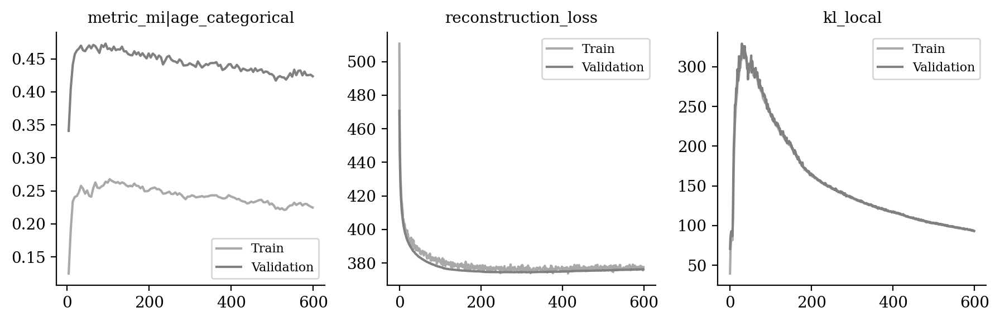

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|age_categorical", "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

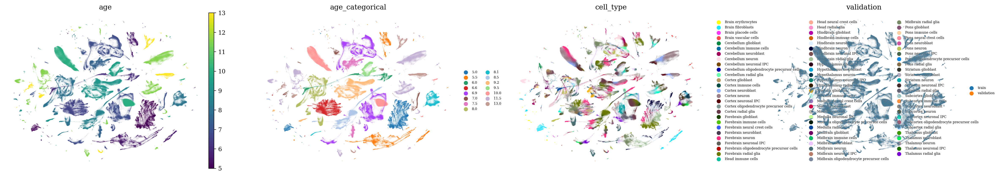

In [13]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

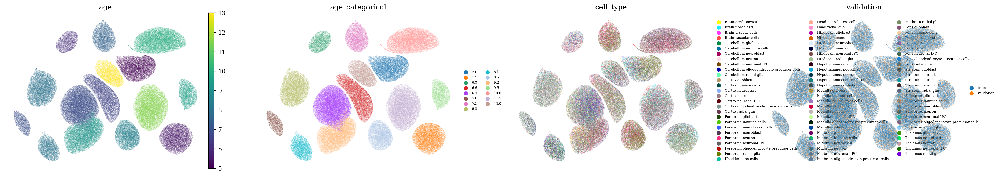

In [14]:
sublatent = DM.configurations.get_by_obs_key("age_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

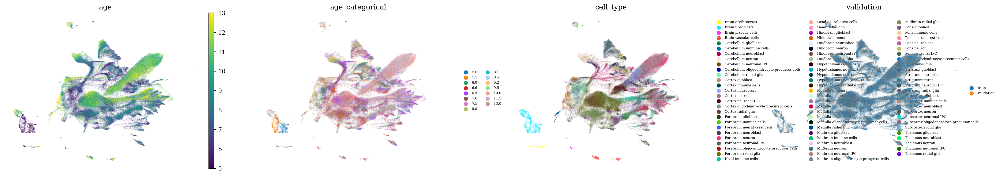

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )